In [285]:
import tensorflow as tf
import pandas as pd
import numpy as np

tf.random.set_seed(42)
filename = 'D:/ME program/2017-PhD/01_research/02Study/34_ballon_like_cover/DeepLearing/SensorCallbi/Data/210805_70ms_Mean3ea.csv'
SensorData = pd.read_csv(filename)

In [286]:
SensorData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17460 entries, 0 to 17459
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Sx00       17460 non-null  float64
 1   Sx01       17460 non-null  float64
 2   Sx02       17460 non-null  float64
 3   Sx03       17460 non-null  float64
 4   Sx04       17460 non-null  float64
 5   Sx05       17460 non-null  float64
 6   Sx06       17460 non-null  float64
 7   Sx07       17460 non-null  float64
 8   Sx08       17460 non-null  float64
 9   Sx09       17460 non-null  float64
 10  r          17460 non-null  float64
 11  theta      17460 non-null  int64  
 12  theta_enc  17460 non-null  float64
dtypes: float64(12), int64(1)
memory usage: 1.7 MB


In [287]:
import numpy as np
toRad = np.pi/180 
SensorData['cos']=np.cos(SensorData.theta_enc*toRad)
SensorData['sin']=np.sin(SensorData.theta_enc*toRad)

In [288]:
SensorData.describe()

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,theta_enc,cos,sin
count,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000,17460.000000
mean,65.572538,66.194493,57.164222,59.867471,63.956854,95.573140,80.626290,96.946137,70.301565,62.580304,0.894433,163.233104,161.054516,0.085156,0.001740
std,2.444883,2.742471,2.509686,2.358246,2.251420,2.625089,2.740268,2.754008,2.756882,2.353402,0.573052,108.830563,109.787439,0.721876,0.686803
min,50.000000,49.330000,41.330000,44.670000,48.330000,64.670000,60.670000,66.000000,54.000000,46.330000,0.000000,0.000000,0.000000,-0.999555,-0.999857
25%,65.330000,66.000000,56.670000,59.330000,63.330000,95.330000,80.330000,96.330000,69.670000,62.330000,0.400000,60.000000,58.400000,-0.636751,-0.650244
50%,66.000000,66.670000,57.670000,60.330000,64.330000,96.000000,81.000000,97.330000,70.670000,63.000000,0.800000,160.000000,157.740000,0.183780,0.000000
75%,66.670000,67.670000,58.330000,61.000000,65.000000,96.670000,82.000000,98.330000,71.670000,63.670000,1.400000,260.000000,260.460000,0.845262,0.684547
max,70.000000,71.670000,62.330000,65.000000,69.670000,100.330000,85.670000,102.670000,76.330000,67.330000,1.800000,350.000000,339.570000,1.000000,0.995329


In [289]:
SensorData.head(5)

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,theta_enc,cos,sin
0,67.00,67.67,58.00,57.00,63.67,95.67,82.67,100.00,69.00,63.00,0.0,0,0.0,1.0,0.0
1,67.33,67.33,58.33,57.33,64.33,96.00,82.67,100.00,68.67,63.00,0.0,0,0.0,1.0,0.0
2,67.33,67.33,57.33,58.00,63.67,96.67,83.00,99.67,69.33,62.67,0.0,0,0.0,1.0,0.0
3,66.33,66.67,56.33,57.67,64.00,97.00,83.00,99.33,68.67,62.33,0.0,0,0.0,1.0,0.0
4,65.67,66.33,56.00,58.00,63.67,96.67,82.33,99.33,69.33,63.33,0.0,0,0.0,1.0,0.0


In [290]:
SensorData_extractZ = SensorData # SensorData[SensorData['z']==0]
mask = SensorData_extractZ["r"].isin([0,0.2,0.4])
SensorData_extractZr = SensorData_extractZ[~mask]
SensorData_extractZr.describe()

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,theta_enc,cos,sin
count,12180.000000,12180.000000,12180.000000,12180.00000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000,12180.000000
mean,65.420445,66.012011,57.028630,59.78197,63.997094,95.465369,80.478057,96.819509,70.203784,62.558030,1.195369,163.660920,161.550865,0.082235,0.001697
std,2.825718,3.164741,2.866304,2.71228,2.569612,3.004683,3.118357,3.094645,3.136999,2.721594,0.399628,108.711923,109.590801,0.721274,0.687808
min,50.000000,49.330000,41.330000,44.67000,48.330000,78.000000,62.000000,79.670000,54.000000,46.330000,0.600000,0.000000,0.000000,-0.999555,-0.999857
25%,65.000000,66.000000,56.670000,59.33000,63.330000,95.330000,80.330000,96.330000,69.670000,62.330000,0.800000,70.000000,69.080000,-0.636751,-0.650907
50%,66.000000,66.670000,57.670000,60.33000,64.330000,96.000000,81.330000,97.330000,71.000000,63.000000,1.200000,160.000000,157.760000,0.183780,0.000000
75%,67.000000,67.670000,58.670000,61.33000,65.330000,97.000000,82.000000,98.670000,72.000000,64.000000,1.600000,260.000000,260.460000,0.781194,0.684547
max,70.000000,71.670000,62.330000,65.00000,69.670000,100.330000,85.670000,102.670000,76.330000,67.330000,1.800000,350.000000,339.570000,1.000000,0.995329


In [291]:
SensorData_extractZr.sample(10)

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,theta_enc,cos,sin
6936,65.33,66.33,59.33,60.33,63.33,97.33,82.00,89.00,74.00,66.33,1.2,120,118.74,-0.480836,0.876811
12895,65.33,68.00,59.67,47.33,67.33,97.00,80.33,100.00,71.67,63.67,1.6,250,251.19,-0.322431,-0.946593
1683,51.00,68.33,59.33,59.33,66.00,96.33,81.33,96.33,68.67,63.67,1.8,0,0.04,1.000000,0.000698
3456,67.00,67.67,57.00,59.33,64.00,97.33,79.67,96.00,73.67,47.67,1.8,40,38.63,0.781194,0.624289
11420,65.33,66.33,57.00,62.33,55.00,97.67,82.67,98.67,72.00,63.33,1.0,220,220.56,-0.759725,-0.650244
3355,68.33,67.67,59.00,60.00,64.33,96.33,82.33,97.33,72.33,51.33,1.4,40,38.67,0.780758,0.624834
7293,67.33,66.67,58.00,60.00,63.67,98.00,79.33,95.33,70.33,62.00,0.8,130,124.06,-0.560061,0.828452
11972,65.67,67.67,58.00,57.33,57.33,97.33,81.67,97.00,70.00,63.33,1.6,230,230.49,-0.636213,-0.771514
12774,66.00,66.33,58.00,50.67,65.33,98.00,80.67,97.00,71.67,62.00,1.0,250,251.19,-0.322431,-0.946593
11150,67.00,64.67,57.33,60.67,53.00,95.33,82.00,97.67,70.33,63.00,1.8,210,207.95,-0.883357,-0.468701


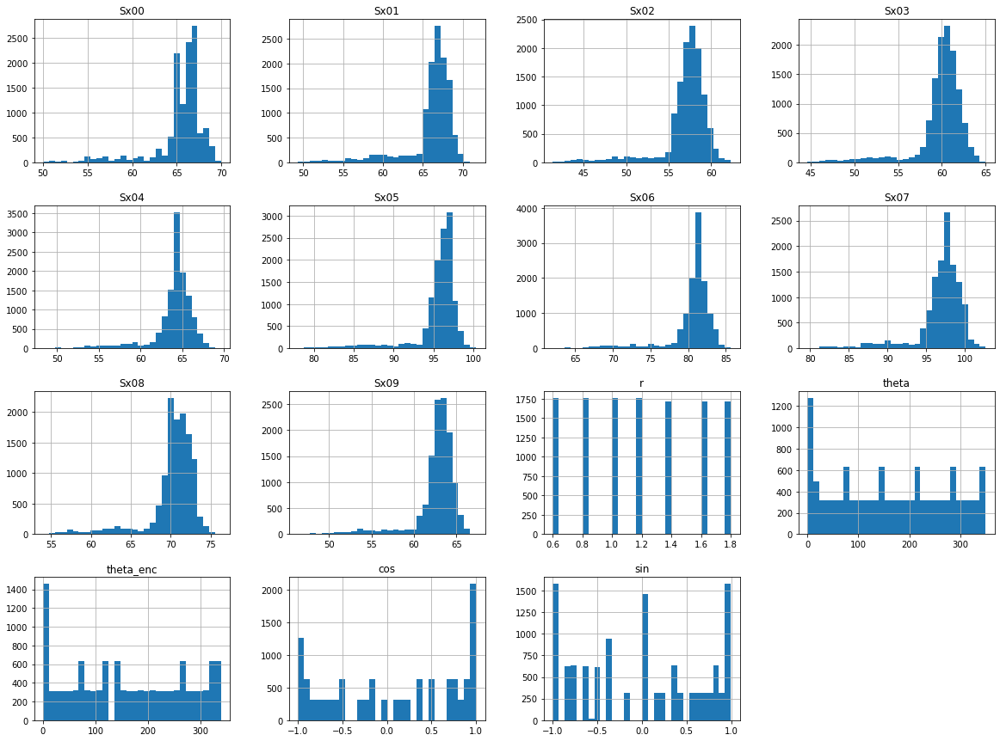

In [292]:
%matplotlib inline
import matplotlib.pyplot as plt
SensorData_extractZr.hist(bins=30, figsize=(20,15))
plt.show()

<AxesSubplot:xlabel='z', ylabel='Sx00'>

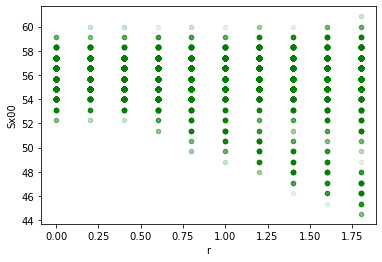

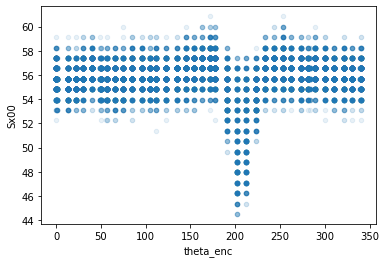

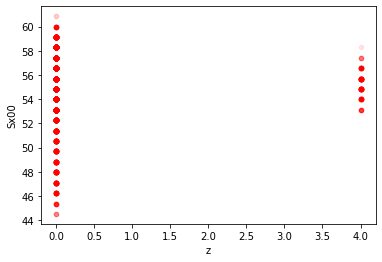

In [169]:
SensorData.plot(kind="scatter", x= "r",y= "Sx00",alpha = 0.1,color='green')
SensorData.plot(kind="scatter", x= "theta_enc",y= "Sx00",alpha = 0.1)
SensorData.plot(kind="scatter", x= "z",y= "Sx00",alpha = 0.1,color='red')

In [ ]:
SensorData.plot(kind="scatter", x= "r",y= "Sx00",alpha = 0.1,color='green')
SensorData.plot(kind="scatter", x= "theta",y= "Sx00",alpha = 0.1)
SensorData.plot(kind="scatter", x= "z",y= "Sx00",alpha = 0.1,color='red')

In [293]:
X = SensorData_extractZr.iloc[:,:10]
y = SensorData_extractZr.iloc[:,13:15]

In [294]:
X

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09
133,66.00,66.67,59.00,59.00,63.67,95.67,82.00,98.67,70.67,63.00
134,65.67,66.67,59.33,58.33,64.33,95.67,82.00,97.33,70.00,63.33
135,65.67,66.67,59.33,58.67,65.33,96.33,81.33,96.33,69.67,64.00
136,66.33,66.67,58.33,58.67,64.67,96.33,81.33,96.33,70.00,64.00
137,66.33,67.00,58.33,58.67,64.67,95.67,81.33,97.00,70.00,64.00
...,...,...,...,...,...,...,...,...,...,...
17455,61.67,59.00,59.00,60.00,64.67,97.33,81.33,98.67,70.67,64.67
17456,62.00,59.00,59.67,60.00,64.67,97.33,82.00,98.67,70.67,65.67
17457,63.00,59.00,59.00,59.67,65.00,97.33,81.67,98.67,71.67,65.33
17458,63.00,58.67,58.33,60.00,65.33,97.33,81.00,98.33,71.67,65.67


In [295]:
y

,cos,sin
133,1.000000,0.000000
134,1.000000,0.000000
135,1.000000,0.000000
136,1.000000,0.000000
137,1.000000,0.000000
...,...,...
17455,0.937099,-0.349063
17456,0.937099,-0.349063
17457,0.937099,-0.349063
17458,0.936794,-0.349880


In [296]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, test_size = 0.25, random_state=42)

In [297]:
X_sum = len(X_train)+len(X_valid)+len(X_test)
X_train_per = int(len(X_train)/X_sum*100)
X_valid_per = int(len(X_valid)/X_sum*100)
X_test_per = int(len(X_test)/X_sum*100)

print('X_train: ',len(X_train),'ea',X_train_per,'%   ', 
      'X_valid: ',len(X_valid),'ea',X_valid_per,'%   ',
      'X_test: ',len(X_test),'ea',X_test_per,'%',)

X_train:  7308 ea 60 %    X_valid:  2436 ea 20 %    X_test:  2436 ea 20 %


In [298]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

In [299]:
import pickle
from joblib import dump, load

file_name = '210805_70ms_Mean3_SS_wo6.pkl'
dump(scaler, file_name)

['210805_70ms_Mean3_SS_wo6.pkl']

In [300]:
X_train

array([[-0.14525482,  0.41687433,  0.80112642, ..., -0.05549565,
         0.14451737,  0.53159775],
       [-0.02968316, -0.20502768,  0.45234037, ..., -2.54723475,
         0.6761838 ,  0.77647068],
       [ 0.320534  , -0.20502768,  0.80112642, ..., -2.97930946,
         1.31674576,  0.16611576],
       ...,
       [ 0.20496234,  0.52259768, -2.45304738, ...,  0.48378556,
         0.6761838 , -0.19936622],
       [ 0.20496234,  0.72782534, -3.38430613, ..., -0.27315735,
         0.46479835,  0.53159775],
       [ 0.5551795 ,  0.41687433,  0.10355433, ..., -0.59802555,
         0.03562184,  0.28672482]])

In [301]:
X_valid

array([[-0.37990032,  0.52259768,  1.14991246, ...,  1.45839017,
         0.03562184,  0.53159775],
       [ 0.5551795 ,  0.62521151, -0.36033111, ...,  0.59424075,
         0.78507933, -0.07875717],
       [-0.49547198, -0.92954353,  0.91971367, ...,  0.48378556,
         0.03562184,  0.41098869],
       ...,
       [ 1.02096833,  0.72782534, -0.59401776, ...,  0.37657906,
         0.14451737, -4.58515003],
       [-3.06256377,  0.62521151,  1.03481307, ...,  0.05171086,
        -0.39035187,  1.01768879],
       [ 0.20496234,  0.62521151, -1.1730026 , ..., -0.05549565,
        -0.28465914, -0.19936622]])

In [302]:
X_test[2]

array([-5.04829508,  0.72782534,  0.80112642, -0.17100805,  0.7754947 ,
        0.29432816,  0.27432518, -0.16595084, -0.49604459,  0.41098869])

In [303]:
import numpy as np
np.random.seed(42)
tf.random.set_seed(42)

In [327]:
from tensorflow import keras
model = keras.models.Sequential()
model.add(keras.layers.Dense(16, activation="relu", input_shape=X_train.shape[1:]))
model.add(keras.layers.Dense(16, activation="relu", input_shape=X_train.shape[1:]))
model.add(keras.layers.Dense(16, activation="relu", input_shape=X_train.shape[1:]))
model.add(keras.layers.Dense(2))

model.compile(loss="mean_squared_error", optimizer=keras.optimizers.SGD(learning_rate=1e-5))


In [328]:
model.summary()

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_75 (Dense)             (None, 16)                176       
_________________________________________________________________
dense_76 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_77 (Dense)             (None, 16)                272       
_________________________________________________________________
dense_78 (Dense)             (None, 2)                 34        
Total params: 754
Trainable params: 754
Non-trainable params: 0
_________________________________________________________________


## Callback (best, early stopping, tensorboard)

In [79]:
# best call back
checkpoint_cb = keras.callbacks.ModelCheckpoint("Mean11_0722.h5", save_best_only=True)
history = model.fit(X_train, y_train, epochs=1000,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb])
model = keras.models.load_model("Mean11_0722.h5") # rollback to best model
mse_test = model.evaluate(X_test, y_test)
X_new = X_test[:5]
y_pred = model.predict(X_new)

Epoch 1/1000
216/216 [==============================] - 0s 1ms/step - loss: 32147.7617 - val_loss: 8581.8779
Epoch 2/1000
216/216 [==============================] - 0s 818us/step - loss: 7415.7925 - val_loss: 7210.0137
Epoch 3/1000
216/216 [==============================] - 0s 725us/step - loss: 5986.9238 - val_loss: 5352.7998
Epoch 4/1000
216/216 [==============================] - 0s 869us/step - loss: 5275.5835 - val_loss: 4572.2695
Epoch 5/1000
216/216 [==============================] - 0s 1ms/step - loss: 4696.6318 - val_loss: 4319.7734
Epoch 6/1000
216/216 [==============================] - 0s 841us/step - loss: 4235.8193 - val_loss: 4570.3223
Epoch 7/1000
216/216 [==============================] - 0s 762us/step - loss: 3937.9639 - val_loss: 3609.2185
Epoch 8/1000
216/216 [==============================] - 0s 767us/step - loss: 3719.9514 - val_loss: 3758.1201
Epoch 9/1000
216/216 [==============================] - 0s 804us/step - loss: 3445.8953 - val_loss: 2822.5664
Epoch 10/1000

216/216 [==============================] - 0s 744us/step - loss: 78.0786 - val_loss: 539.2569
Epoch 151/1000
216/216 [==============================] - 0s 902us/step - loss: 77.2673 - val_loss: 533.8986
Epoch 152/1000
216/216 [==============================] - 0s 758us/step - loss: 73.9904 - val_loss: 524.2444
Epoch 153/1000
216/216 [==============================] - 0s 795us/step - loss: 73.4930 - val_loss: 527.9186
Epoch 154/1000
216/216 [==============================] - 0s 809us/step - loss: 74.0851 - val_loss: 541.7499
Epoch 155/1000
216/216 [==============================] - 0s 832us/step - loss: 80.8575 - val_loss: 554.2726
Epoch 156/1000
216/216 [==============================] - 0s 860us/step - loss: 73.5318 - val_loss: 517.8912
Epoch 157/1000
216/216 [==============================] - 0s 804us/step - loss: 76.3381 - val_loss: 524.2439
Epoch 158/1000
216/216 [==============================] - 0s 786us/step - loss: 75.6676 - val_loss: 543.6609
Epoch 159/1000
216/216 [==========

216/216 [==============================] - 0s 725us/step - loss: 25.4383 - val_loss: 516.8298
Epoch 301/1000
216/216 [==============================] - 0s 832us/step - loss: 24.4952 - val_loss: 521.9685
Epoch 302/1000
216/216 [==============================] - 0s 837us/step - loss: 26.8581 - val_loss: 509.1884
Epoch 303/1000
216/216 [==============================] - 0s 846us/step - loss: 26.2352 - val_loss: 506.4538
Epoch 304/1000
216/216 [==============================] - 0s 925us/step - loss: 25.5677 - val_loss: 511.1271
Epoch 305/1000
216/216 [==============================] - 0s 790us/step - loss: 26.9781 - val_loss: 514.5386
Epoch 306/1000
216/216 [==============================] - 0s 920us/step - loss: 26.5405 - val_loss: 513.8042
Epoch 307/1000
216/216 [==============================] - 0s 827us/step - loss: 26.7034 - val_loss: 514.7090
Epoch 308/1000
216/216 [==============================] - 0s 739us/step - loss: 26.0819 - val_loss: 530.7125
Epoch 309/1000
216/216 [==========

216/216 [==============================] - 0s 902us/step - loss: 15.6938 - val_loss: 509.7848
Epoch 451/1000
216/216 [==============================] - 0s 809us/step - loss: 14.7566 - val_loss: 514.1184
Epoch 452/1000
216/216 [==============================] - 0s 800us/step - loss: 14.8871 - val_loss: 508.4984
Epoch 453/1000
216/216 [==============================] - 0s 730us/step - loss: 15.5528 - val_loss: 519.7957
Epoch 454/1000
216/216 [==============================] - 0s 739us/step - loss: 13.9310 - val_loss: 509.6668
Epoch 455/1000
216/216 [==============================] - 0s 874us/step - loss: 14.4021 - val_loss: 509.3159
Epoch 456/1000
216/216 [==============================] - 0s 776us/step - loss: 15.4628 - val_loss: 508.4385
Epoch 457/1000
216/216 [==============================] - 0s 739us/step - loss: 15.1847 - val_loss: 511.6776
Epoch 458/1000
216/216 [==============================] - 0s 2ms/step - loss: 14.6232 - val_loss: 506.7745
Epoch 459/1000
216/216 [============

216/216 [==============================] - 0s 725us/step - loss: 10.0883 - val_loss: 499.9437
Epoch 601/1000
216/216 [==============================] - 0s 758us/step - loss: 10.3710 - val_loss: 506.3046
Epoch 602/1000
216/216 [==============================] - 0s 809us/step - loss: 9.8822 - val_loss: 508.4459
Epoch 603/1000
216/216 [==============================] - 0s 744us/step - loss: 10.0401 - val_loss: 506.7016
Epoch 604/1000
216/216 [==============================] - 0s 758us/step - loss: 10.3986 - val_loss: 505.8903
Epoch 605/1000
216/216 [==============================] - 0s 762us/step - loss: 10.7678 - val_loss: 504.5239
Epoch 606/1000
216/216 [==============================] - 0s 734us/step - loss: 10.2064 - val_loss: 496.9984
Epoch 607/1000
216/216 [==============================] - 0s 744us/step - loss: 10.3328 - val_loss: 506.8208
Epoch 608/1000
216/216 [==============================] - 0s 767us/step - loss: 10.1668 - val_loss: 506.7547
Epoch 609/1000
216/216 [===========

Epoch 751/1000
216/216 [==============================] - 0s 734us/step - loss: 7.9598 - val_loss: 499.4935
Epoch 752/1000
216/216 [==============================] - 0s 739us/step - loss: 8.6563 - val_loss: 500.0713
Epoch 753/1000
216/216 [==============================] - 0s 800us/step - loss: 7.6898 - val_loss: 503.6830
Epoch 754/1000
216/216 [==============================] - 0s 748us/step - loss: 7.9086 - val_loss: 502.1691
Epoch 755/1000
216/216 [==============================] - 0s 739us/step - loss: 8.0293 - val_loss: 497.2512
Epoch 756/1000
216/216 [==============================] - 0s 837us/step - loss: 7.8522 - val_loss: 499.8311
Epoch 757/1000
216/216 [==============================] - 0s 837us/step - loss: 7.9805 - val_loss: 507.6687
Epoch 758/1000
216/216 [==============================] - 0s 823us/step - loss: 7.6842 - val_loss: 502.6042
Epoch 759/1000
216/216 [==============================] - 0s 748us/step - loss: 8.0939 - val_loss: 503.7860
Epoch 760/1000
216/216 [====

Epoch 827/1000
216/216 [==============================] - 0s 869us/step - loss: 7.1813 - val_loss: 496.3326
Epoch 828/1000
216/216 [==============================] - 0s 725us/step - loss: 6.7437 - val_loss: 501.6613
Epoch 829/1000
216/216 [==============================] - 0s 758us/step - loss: 6.7285 - val_loss: 499.9556
Epoch 830/1000
216/216 [==============================] - 0s 786us/step - loss: 7.2221 - val_loss: 497.6570
Epoch 831/1000
216/216 [==============================] - 0s 818us/step - loss: 6.7054 - val_loss: 498.4084
Epoch 832/1000
216/216 [==============================] - 0s 776us/step - loss: 6.7329 - val_loss: 497.2603
Epoch 833/1000
216/216 [==============================] - 0s 804us/step - loss: 6.8014 - val_loss: 495.9098
Epoch 834/1000
216/216 [==============================] - 0s 772us/step - loss: 7.1909 - val_loss: 496.2400
Epoch 835/1000
216/216 [==============================] - 0s 744us/step - loss: 7.0856 - val_loss: 499.1546
Epoch 836/1000
216/216 [====

Epoch 903/1000
216/216 [==============================] - 0s 776us/step - loss: 6.3440 - val_loss: 497.8737
Epoch 904/1000
216/216 [==============================] - 0s 804us/step - loss: 6.2992 - val_loss: 500.5577
Epoch 905/1000
216/216 [==============================] - 0s 725us/step - loss: 6.3777 - val_loss: 498.5903
Epoch 906/1000
216/216 [==============================] - 0s 790us/step - loss: 6.9723 - val_loss: 504.0820
Epoch 907/1000
216/216 [==============================] - 0s 762us/step - loss: 6.3017 - val_loss: 498.3535
Epoch 908/1000
216/216 [==============================] - 0s 776us/step - loss: 6.5320 - val_loss: 496.6753
Epoch 909/1000
216/216 [==============================] - 0s 748us/step - loss: 6.2847 - val_loss: 498.8763
Epoch 910/1000
216/216 [==============================] - 0s 758us/step - loss: 6.0808 - val_loss: 495.6838
Epoch 911/1000
216/216 [==============================] - 0s 767us/step - loss: 6.1064 - val_loss: 494.3387
Epoch 912/1000
216/216 [====

Epoch 979/1000
216/216 [==============================] - 0s 767us/step - loss: 6.5319 - val_loss: 495.5961
Epoch 980/1000
216/216 [==============================] - 0s 818us/step - loss: 5.4353 - val_loss: 503.1260
Epoch 981/1000
216/216 [==============================] - 0s 851us/step - loss: 5.4085 - val_loss: 497.8587
Epoch 982/1000
216/216 [==============================] - 0s 762us/step - loss: 5.7017 - val_loss: 500.5749
Epoch 983/1000
216/216 [==============================] - 0s 790us/step - loss: 5.2637 - val_loss: 497.4393
Epoch 984/1000
216/216 [==============================] - 0s 855us/step - loss: 5.6244 - val_loss: 495.8564
Epoch 985/1000
216/216 [==============================] - 0s 790us/step - loss: 5.9345 - val_loss: 496.0684
Epoch 986/1000
216/216 [==============================] - 0s 725us/step - loss: 5.7722 - val_loss: 499.0296
Epoch 987/1000
216/216 [==============================] - 0s 748us/step - loss: 5.5492 - val_loss: 496.1173
Epoch 988/1000
216/216 [====

In [14]:
# early stopping callback
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10,
                                                  restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=10000,
                    validation_data=(X_valid, y_valid),
                    callbacks=[checkpoint_cb, early_stopping_cb])
mse_test = model.evaluate(X_test, y_test)
X_new = X_test[:5]
y_pred = model.predict(X_new)

Epoch 1/10000
13/13 [==============================] - 0s 4ms/step - loss: 1.0979 - val_loss: 0.7938
Epoch 2/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0978 - val_loss: 0.7906
Epoch 3/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0985 - val_loss: 0.8101
Epoch 4/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.1034 - val_loss: 0.8008
Epoch 5/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0994 - val_loss: 0.8048
Epoch 6/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.1010 - val_loss: 0.7937
Epoch 7/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0985 - val_loss: 0.7935
Epoch 8/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0983 - val_loss: 0.7933
Epoch 9/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0977 - val_loss: 0.7899
Epoch 10/10000
13/13 [==============================] - 0s 2ms/step - loss: 1.0992 - val_lo

In [330]:
import os 
root_logdir = os.path.join(os.curdir, "my_logs_ManyData_0805")

def get_run_logdir():
    import time
    run_id= time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

In [332]:
tensorboard_cb = keras.callbacks.TensorBoard(run_logdir)
history = model.fit(X_train, y_train, epochs=100000,
                    validation_data=(X_valid, y_valid),
                    callbacks=[tensorboard_cb])
mse_test = model.evaluate(X_test, y_test)
X_new = X_test[:5]
y_pred = model.predict(X_new)

Epoch 1/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.2033 - val_loss: 0.2047
Epoch 2/100000
229/229 [==============================] - 0s 886us/step - loss: 0.2032 - val_loss: 0.2045
Epoch 3/100000
229/229 [==============================] - 0s 859us/step - loss: 0.2031 - val_loss: 0.2044
Epoch 4/100000
229/229 [==============================] - 0s 855us/step - loss: 0.2030 - val_loss: 0.2043
Epoch 5/100000
229/229 [==============================] - 0s 868us/step - loss: 0.2029 - val_loss: 0.2042
Epoch 6/100000
229/229 [==============================] - 0s 815us/step - loss: 0.2028 - val_loss: 0.2041
Epoch 7/100000
229/229 [==============================] - 0s 877us/step - loss: 0.2027 - val_loss: 0.2039
Epoch 8/100000
229/229 [==============================] - 0s 890us/step - loss: 0.2026 - val_loss: 0.2038
Epoch 9/100000
229/229 [==============================] - 0s 803us/step - loss: 0.2024 - val_loss: 0.2037
Epoch 10/100000
229/229 [=======================

Epoch 78/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1950 - val_loss: 0.1959
Epoch 79/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1949 - val_loss: 0.1957
Epoch 80/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1948 - val_loss: 0.1956
Epoch 81/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1947 - val_loss: 0.1955
Epoch 82/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1946 - val_loss: 0.1954
Epoch 83/100000
229/229 [==============================] - 0s 837us/step - loss: 0.1945 - val_loss: 0.1953
Epoch 84/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1944 - val_loss: 0.1952
Epoch 85/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1943 - val_loss: 0.1951
Epoch 86/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.1942 - val_loss: 0.1950
Epoch 87/100000
229/229 [==============

229/229 [==============================] - 0s 1ms/step - loss: 0.1874 - val_loss: 0.1878
Epoch 155/100000
229/229 [==============================] - 0s 964us/step - loss: 0.1873 - val_loss: 0.1877
Epoch 156/100000
229/229 [==============================] - 0s 973us/step - loss: 0.1872 - val_loss: 0.1876
Epoch 157/100000
229/229 [==============================] - 0s 929us/step - loss: 0.1871 - val_loss: 0.1875
Epoch 158/100000
229/229 [==============================] - 0s 877us/step - loss: 0.1870 - val_loss: 0.1874
Epoch 159/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1869 - val_loss: 0.1873
Epoch 160/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1868 - val_loss: 0.1872
Epoch 161/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1867 - val_loss: 0.1871
Epoch 162/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1866 - val_loss: 0.1870
Epoch 163/100000
229/229 [=====================

229/229 [==============================] - 0s 859us/step - loss: 0.1804 - val_loss: 0.1804
Epoch 231/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1803 - val_loss: 0.1803
Epoch 232/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1802 - val_loss: 0.1802
Epoch 233/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1801 - val_loss: 0.1802
Epoch 234/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1800 - val_loss: 0.1801
Epoch 235/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1800 - val_loss: 0.1800
Epoch 236/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1799 - val_loss: 0.1799
Epoch 237/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1798 - val_loss: 0.1798
Epoch 238/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1797 - val_loss: 0.1797
Epoch 239/100000
229/229 [===================

229/229 [==============================] - 0s 732us/step - loss: 0.1740 - val_loss: 0.1736
Epoch 307/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1739 - val_loss: 0.1736
Epoch 308/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1738 - val_loss: 0.1735
Epoch 309/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1737 - val_loss: 0.1734
Epoch 310/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1737 - val_loss: 0.1733
Epoch 311/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1736 - val_loss: 0.1732
Epoch 312/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1735 - val_loss: 0.1731
Epoch 313/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1734 - val_loss: 0.1731
Epoch 314/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1733 - val_loss: 0.1730
Epoch 315/100000
229/229 [===================

229/229 [==============================] - 0s 767us/step - loss: 0.1682 - val_loss: 0.1675
Epoch 383/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1681 - val_loss: 0.1674
Epoch 384/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1680 - val_loss: 0.1673
Epoch 385/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1680 - val_loss: 0.1672
Epoch 386/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1679 - val_loss: 0.1672
Epoch 387/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1678 - val_loss: 0.1671
Epoch 388/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1677 - val_loss: 0.1670
Epoch 389/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1677 - val_loss: 0.1669
Epoch 390/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1676 - val_loss: 0.1669
Epoch 391/100000
229/229 [===================

229/229 [==============================] - 0s 780us/step - loss: 0.1629 - val_loss: 0.1619
Epoch 459/100000
229/229 [==============================] - 0s 947us/step - loss: 0.1629 - val_loss: 0.1618
Epoch 460/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1628 - val_loss: 0.1618
Epoch 461/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1628 - val_loss: 0.1617
Epoch 462/100000
229/229 [==============================] - 0s 890us/step - loss: 0.1627 - val_loss: 0.1616
Epoch 463/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1626 - val_loss: 0.1616
Epoch 464/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1626 - val_loss: 0.1615
Epoch 465/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1625 - val_loss: 0.1614
Epoch 466/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1624 - val_loss: 0.1614
Epoch 467/100000
229/229 [===================

229/229 [==============================] - 0s 807us/step - loss: 0.1583 - val_loss: 0.1569
Epoch 535/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1582 - val_loss: 0.1569
Epoch 536/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1582 - val_loss: 0.1568
Epoch 537/100000
229/229 [==============================] - 0s 859us/step - loss: 0.1581 - val_loss: 0.1568
Epoch 538/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1581 - val_loss: 0.1567
Epoch 539/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1580 - val_loss: 0.1566
Epoch 540/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1579 - val_loss: 0.1566
Epoch 541/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1579 - val_loss: 0.1565
Epoch 542/100000
229/229 [==============================] - 0s 890us/step - loss: 0.1578 - val_loss: 0.1565
Epoch 543/100000
229/229 [===================

229/229 [==============================] - 0s 732us/step - loss: 0.1542 - val_loss: 0.1526
Epoch 611/100000
229/229 [==============================] - 0s 714us/step - loss: 0.1541 - val_loss: 0.1525
Epoch 612/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1541 - val_loss: 0.1524
Epoch 613/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1540 - val_loss: 0.1524
Epoch 614/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1540 - val_loss: 0.1523
Epoch 615/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1539 - val_loss: 0.1523
Epoch 616/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1539 - val_loss: 0.1522
Epoch 617/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1538 - val_loss: 0.1522
Epoch 618/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1538 - val_loss: 0.1521
Epoch 619/100000
229/229 [===================

229/229 [==============================] - 0s 701us/step - loss: 0.1505 - val_loss: 0.1487
Epoch 687/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1505 - val_loss: 0.1486
Epoch 688/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1504 - val_loss: 0.1486
Epoch 689/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1504 - val_loss: 0.1485
Epoch 690/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1503 - val_loss: 0.1485
Epoch 691/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1503 - val_loss: 0.1484
Epoch 692/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1502 - val_loss: 0.1484
Epoch 693/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1502 - val_loss: 0.1483
Epoch 694/100000
229/229 [==============================] - 0s 693us/step - loss: 0.1501 - val_loss: 0.1483
Epoch 695/100000
229/229 [===================

229/229 [==============================] - 0s 820us/step - loss: 0.1472 - val_loss: 0.1452
Epoch 763/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1472 - val_loss: 0.1451
Epoch 764/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1472 - val_loss: 0.1451
Epoch 765/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1471 - val_loss: 0.1451
Epoch 766/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1471 - val_loss: 0.1450
Epoch 767/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1470 - val_loss: 0.1450
Epoch 768/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1470 - val_loss: 0.1449
Epoch 769/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1470 - val_loss: 0.1449
Epoch 770/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1469 - val_loss: 0.1448
Epoch 771/100000
229/229 [===================

229/229 [==============================] - 0s 706us/step - loss: 0.1443 - val_loss: 0.1421
Epoch 839/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1443 - val_loss: 0.1421
Epoch 840/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1443 - val_loss: 0.1420
Epoch 841/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1442 - val_loss: 0.1420
Epoch 842/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1442 - val_loss: 0.1420
Epoch 843/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1442 - val_loss: 0.1419
Epoch 844/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1441 - val_loss: 0.1419
Epoch 845/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1441 - val_loss: 0.1418
Epoch 846/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1440 - val_loss: 0.1418
Epoch 847/100000
229/229 [===================

229/229 [==============================] - 0s 710us/step - loss: 0.1417 - val_loss: 0.1394
Epoch 915/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1417 - val_loss: 0.1393
Epoch 916/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1417 - val_loss: 0.1393
Epoch 917/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1416 - val_loss: 0.1393
Epoch 918/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1416 - val_loss: 0.1392
Epoch 919/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1416 - val_loss: 0.1392
Epoch 920/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1415 - val_loss: 0.1392
Epoch 921/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1415 - val_loss: 0.1391
Epoch 922/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1415 - val_loss: 0.1391
Epoch 923/100000
229/229 [===================

229/229 [==============================] - 0s 710us/step - loss: 0.1394 - val_loss: 0.1369
Epoch 991/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1393 - val_loss: 0.1368
Epoch 992/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1393 - val_loss: 0.1368
Epoch 993/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1393 - val_loss: 0.1368
Epoch 994/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1393 - val_loss: 0.1368
Epoch 995/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1392 - val_loss: 0.1367
Epoch 996/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1392 - val_loss: 0.1367
Epoch 997/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1392 - val_loss: 0.1367
Epoch 998/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1391 - val_loss: 0.1366
Epoch 999/100000
229/229 [===================

229/229 [==============================] - 0s 723us/step - loss: 0.1373 - val_loss: 0.1347
Epoch 1066/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1372 - val_loss: 0.1346
Epoch 1067/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1372 - val_loss: 0.1346
Epoch 1068/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1372 - val_loss: 0.1346
Epoch 1069/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1372 - val_loss: 0.1346
Epoch 1070/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1371 - val_loss: 0.1345
Epoch 1071/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1371 - val_loss: 0.1345
Epoch 1072/100000
229/229 [==============================] - 0s 837us/step - loss: 0.1371 - val_loss: 0.1345
Epoch 1073/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1371 - val_loss: 0.1344
Epoch 1074/100000
229/229 [==========

229/229 [==============================] - 0s 837us/step - loss: 0.1354 - val_loss: 0.1327
Epoch 1141/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1353 - val_loss: 0.1326
Epoch 1142/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1353 - val_loss: 0.1326
Epoch 1143/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1353 - val_loss: 0.1326
Epoch 1144/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1353 - val_loss: 0.1326
Epoch 1145/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1352 - val_loss: 0.1325
Epoch 1146/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1352 - val_loss: 0.1325
Epoch 1147/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1352 - val_loss: 0.1325
Epoch 1148/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1352 - val_loss: 0.1324
Epoch 1149/100000
229/229 [==========

229/229 [==============================] - 0s 789us/step - loss: 0.1336 - val_loss: 0.1308
Epoch 1216/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1336 - val_loss: 0.1308
Epoch 1217/100000
229/229 [==============================] - 0s 999us/step - loss: 0.1336 - val_loss: 0.1308
Epoch 1218/100000
229/229 [==============================] - 0s 995us/step - loss: 0.1335 - val_loss: 0.1307
Epoch 1219/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1335 - val_loss: 0.1307
Epoch 1220/100000
229/229 [==============================] - 0s 920us/step - loss: 0.1335 - val_loss: 0.1307
Epoch 1221/100000
229/229 [==============================] - 0s 995us/step - loss: 0.1335 - val_loss: 0.1307
Epoch 1222/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1334 - val_loss: 0.1306
Epoch 1223/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1334 - val_loss: 0.1306
Epoch 1224/100000
229/229 [==========

229/229 [==============================] - 0s 995us/step - loss: 0.1320 - val_loss: 0.1291
Epoch 1291/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1320 - val_loss: 0.1291
Epoch 1292/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1319 - val_loss: 0.1291
Epoch 1293/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1319 - val_loss: 0.1290
Epoch 1294/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1319 - val_loss: 0.1290
Epoch 1295/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1319 - val_loss: 0.1290
Epoch 1296/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1319 - val_loss: 0.1290
Epoch 1297/100000
229/229 [==============================] - 0s 951us/step - loss: 0.1318 - val_loss: 0.1290
Epoch 1298/100000
229/229 [==============================] - 0s 964us/step - loss: 0.1318 - val_loss: 0.1289
Epoch 1299/100000
229/229 [============

229/229 [==============================] - 0s 706us/step - loss: 0.1305 - val_loss: 0.1275
Epoch 1366/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1305 - val_loss: 0.1275
Epoch 1367/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1304 - val_loss: 0.1275
Epoch 1368/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1304 - val_loss: 0.1275
Epoch 1369/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1304 - val_loss: 0.1275
Epoch 1370/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1304 - val_loss: 0.1274
Epoch 1371/100000
229/229 [==============================] - 0s 714us/step - loss: 0.1304 - val_loss: 0.1274
Epoch 1372/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1303 - val_loss: 0.1274
Epoch 1373/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1303 - val_loss: 0.1274
Epoch 1374/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.1291 - val_loss: 0.1261
Epoch 1441/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1290 - val_loss: 0.1261
Epoch 1442/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1290 - val_loss: 0.1260
Epoch 1443/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1290 - val_loss: 0.1260
Epoch 1444/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1290 - val_loss: 0.1260
Epoch 1445/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1290 - val_loss: 0.1260
Epoch 1446/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1289 - val_loss: 0.1260
Epoch 1447/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1289 - val_loss: 0.1259
Epoch 1448/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1289 - val_loss: 0.1259
Epoch 1449/100000
229/229 [==========

229/229 [==============================] - 0s 824us/step - loss: 0.1277 - val_loss: 0.1247
Epoch 1516/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1277 - val_loss: 0.1247
Epoch 1517/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1277 - val_loss: 0.1247
Epoch 1518/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1277 - val_loss: 0.1246
Epoch 1519/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1276 - val_loss: 0.1246
Epoch 1520/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1276 - val_loss: 0.1246
Epoch 1521/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1276 - val_loss: 0.1246
Epoch 1522/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1276 - val_loss: 0.1246
Epoch 1523/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1276 - val_loss: 0.1246
Epoch 1524/100000
229/229 [==========

229/229 [==============================] - 0s 754us/step - loss: 0.1265 - val_loss: 0.1234
Epoch 1591/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1264 - val_loss: 0.1234
Epoch 1592/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1264 - val_loss: 0.1234
Epoch 1593/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1264 - val_loss: 0.1234
Epoch 1594/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1264 - val_loss: 0.1233
Epoch 1595/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1264 - val_loss: 0.1233
Epoch 1596/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1264 - val_loss: 0.1233
Epoch 1597/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1263 - val_loss: 0.1233
Epoch 1598/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1263 - val_loss: 0.1233
Epoch 1599/100000
229/229 [==========

229/229 [==============================] - 0s 820us/step - loss: 0.1253 - val_loss: 0.1222
Epoch 1666/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1252 - val_loss: 0.1222
Epoch 1667/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1252 - val_loss: 0.1222
Epoch 1668/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1252 - val_loss: 0.1221
Epoch 1669/100000
229/229 [==============================] - 0s 885us/step - loss: 0.1252 - val_loss: 0.1221
Epoch 1670/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1252 - val_loss: 0.1221
Epoch 1671/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1252 - val_loss: 0.1221
Epoch 1672/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1252 - val_loss: 0.1221
Epoch 1673/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1251 - val_loss: 0.1221
Epoch 1674/100000
229/229 [==========

229/229 [==============================] - 0s 741us/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1741/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1742/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1743/100000
229/229 [==============================] - 0s 894us/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1744/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1745/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1241 - val_loss: 0.1210
Epoch 1746/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1240 - val_loss: 0.1209
Epoch 1747/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1240 - val_loss: 0.1209
Epoch 1748/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1240 - val_loss: 0.1209
Epoch 1749/100000
229/229 [============

229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1817/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1818/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1819/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1820/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1821/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1230 - val_loss: 0.1199
Epoch 1822/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1229 - val_loss: 0.1198
Epoch 1823/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1229 - val_loss: 0.1198
Epoch 1824/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1229 - val_loss: 0.1198
Epoch 1825/100000
229/229 [============================

Epoch 1892/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1220 - val_loss: 0.1189
Epoch 1893/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1220 - val_loss: 0.1189
Epoch 1894/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1220 - val_loss: 0.1189
Epoch 1895/100000
229/229 [==============================] - 0s 947us/step - loss: 0.1220 - val_loss: 0.1188
Epoch 1896/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1219 - val_loss: 0.1188
Epoch 1897/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1219 - val_loss: 0.1188
Epoch 1898/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1219 - val_loss: 0.1188
Epoch 1899/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1219 - val_loss: 0.1188
Epoch 1900/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1219 - val_loss: 0.1188
Epoch 1901/100000
2

229/229 [==============================] - 0s 776us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1968/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1969/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1970/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1971/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1972/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1210 - val_loss: 0.1179
Epoch 1973/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1209 - val_loss: 0.1178
Epoch 1974/100000
229/229 [==============================] - 0s 942us/step - loss: 0.1209 - val_loss: 0.1178
Epoch 1975/100000
229/229 [==============================] - 0s 890us/step - loss: 0.1209 - val_loss: 0.1178
Epoch 1976/100000
229/229 [==========

229/229 [==============================] - 0s 771us/step - loss: 0.1201 - val_loss: 0.1170
Epoch 2043/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1201 - val_loss: 0.1170
Epoch 2044/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1201 - val_loss: 0.1170
Epoch 2045/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1200 - val_loss: 0.1170
Epoch 2046/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1200 - val_loss: 0.1169
Epoch 2047/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1200 - val_loss: 0.1169
Epoch 2048/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1200 - val_loss: 0.1169
Epoch 2049/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1200 - val_loss: 0.1169
Epoch 2050/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1200 - val_loss: 0.1169
Epoch 2051/100000
229/229 [==========

229/229 [==============================] - 0s 741us/step - loss: 0.1192 - val_loss: 0.1161
Epoch 2118/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1192 - val_loss: 0.1161
Epoch 2119/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1192 - val_loss: 0.1161
Epoch 2120/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1192 - val_loss: 0.1161
Epoch 2121/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1191 - val_loss: 0.1161
Epoch 2122/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1191 - val_loss: 0.1160
Epoch 2123/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1191 - val_loss: 0.1160
Epoch 2124/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1191 - val_loss: 0.1160
Epoch 2125/100000
229/229 [==============================] - 0s 833us/step - loss: 0.1191 - val_loss: 0.1160
Epoch 2126/100000
229/229 [==========

229/229 [==============================] - 0s 763us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2193/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2194/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2195/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2196/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2197/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2198/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1183 - val_loss: 0.1152
Epoch 2199/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1182 - val_loss: 0.1152
Epoch 2200/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1182 - val_loss: 0.1151
Epoch 2201/100000
229/229 [==========

229/229 [==============================] - 0s 710us/step - loss: 0.1175 - val_loss: 0.1144
Epoch 2268/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1175 - val_loss: 0.1144
Epoch 2269/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1175 - val_loss: 0.1144
Epoch 2270/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1175 - val_loss: 0.1144
Epoch 2271/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1174 - val_loss: 0.1144
Epoch 2272/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1174 - val_loss: 0.1143
Epoch 2273/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1174 - val_loss: 0.1143
Epoch 2274/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1174 - val_loss: 0.1143
Epoch 2275/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1174 - val_loss: 0.1143
Epoch 2276/100000
229/229 [==========

229/229 [==============================] - 0s 750us/step - loss: 0.1167 - val_loss: 0.1136
Epoch 2343/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1167 - val_loss: 0.1136
Epoch 2344/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1167 - val_loss: 0.1136
Epoch 2345/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1166 - val_loss: 0.1136
Epoch 2346/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1166 - val_loss: 0.1135
Epoch 2347/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1166 - val_loss: 0.1135
Epoch 2348/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1166 - val_loss: 0.1135
Epoch 2349/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1166 - val_loss: 0.1135
Epoch 2350/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1166 - val_loss: 0.1135
Epoch 2351/100000
229/229 [==========

229/229 [==============================] - 0s 728us/step - loss: 0.1159 - val_loss: 0.1128
Epoch 2418/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1159 - val_loss: 0.1128
Epoch 2419/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1159 - val_loss: 0.1128
Epoch 2420/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1159 - val_loss: 0.1128
Epoch 2421/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1159 - val_loss: 0.1128
Epoch 2422/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1158 - val_loss: 0.1128
Epoch 2423/100000
229/229 [==============================] - 0s 947us/step - loss: 0.1158 - val_loss: 0.1127
Epoch 2424/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1158 - val_loss: 0.1127
Epoch 2425/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1158 - val_loss: 0.1127
Epoch 2426/100000
229/229 [==========

229/229 [==============================] - 0s 710us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2493/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2494/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2495/100000
229/229 [==============================] - 0s 877us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2496/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2497/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2498/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2499/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2500/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1151 - val_loss: 0.1120
Epoch 2501/100000
229/229 [==========

229/229 [==============================] - 0s 802us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2568/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2569/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2570/100000
229/229 [==============================] - 0s 978us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2571/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2572/100000
229/229 [==============================] - 0s 982us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2573/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1144 - val_loss: 0.1113
Epoch 2574/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1143 - val_loss: 0.1112
Epoch 2575/100000
229/229 [==============================] - 0s 942us/step - loss: 0.1143 - val_loss: 0.1112
Epoch 2576/100000
229/229 [==========

229/229 [==============================] - 0s 872us/step - loss: 0.1137 - val_loss: 0.1106
Epoch 2643/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1137 - val_loss: 0.1106
Epoch 2644/100000
229/229 [==============================] - 0s 807us/step - loss: 0.1137 - val_loss: 0.1106
Epoch 2645/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1137 - val_loss: 0.1106
Epoch 2646/100000
229/229 [==============================] - 0s 772us/step - loss: 0.1137 - val_loss: 0.1106
Epoch 2647/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1136 - val_loss: 0.1106
Epoch 2648/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1136 - val_loss: 0.1106
Epoch 2649/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1136 - val_loss: 0.1105
Epoch 2650/100000
229/229 [==============================] - 0s 947us/step - loss: 0.1136 - val_loss: 0.1105
Epoch 2651/100000
229/229 [==========

229/229 [==============================] - 0s 697us/step - loss: 0.1130 - val_loss: 0.1099
Epoch 2718/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1130 - val_loss: 0.1099
Epoch 2719/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1130 - val_loss: 0.1099
Epoch 2720/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1130 - val_loss: 0.1099
Epoch 2721/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1130 - val_loss: 0.1099
Epoch 2722/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1129 - val_loss: 0.1099
Epoch 2723/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1129 - val_loss: 0.1099
Epoch 2724/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1129 - val_loss: 0.1099
Epoch 2725/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1129 - val_loss: 0.1099
Epoch 2726/100000
229/229 [==========

229/229 [==============================] - 0s 758us/step - loss: 0.1123 - val_loss: 0.1093
Epoch 2793/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1123 - val_loss: 0.1093
Epoch 2794/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1123 - val_loss: 0.1093
Epoch 2795/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1123 - val_loss: 0.1093
Epoch 2796/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1123 - val_loss: 0.1092
Epoch 2797/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1123 - val_loss: 0.1092
Epoch 2798/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1123 - val_loss: 0.1092
Epoch 2799/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1123 - val_loss: 0.1092
Epoch 2800/100000
229/229 [==============================] - 0s 693us/step - loss: 0.1122 - val_loss: 0.1092
Epoch 2801/100000
229/229 [==========

229/229 [==============================] - 0s 741us/step - loss: 0.1117 - val_loss: 0.1086
Epoch 2868/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1117 - val_loss: 0.1086
Epoch 2869/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2870/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2871/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2872/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2873/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2874/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2875/100000
229/229 [==============================] - 0s 859us/step - loss: 0.1116 - val_loss: 0.1086
Epoch 2876/100000
229/229 [==========

229/229 [==============================] - 0s 824us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2943/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2944/100000
229/229 [==============================] - 0s 693us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2945/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2946/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2947/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2948/100000
229/229 [==============================] - 0s 912us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2949/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2950/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1110 - val_loss: 0.1080
Epoch 2951/100000
229/229 [============

229/229 [==============================] - 0s 728us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3018/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3019/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3020/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3021/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3022/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1104 - val_loss: 0.1074
Epoch 3023/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1103 - val_loss: 0.1074
Epoch 3024/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1103 - val_loss: 0.1074
Epoch 3025/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1103 - val_loss: 0.1073
Epoch 3026/100000
229/229 [==========

229/229 [==============================] - 0s 732us/step - loss: 0.1098 - val_loss: 0.1068
Epoch 3093/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1098 - val_loss: 0.1068
Epoch 3094/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1098 - val_loss: 0.1068
Epoch 3095/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1098 - val_loss: 0.1068
Epoch 3096/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1097 - val_loss: 0.1068
Epoch 3097/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1097 - val_loss: 0.1068
Epoch 3098/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1097 - val_loss: 0.1068
Epoch 3099/100000
229/229 [==============================] - 0s 982us/step - loss: 0.1097 - val_loss: 0.1068
Epoch 3100/100000
229/229 [==============================] - 0s 894us/step - loss: 0.1097 - val_loss: 0.1068
Epoch 3101/100000
229/229 [============

229/229 [==============================] - 0s 864us/step - loss: 0.1092 - val_loss: 0.1062
Epoch 3168/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1092 - val_loss: 0.1062
Epoch 3169/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1092 - val_loss: 0.1062
Epoch 3170/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1092 - val_loss: 0.1062
Epoch 3171/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1092 - val_loss: 0.1062
Epoch 3172/100000
229/229 [==============================] - 0s 929us/step - loss: 0.1091 - val_loss: 0.1062
Epoch 3173/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1091 - val_loss: 0.1062
Epoch 3174/100000
229/229 [==============================] - 0s 899us/step - loss: 0.1091 - val_loss: 0.1062
Epoch 3175/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1091 - val_loss: 0.1062
Epoch 3176/100000
229/229 [==========

229/229 [==============================] - 0s 850us/step - loss: 0.1086 - val_loss: 0.1057
Epoch 3243/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1086 - val_loss: 0.1057
Epoch 3244/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1086 - val_loss: 0.1057
Epoch 3245/100000
229/229 [==============================] - 0s 714us/step - loss: 0.1086 - val_loss: 0.1057
Epoch 3246/100000
229/229 [==============================] - 0s 942us/step - loss: 0.1086 - val_loss: 0.1056
Epoch 3247/100000
229/229 [==============================] - 0s 855us/step - loss: 0.1086 - val_loss: 0.1056
Epoch 3248/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1086 - val_loss: 0.1056
Epoch 3249/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1085 - val_loss: 0.1056
Epoch 3250/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1085 - val_loss: 0.1056
Epoch 3251/100000
229/229 [==========

229/229 [==============================] - 0s 785us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3318/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3319/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3320/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3321/100000
229/229 [==============================] - 0s 864us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3322/100000
229/229 [==============================] - 0s 938us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3323/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3324/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3325/100000
229/229 [==============================] - 0s 872us/step - loss: 0.1080 - val_loss: 0.1051
Epoch 3326/100000
229/229 [==========

229/229 [==============================] - 0s 912us/step - loss: 0.1075 - val_loss: 0.1046
Epoch 3393/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1075 - val_loss: 0.1046
Epoch 3394/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1074 - val_loss: 0.1046
Epoch 3395/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1074 - val_loss: 0.1046
Epoch 3396/100000
229/229 [==============================] - 0s 877us/step - loss: 0.1074 - val_loss: 0.1046
Epoch 3397/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1074 - val_loss: 0.1046
Epoch 3398/100000
229/229 [==============================] - 0s 903us/step - loss: 0.1074 - val_loss: 0.1045
Epoch 3399/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1074 - val_loss: 0.1045
Epoch 3400/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1074 - val_loss: 0.1045
Epoch 3401/100000
229/229 [==================

229/229 [==============================] - 0s 859us/step - loss: 0.1069 - val_loss: 0.1041
Epoch 3468/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1069 - val_loss: 0.1041
Epoch 3469/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3470/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3471/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3472/100000
229/229 [==============================] - 0s 947us/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3473/100000
229/229 [==============================] - 0s 872us/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3474/100000
229/229 [==============================] - 0s 907us/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3475/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1069 - val_loss: 0.1040
Epoch 3476/100000
229/229 [==================

229/229 [==============================] - 0s 798us/step - loss: 0.1064 - val_loss: 0.1035
Epoch 3543/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1064 - val_loss: 0.1035
Epoch 3544/100000
229/229 [==============================] - 0s 850us/step - loss: 0.1064 - val_loss: 0.1035
Epoch 3545/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1064 - val_loss: 0.1035
Epoch 3546/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1063 - val_loss: 0.1035
Epoch 3547/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1063 - val_loss: 0.1035
Epoch 3548/100000
229/229 [==============================] - 0s 938us/step - loss: 0.1063 - val_loss: 0.1035
Epoch 3549/100000
229/229 [==============================] - 0s 868us/step - loss: 0.1063 - val_loss: 0.1035
Epoch 3550/100000
229/229 [==============================] - 0s 925us/step - loss: 0.1063 - val_loss: 0.1035
Epoch 3551/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3618/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3619/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3620/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3621/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3622/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3623/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3624/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3625/100000
229/229 [==============================] - 0s 754us/step - loss: 0.1058 - val_loss: 0.1030
Epoch 3626/100000
229/229 [==========

229/229 [==============================] - 0s 728us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3693/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3694/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3695/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3696/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3697/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3698/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3699/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3700/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1053 - val_loss: 0.1025
Epoch 3701/100000
229/229 [==========

229/229 [==============================] - 0s 710us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3768/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3769/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3770/100000
229/229 [==============================] - 0s 772us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3771/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3772/100000
229/229 [==============================] - 0s 789us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3773/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3774/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3775/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1048 - val_loss: 0.1020
Epoch 3776/100000
229/229 [==========

229/229 [==============================] - 0s 763us/step - loss: 0.1043 - val_loss: 0.1016
Epoch 3843/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1043 - val_loss: 0.1016
Epoch 3844/100000
229/229 [==============================] - 0s 693us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3845/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3846/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3847/100000
229/229 [==============================] - 0s 697us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3848/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3849/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3850/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1043 - val_loss: 0.1015
Epoch 3851/100000
229/229 [==========

229/229 [==============================] - 0s 793us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3918/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3919/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3920/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3921/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3922/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1038 - val_loss: 0.1011
Epoch 3923/100000
229/229 [==============================] - 0s 785us/step - loss: 0.1038 - val_loss: 0.1010
Epoch 3924/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1038 - val_loss: 0.1010
Epoch 3925/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1038 - val_loss: 0.1010
Epoch 3926/100000
229/229 [==========

229/229 [==============================] - 0s 714us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3993/100000
229/229 [==============================] - 0s 798us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3994/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3995/100000
229/229 [==============================] - 0s 780us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3996/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3997/100000
229/229 [==============================] - 0s 776us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3998/100000
229/229 [==============================] - 0s 815us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 3999/100000
229/229 [==============================] - 0s 763us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 4000/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1033 - val_loss: 0.1006
Epoch 4001/100000
229/229 [==========

229/229 [==============================] - 0s 732us/step - loss: 0.1028 - val_loss: 0.1002
Epoch 4069/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4070/100000
229/229 [==============================] - 0s 842us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4071/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4072/100000
229/229 [==============================] - 0s 714us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4073/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4074/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4075/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4076/100000
229/229 [==============================] - 0s 701us/step - loss: 0.1028 - val_loss: 0.1001
Epoch 4077/100000
229/229 [==========

229/229 [==============================] - 0s 728us/step - loss: 0.1024 - val_loss: 0.0997
Epoch 4144/100000
229/229 [==============================] - 0s 820us/step - loss: 0.1024 - val_loss: 0.0997
Epoch 4145/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1024 - val_loss: 0.0997
Epoch 4146/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1024 - val_loss: 0.0997
Epoch 4147/100000
229/229 [==============================] - 0s 728us/step - loss: 0.1024 - val_loss: 0.0997
Epoch 4148/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1023 - val_loss: 0.0997
Epoch 4149/100000
229/229 [==============================] - 0s 750us/step - loss: 0.1023 - val_loss: 0.0997
Epoch 4150/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1023 - val_loss: 0.0997
Epoch 4151/100000
229/229 [==============================] - 0s 741us/step - loss: 0.1023 - val_loss: 0.0997
Epoch 4152/100000
229/229 [==========

229/229 [==============================] - 0s 802us/step - loss: 0.1019 - val_loss: 0.0993
Epoch 4219/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1019 - val_loss: 0.0993
Epoch 4220/100000
229/229 [==============================] - 0s 837us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4221/100000
229/229 [==============================] - 0s 864us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4222/100000
229/229 [==============================] - 0s 890us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4223/100000
229/229 [==============================] - 0s 881us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4224/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4225/100000
229/229 [==============================] - 0s 846us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4226/100000
229/229 [==============================] - 0s 868us/step - loss: 0.1019 - val_loss: 0.0992
Epoch 4227/100000
229/229 [==========

229/229 [==============================] - 0s 750us/step - loss: 0.1015 - val_loss: 0.0988
Epoch 4294/100000
229/229 [==============================] - 0s 864us/step - loss: 0.1015 - val_loss: 0.0988
Epoch 4295/100000
229/229 [==============================] - 0s 840us/step - loss: 0.1015 - val_loss: 0.0988
Epoch 4296/100000
229/229 [==============================] - 0s 824us/step - loss: 0.1015 - val_loss: 0.0988
Epoch 4297/100000
229/229 [==============================] - 0s 828us/step - loss: 0.1014 - val_loss: 0.0988
Epoch 4298/100000
229/229 [==============================] - 0s 802us/step - loss: 0.1014 - val_loss: 0.0988
Epoch 4299/100000
229/229 [==============================] - 0s 837us/step - loss: 0.1014 - val_loss: 0.0988
Epoch 4300/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1014 - val_loss: 0.0988
Epoch 4301/100000
229/229 [==============================] - 0s 837us/step - loss: 0.1014 - val_loss: 0.0988
Epoch 4302/100000
229/229 [==========

229/229 [==============================] - 0s 741us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4369/100000
229/229 [==============================] - 0s 715us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4370/100000
229/229 [==============================] - 0s 688us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4371/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4372/100000
229/229 [==============================] - 0s 736us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4373/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4374/100000
229/229 [==============================] - 0s 723us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4375/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4376/100000
229/229 [==============================] - 0s 732us/step - loss: 0.1010 - val_loss: 0.0984
Epoch 4377/100000
229/229 [==========

229/229 [==============================] - 0s 723us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4444/100000
229/229 [==============================] - 0s 719us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4445/100000
229/229 [==============================] - 0s 793us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4446/100000
229/229 [==============================] - 0s 811us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4447/100000
229/229 [==============================] - 0s 706us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4448/100000
229/229 [==============================] - 0s 771us/step - loss: 0.1006 - val_loss: 0.0980
Epoch 4449/100000
229/229 [==============================] - 0s 767us/step - loss: 0.1006 - val_loss: 0.0979
Epoch 4450/100000
229/229 [==============================] - 0s 745us/step - loss: 0.1006 - val_loss: 0.0979
Epoch 4451/100000
229/229 [==============================] - 0s 710us/step - loss: 0.1006 - val_loss: 0.0979
Epoch 4452/100000
229/229 [==========

229/229 [==============================] - 0s 763us/step - loss: 0.1002 - val_loss: 0.0976
Epoch 4519/100000
229/229 [==============================] - 0s 714us/step - loss: 0.1002 - val_loss: 0.0976
Epoch 4520/100000
229/229 [==============================] - 0s 758us/step - loss: 0.1002 - val_loss: 0.0976
Epoch 4521/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1002 - val_loss: 0.0976
Epoch 4522/100000
229/229 [==============================] - 0s 960us/step - loss: 0.1002 - val_loss: 0.0976
Epoch 4523/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1002 - val_loss: 0.0975
Epoch 4524/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.1001 - val_loss: 0.0975
Epoch 4525/100000
229/229 [==============================] - 0s 978us/step - loss: 0.1001 - val_loss: 0.0975
Epoch 4526/100000
229/229 [==============================] - 0s 969us/step - loss: 0.1001 - val_loss: 0.0975
Epoch 4527/100000
229/229 [================

229/229 [==============================] - 0s 701us/step - loss: 0.0998 - val_loss: 0.0972
Epoch 4594/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0998 - val_loss: 0.0972
Epoch 4595/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0998 - val_loss: 0.0972
Epoch 4596/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0997 - val_loss: 0.0972
Epoch 4597/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0997 - val_loss: 0.0972
Epoch 4598/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0997 - val_loss: 0.0971
Epoch 4599/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0997 - val_loss: 0.0971
Epoch 4600/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0997 - val_loss: 0.0971
Epoch 4601/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0997 - val_loss: 0.0971
Epoch 4602/100000
229/229 [==========

229/229 [==============================] - 0s 754us/step - loss: 0.0994 - val_loss: 0.0968
Epoch 4669/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4670/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4671/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4672/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4673/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4674/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4675/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0993 - val_loss: 0.0968
Epoch 4676/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0993 - val_loss: 0.0967
Epoch 4677/100000
229/229 [==========

229/229 [==============================] - 0s 719us/step - loss: 0.0990 - val_loss: 0.0964
Epoch 4744/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0990 - val_loss: 0.0964
Epoch 4745/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4746/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4747/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4748/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4749/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4750/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4751/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0989 - val_loss: 0.0964
Epoch 4752/100000
229/229 [==========

229/229 [==============================] - 0s 771us/step - loss: 0.0986 - val_loss: 0.0960
Epoch 4819/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0986 - val_loss: 0.0960
Epoch 4820/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0986 - val_loss: 0.0960
Epoch 4821/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4822/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4823/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4824/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4825/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4826/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0985 - val_loss: 0.0960
Epoch 4827/100000
229/229 [==========

229/229 [==============================] - 0s 736us/step - loss: 0.0982 - val_loss: 0.0957
Epoch 4894/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0982 - val_loss: 0.0957
Epoch 4895/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0982 - val_loss: 0.0957
Epoch 4896/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0982 - val_loss: 0.0956
Epoch 4897/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0982 - val_loss: 0.0956
Epoch 4898/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0982 - val_loss: 0.0956
Epoch 4899/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0981 - val_loss: 0.0956
Epoch 4900/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0981 - val_loss: 0.0956
Epoch 4901/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0981 - val_loss: 0.0956
Epoch 4902/100000
229/229 [==========

229/229 [==============================] - 0s 828us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4969/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4970/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4971/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4972/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4973/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4974/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4975/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4976/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0978 - val_loss: 0.0953
Epoch 4977/100000
229/229 [============

229/229 [==============================] - 0s 771us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5044/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5045/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5046/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5047/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5048/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5049/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5050/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5051/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0974 - val_loss: 0.0949
Epoch 5052/100000
229/229 [==========

229/229 [==============================] - 0s 890us/step - loss: 0.0971 - val_loss: 0.0946
Epoch 5119/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0971 - val_loss: 0.0946
Epoch 5120/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0971 - val_loss: 0.0946
Epoch 5121/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5122/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5123/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5124/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5125/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5126/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0970 - val_loss: 0.0946
Epoch 5127/100000
229/229 [==========

229/229 [==============================] - 0s 754us/step - loss: 0.0967 - val_loss: 0.0943
Epoch 5194/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5195/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5196/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5197/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5198/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5199/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5200/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5201/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0967 - val_loss: 0.0942
Epoch 5202/100000
229/229 [==========

229/229 [==============================] - 0s 776us/step - loss: 0.0964 - val_loss: 0.0939
Epoch 5269/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5270/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5271/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5272/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5273/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5274/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5275/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5276/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0963 - val_loss: 0.0939
Epoch 5277/100000
229/229 [==========

229/229 [==============================] - 0s 916us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5344/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5345/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5346/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5347/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5348/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5349/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5350/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5351/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0960 - val_loss: 0.0936
Epoch 5352/100000
229/229 [==========

229/229 [==============================] - 0s 859us/step - loss: 0.0957 - val_loss: 0.0933
Epoch 5419/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0957 - val_loss: 0.0933
Epoch 5420/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0957 - val_loss: 0.0933
Epoch 5421/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0957 - val_loss: 0.0933
Epoch 5422/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0957 - val_loss: 0.0933
Epoch 5423/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0956 - val_loss: 0.0932
Epoch 5424/100000
229/229 [==============================] - 0s 806us/step - loss: 0.0956 - val_loss: 0.0932
Epoch 5425/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0956 - val_loss: 0.0932
Epoch 5426/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0956 - val_loss: 0.0932
Epoch 5427/100000
229/229 [==========

229/229 [==============================] - 0s 793us/step - loss: 0.0953 - val_loss: 0.0930
Epoch 5494/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5495/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5496/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5497/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5498/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5499/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5500/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5501/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0953 - val_loss: 0.0929
Epoch 5502/100000
229/229 [==========

229/229 [==============================] - 0s 693us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5569/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5570/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5571/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5572/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5573/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5574/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5575/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5576/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0950 - val_loss: 0.0926
Epoch 5577/100000
229/229 [==========

229/229 [==============================] - 0s 776us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5644/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5645/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5646/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5647/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5648/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5649/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5650/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5651/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0947 - val_loss: 0.0923
Epoch 5652/100000
229/229 [==========

229/229 [==============================] - 0s 715us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5719/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5720/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5721/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5722/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5723/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5724/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0944 - val_loss: 0.0920
Epoch 5725/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0943 - val_loss: 0.0920
Epoch 5726/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0943 - val_loss: 0.0920
Epoch 5727/100000
229/229 [==========

229/229 [==============================] - 0s 767us/step - loss: 0.0941 - val_loss: 0.0918
Epoch 5794/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0941 - val_loss: 0.0918
Epoch 5795/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0941 - val_loss: 0.0917
Epoch 5796/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0941 - val_loss: 0.0917
Epoch 5797/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0940 - val_loss: 0.0917
Epoch 5798/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0940 - val_loss: 0.0917
Epoch 5799/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0940 - val_loss: 0.0917
Epoch 5800/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0940 - val_loss: 0.0917
Epoch 5801/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0940 - val_loss: 0.0917
Epoch 5802/100000
229/229 [==========

229/229 [==============================] - 0s 942us/step - loss: 0.0938 - val_loss: 0.0915
Epoch 5869/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0938 - val_loss: 0.0915
Epoch 5870/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0938 - val_loss: 0.0915
Epoch 5871/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0937 - val_loss: 0.0915
Epoch 5872/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0937 - val_loss: 0.0915
Epoch 5873/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0937 - val_loss: 0.0915
Epoch 5874/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0937 - val_loss: 0.0914
Epoch 5875/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0937 - val_loss: 0.0914
Epoch 5876/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0937 - val_loss: 0.0914
Epoch 5877/100000
229/229 [============

229/229 [==============================] - 0s 714us/step - loss: 0.0935 - val_loss: 0.0912
Epoch 5944/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0935 - val_loss: 0.0912
Epoch 5945/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5946/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5947/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5948/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5949/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5950/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5951/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0934 - val_loss: 0.0912
Epoch 5952/100000
229/229 [==========

229/229 [==============================] - 0s 789us/step - loss: 0.0932 - val_loss: 0.0909
Epoch 6019/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0932 - val_loss: 0.0909
Epoch 6020/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6021/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6022/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6023/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6024/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6025/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6026/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0931 - val_loss: 0.0909
Epoch 6027/100000
229/229 [==========

229/229 [==============================] - 0s 736us/step - loss: 0.0929 - val_loss: 0.0906
Epoch 6094/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0929 - val_loss: 0.0906
Epoch 6095/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0929 - val_loss: 0.0906
Epoch 6096/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0929 - val_loss: 0.0906
Epoch 6097/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0928 - val_loss: 0.0906
Epoch 6098/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0928 - val_loss: 0.0906
Epoch 6099/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0928 - val_loss: 0.0906
Epoch 6100/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0928 - val_loss: 0.0906
Epoch 6101/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0928 - val_loss: 0.0906
Epoch 6102/100000
229/229 [==========

229/229 [==============================] - 0s 894us/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6169/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6170/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6171/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6172/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6173/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0926 - val_loss: 0.0904
Epoch 6174/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0926 - val_loss: 0.0903
Epoch 6175/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0925 - val_loss: 0.0903
Epoch 6176/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0925 - val_loss: 0.0903
Epoch 6177/100000
229/229 [============

229/229 [==============================] - 0s 1ms/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6244/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6245/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6246/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6247/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6248/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6249/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6250/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6251/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0923 - val_loss: 0.0901
Epoch 6252/100000
229/229 [============

229/229 [==============================] - 0s 872us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6319/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6320/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6321/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6322/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6323/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6324/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6325/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6326/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0920 - val_loss: 0.0898
Epoch 6327/100000
229/229 [==========

229/229 [==============================] - 0s 793us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6394/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6395/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6396/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6397/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6398/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6399/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6400/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6401/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0917 - val_loss: 0.0896
Epoch 6402/100000
229/229 [==========

229/229 [==============================] - 0s 1ms/step - loss: 0.0915 - val_loss: 0.0893
Epoch 6469/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0915 - val_loss: 0.0893
Epoch 6470/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6471/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6472/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6473/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6474/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6475/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6476/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0914 - val_loss: 0.0893
Epoch 6477/100000
229/229 [============================

229/229 [==============================] - 0s 903us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6545/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6546/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6547/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6548/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6549/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6550/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0912 - val_loss: 0.0891
Epoch 6551/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0912 - val_loss: 0.0890
Epoch 6552/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0912 - val_loss: 0.0890
Epoch 6553/100000
229/229 [==========

229/229 [==============================] - 0s 811us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6620/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6621/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6622/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6623/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6624/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6625/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6626/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6627/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0909 - val_loss: 0.0888
Epoch 6628/100000
229/229 [==========

229/229 [==============================] - 0s 1ms/step - loss: 0.0907 - val_loss: 0.0886
Epoch 6695/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6696/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6697/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6698/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6699/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6700/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6701/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0906 - val_loss: 0.0886
Epoch 6702/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0906 - val_loss: 0.0885
Epoch 6703/100000
229/229 [============

229/229 [==============================] - 0s 798us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6770/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6771/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6772/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6773/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6774/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6775/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6776/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6777/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0904 - val_loss: 0.0883
Epoch 6778/100000
229/229 [==============

229/229 [==============================] - 0s 776us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6845/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6846/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6847/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6848/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6849/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6850/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6851/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6852/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0901 - val_loss: 0.0881
Epoch 6853/100000
229/229 [==========

229/229 [==============================] - 0s 903us/step - loss: 0.0899 - val_loss: 0.0879
Epoch 6920/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6921/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6922/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6923/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6924/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6925/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6926/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6927/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0899 - val_loss: 0.0878
Epoch 6928/100000
229/229 [============

229/229 [==============================] - 0s 811us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 6995/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 6996/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 6997/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 6998/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 6999/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0896 - val_loss: 0.0876
Epoch 7000/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 7001/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 7002/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0896 - val_loss: 0.0876
Epoch 7003/100000
229/229 [============

229/229 [==============================] - 0s 1ms/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7070/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7071/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7072/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7073/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7074/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7075/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7076/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7077/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0894 - val_loss: 0.0874
Epoch 7078/100000
229/229 [============

229/229 [==============================] - 0s 824us/step - loss: 0.0891 - val_loss: 0.0872
Epoch 7145/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0891 - val_loss: 0.0872
Epoch 7146/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0891 - val_loss: 0.0872
Epoch 7147/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7148/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7149/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7150/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7151/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7152/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0891 - val_loss: 0.0871
Epoch 7153/100000
229/229 [==========

229/229 [==============================] - 0s 789us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7220/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7221/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7222/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7223/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7224/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7225/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7226/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7227/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0889 - val_loss: 0.0869
Epoch 7228/100000
229/229 [==========

229/229 [==============================] - 0s 833us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7295/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7296/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7297/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7298/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7299/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0887 - val_loss: 0.0867
Epoch 7300/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0886 - val_loss: 0.0867
Epoch 7301/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0886 - val_loss: 0.0867
Epoch 7302/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0886 - val_loss: 0.0867
Epoch 7303/100000
229/229 [==========

229/229 [==============================] - 0s 824us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7370/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7371/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7372/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7373/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7374/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7375/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7376/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7377/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0884 - val_loss: 0.0865
Epoch 7378/100000
229/229 [============

229/229 [==============================] - 0s 798us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7445/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7446/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7447/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7448/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7449/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7450/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7451/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7452/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0882 - val_loss: 0.0863
Epoch 7453/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.0880 - val_loss: 0.0861
Epoch 7520/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0880 - val_loss: 0.0861
Epoch 7521/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0880 - val_loss: 0.0861
Epoch 7522/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0880 - val_loss: 0.0861
Epoch 7523/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0880 - val_loss: 0.0860
Epoch 7524/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0880 - val_loss: 0.0860
Epoch 7525/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0880 - val_loss: 0.0860
Epoch 7526/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0880 - val_loss: 0.0860
Epoch 7527/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0879 - val_loss: 0.0860
Epoch 7528/100000
229/229 [==========

229/229 [==============================] - 0s 706us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7595/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7596/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7597/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7598/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7599/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7600/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7601/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7602/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0877 - val_loss: 0.0858
Epoch 7603/100000
229/229 [==========

229/229 [==============================] - 0s 785us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7670/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7671/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7672/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7673/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7674/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7675/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7676/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7677/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0875 - val_loss: 0.0856
Epoch 7678/100000
229/229 [==========

229/229 [==============================] - 0s 1ms/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7745/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7746/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7747/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7748/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7749/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7750/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7751/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7752/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0873 - val_loss: 0.0854
Epoch 7753/100000
229/229 [====================

229/229 [==============================] - 0s 741us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7820/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7821/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7822/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7823/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7824/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7825/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7826/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7827/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0871 - val_loss: 0.0852
Epoch 7828/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7895/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7896/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7897/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7898/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7899/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7900/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7901/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7902/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0869 - val_loss: 0.0850
Epoch 7903/100000
229/229 [==========

229/229 [==============================] - 0s 1ms/step - loss: 0.0867 - val_loss: 0.0848
Epoch 7970/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0867 - val_loss: 0.0848
Epoch 7971/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0867 - val_loss: 0.0848
Epoch 7972/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0867 - val_loss: 0.0848
Epoch 7973/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0866 - val_loss: 0.0848
Epoch 7974/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0866 - val_loss: 0.0848
Epoch 7975/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0866 - val_loss: 0.0848
Epoch 7976/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0866 - val_loss: 0.0848
Epoch 7977/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0866 - val_loss: 0.0848
Epoch 7978/100000
229/229 [========================

229/229 [==============================] - 0s 1ms/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8046/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8047/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8048/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8049/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8050/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8051/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8052/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8053/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0864 - val_loss: 0.0846
Epoch 8054/100000
229/229 [============

229/229 [==============================] - 0s 785us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8121/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8122/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8123/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8124/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8125/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8126/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8127/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8128/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0862 - val_loss: 0.0844
Epoch 8129/100000
229/229 [==========

229/229 [==============================] - 0s 767us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8196/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8197/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8198/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8199/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8200/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8201/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8202/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8203/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0860 - val_loss: 0.0842
Epoch 8204/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8271/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8272/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8273/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8274/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8275/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8276/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8277/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8278/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0858 - val_loss: 0.0840
Epoch 8279/100000
229/229 [==========

Epoch 8346/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8347/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8348/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8349/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8350/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8351/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8352/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8353/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8354/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0856 - val_loss: 0.0838
Epoch 8355/100000
229/2

229/229 [==============================] - 0s 798us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8422/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8423/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8424/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8425/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8426/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0854 - val_loss: 0.0837
Epoch 8427/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0854 - val_loss: 0.0836
Epoch 8428/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0854 - val_loss: 0.0836
Epoch 8429/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0854 - val_loss: 0.0836
Epoch 8430/100000
229/229 [==========

229/229 [==============================] - 0s 771us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8497/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8498/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8499/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8500/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8501/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8502/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8503/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8504/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0852 - val_loss: 0.0835
Epoch 8505/100000
229/229 [==========

229/229 [==============================] - 0s 723us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8572/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8573/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8574/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8575/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8576/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8577/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8578/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8579/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0850 - val_loss: 0.0833
Epoch 8580/100000
229/229 [============

229/229 [==============================] - 0s 693us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8647/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8648/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8649/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8650/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8651/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8652/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8653/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8654/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0848 - val_loss: 0.0831
Epoch 8655/100000
229/229 [==========

229/229 [==============================] - 0s 710us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8722/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8723/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8724/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8725/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8726/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8727/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8728/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8729/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0846 - val_loss: 0.0829
Epoch 8730/100000
229/229 [==========

229/229 [==============================] - 0s 719us/step - loss: 0.0845 - val_loss: 0.0828
Epoch 8797/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0845 - val_loss: 0.0828
Epoch 8798/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0844 - val_loss: 0.0828
Epoch 8799/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8800/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8801/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8802/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8803/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8804/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0844 - val_loss: 0.0827
Epoch 8805/100000
229/229 [==========

229/229 [==============================] - 0s 815us/step - loss: 0.0843 - val_loss: 0.0826
Epoch 8872/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0843 - val_loss: 0.0826
Epoch 8873/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0843 - val_loss: 0.0826
Epoch 8874/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0843 - val_loss: 0.0826
Epoch 8875/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0843 - val_loss: 0.0826
Epoch 8876/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0842 - val_loss: 0.0826
Epoch 8877/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0842 - val_loss: 0.0826
Epoch 8878/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0842 - val_loss: 0.0826
Epoch 8879/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0842 - val_loss: 0.0826
Epoch 8880/100000
229/229 [==========

229/229 [==============================] - 0s 1ms/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8947/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8948/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8949/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8950/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8951/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8952/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8953/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8954/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0841 - val_loss: 0.0824
Epoch 8955/100000
229/229 [============

229/229 [==============================] - 0s 728us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9022/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9023/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9024/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9025/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9026/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9027/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9028/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9029/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0839 - val_loss: 0.0822
Epoch 9030/100000
229/229 [==========

229/229 [==============================] - 0s 719us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9097/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9098/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9099/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9100/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9101/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9102/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9103/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0837 - val_loss: 0.0821
Epoch 9104/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0837 - val_loss: 0.0820
Epoch 9105/100000
229/229 [==========

229/229 [==============================] - 0s 697us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9172/100000
229/229 [==============================] - 0s 851us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9173/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9174/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9175/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9176/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9177/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9178/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9179/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0835 - val_loss: 0.0819
Epoch 9180/100000
229/229 [==========

229/229 [==============================] - 0s 706us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9247/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9248/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9249/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9250/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9251/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9252/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9253/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9254/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0833 - val_loss: 0.0817
Epoch 9255/100000
229/229 [==========

229/229 [==============================] - 0s 728us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9322/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9323/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9324/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9325/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9326/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0832 - val_loss: 0.0816
Epoch 9327/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0831 - val_loss: 0.0816
Epoch 9328/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0831 - val_loss: 0.0816
Epoch 9329/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0831 - val_loss: 0.0816
Epoch 9330/100000
229/229 [==========

229/229 [==============================] - 0s 706us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9397/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9398/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9399/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9400/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9401/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9402/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9403/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9404/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0830 - val_loss: 0.0814
Epoch 9405/100000
229/229 [==========

229/229 [==============================] - 0s 771us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9472/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9473/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9474/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9475/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9476/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9477/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9478/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9479/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0828 - val_loss: 0.0812
Epoch 9480/100000
229/229 [============

229/229 [==============================] - 0s 754us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9547/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9548/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9549/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9550/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9551/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9552/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9553/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9554/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0826 - val_loss: 0.0811
Epoch 9555/100000
229/229 [==========

229/229 [==============================] - 0s 697us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9622/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9623/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9624/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9625/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9626/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9627/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9628/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9629/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0825 - val_loss: 0.0809
Epoch 9630/100000
229/229 [==========

229/229 [==============================] - 0s 715us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9697/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9698/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9699/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9700/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9701/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9702/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9703/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9704/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0823 - val_loss: 0.0808
Epoch 9705/100000
229/229 [==========

229/229 [==============================] - 0s 701us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9772/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9773/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9774/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9775/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9776/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9777/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9778/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9779/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0821 - val_loss: 0.0806
Epoch 9780/100000
229/229 [==========

229/229 [==============================] - 0s 780us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9847/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9848/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9849/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9850/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9851/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9852/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9853/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0820 - val_loss: 0.0805
Epoch 9854/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0819 - val_loss: 0.0805
Epoch 9855/100000
229/229 [==========

229/229 [==============================] - 0s 732us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9922/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9923/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9924/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9925/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9926/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9927/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9928/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9929/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0818 - val_loss: 0.0803
Epoch 9930/100000
229/229 [==========

229/229 [==============================] - 0s 890us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 9997/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 9998/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 9999/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10000/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10001/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10002/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10003/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10004/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0816 - val_loss: 0.0802
Epoch 10005/100000
229/229 [====

229/229 [==============================] - 0s 806us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10071/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10072/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10073/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10074/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10075/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10076/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10077/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10078/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0815 - val_loss: 0.0800
Epoch 10079/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10145/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10146/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10147/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10148/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10149/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10150/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10151/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10152/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0813 - val_loss: 0.0799
Epoch 10153/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10219/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10220/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10221/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10222/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10223/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10224/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10225/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0812 - val_loss: 0.0797
Epoch 10226/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0811 - val_loss: 0.0797
Epoch 10227/100000
229/229 [=

229/229 [==============================] - 0s 925us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10293/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10294/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10295/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10296/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10297/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10298/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10299/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10300/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0810 - val_loss: 0.0796
Epoch 10301/100000
229/229 [===

229/229 [==============================] - 0s 767us/step - loss: 0.0809 - val_loss: 0.0795
Epoch 10367/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0809 - val_loss: 0.0795
Epoch 10368/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0809 - val_loss: 0.0795
Epoch 10369/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0809 - val_loss: 0.0794
Epoch 10370/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0809 - val_loss: 0.0794
Epoch 10371/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0808 - val_loss: 0.0794
Epoch 10372/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0808 - val_loss: 0.0794
Epoch 10373/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0808 - val_loss: 0.0794
Epoch 10374/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0808 - val_loss: 0.0794
Epoch 10375/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10441/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10442/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10443/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10444/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10445/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10446/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10447/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10448/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0807 - val_loss: 0.0793
Epoch 10449/100000
229/229 [=

229/229 [==============================] - 0s 956us/step - loss: 0.0806 - val_loss: 0.0792
Epoch 10515/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0806 - val_loss: 0.0792
Epoch 10516/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0806 - val_loss: 0.0792
Epoch 10517/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0806 - val_loss: 0.0792
Epoch 10518/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0806 - val_loss: 0.0792
Epoch 10519/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0805 - val_loss: 0.0792
Epoch 10520/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0805 - val_loss: 0.0792
Epoch 10521/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0805 - val_loss: 0.0792
Epoch 10522/100000
229/229 [==============================] - 0s 986us/step - loss: 0.0805 - val_loss: 0.0792
Epoch 10523/100000
229/229 [===

229/229 [==============================] - 0s 736us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10589/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10590/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10591/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10592/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10593/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10594/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10595/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10596/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0804 - val_loss: 0.0790
Epoch 10597/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10663/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10664/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10665/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10666/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10667/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0803 - val_loss: 0.0789
Epoch 10668/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0802 - val_loss: 0.0789
Epoch 10669/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0802 - val_loss: 0.0789
Epoch 10670/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0802 - val_loss: 0.0789
Epoch 10671/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10737/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10738/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10739/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10740/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10741/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10742/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10743/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10744/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0801 - val_loss: 0.0788
Epoch 10745/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10811/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10812/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10813/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10814/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10815/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10816/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10817/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10818/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0800 - val_loss: 0.0786
Epoch 10819/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10885/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10886/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10887/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10888/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10889/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10890/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10891/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10892/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0798 - val_loss: 0.0785
Epoch 10893/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10959/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10960/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10961/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10962/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10963/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10964/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10965/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10966/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0797 - val_loss: 0.0784
Epoch 10967/100000
229/229 [=

229/229 [==============================] - 0s 920us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11033/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11034/100000
229/229 [==============================] - 0s 964us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11035/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11036/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11037/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11038/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11039/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11040/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0795 - val_loss: 0.0782
Epoch 11041/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11107/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11108/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11109/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11110/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11111/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11112/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11113/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11114/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0794 - val_loss: 0.0781
Epoch 11115/100000
229/229 [=

229/229 [==============================] - 0s 737us/step - loss: 0.0793 - val_loss: 0.0780
Epoch 11181/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0793 - val_loss: 0.0780
Epoch 11182/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0793 - val_loss: 0.0780
Epoch 11183/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11184/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11185/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11186/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11187/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11188/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0792 - val_loss: 0.0780
Epoch 11189/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11255/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11256/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11257/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11258/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11259/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11260/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11261/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11262/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0791 - val_loss: 0.0778
Epoch 11263/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11329/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11330/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11331/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11332/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11333/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11334/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11335/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11336/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0790 - val_loss: 0.0777
Epoch 11337/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11403/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11404/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11405/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11406/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11407/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11408/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11409/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11410/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0788 - val_loss: 0.0776
Epoch 11411/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0787 - val_loss: 0.0775
Epoch 11477/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0787 - val_loss: 0.0775
Epoch 11478/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0787 - val_loss: 0.0775
Epoch 11479/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0787 - val_loss: 0.0775
Epoch 11480/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0787 - val_loss: 0.0775
Epoch 11481/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0787 - val_loss: 0.0774
Epoch 11482/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0787 - val_loss: 0.0774
Epoch 11483/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0787 - val_loss: 0.0774
Epoch 11484/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0787 - val_loss: 0.0774
Epoch 11485/100000
229/229 [=

229/229 [==============================] - 0s 907us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11551/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11552/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11553/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11554/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11555/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11556/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11557/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11558/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0786 - val_loss: 0.0773
Epoch 11559/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11625/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11626/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11627/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11628/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11629/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11630/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11631/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11632/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0784 - val_loss: 0.0772
Epoch 11633/100000
229/229 [=

Epoch 11699/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11700/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11701/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11702/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11703/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11704/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11705/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11706/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11707/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0783 - val_loss: 0.0771
Epoch 11708/100000
229

229/229 [==============================] - 0s 697us/step - loss: 0.0782 - val_loss: 0.0770
Epoch 11774/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0782 - val_loss: 0.0770
Epoch 11775/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0782 - val_loss: 0.0770
Epoch 11776/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0782 - val_loss: 0.0770
Epoch 11777/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0782 - val_loss: 0.0770
Epoch 11778/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0782 - val_loss: 0.0769
Epoch 11779/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0782 - val_loss: 0.0769
Epoch 11780/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0782 - val_loss: 0.0769
Epoch 11781/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0782 - val_loss: 0.0769
Epoch 11782/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11848/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11849/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11850/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11851/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11852/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11853/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11854/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11855/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0780 - val_loss: 0.0768
Epoch 11856/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11922/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11923/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11924/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11925/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11926/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11927/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11928/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11929/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0779 - val_loss: 0.0767
Epoch 11930/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 11996/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 11997/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 11998/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 11999/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 12000/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 12001/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 12002/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 12003/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0778 - val_loss: 0.0766
Epoch 12004/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12070/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12071/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12072/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12073/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12074/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12075/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12076/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12077/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0777 - val_loss: 0.0765
Epoch 12078/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12144/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12145/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12146/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12147/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12148/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12149/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12150/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0775 - val_loss: 0.0764
Epoch 12151/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0775 - val_loss: 0.0763
Epoch 12152/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12218/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12219/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12220/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12221/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12222/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12223/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12224/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12225/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0774 - val_loss: 0.0762
Epoch 12226/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12292/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12293/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12294/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12295/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12296/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12297/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12298/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12299/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0773 - val_loss: 0.0761
Epoch 12300/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12366/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12367/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12368/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12369/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12370/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12371/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12372/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12373/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0772 - val_loss: 0.0760
Epoch 12374/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12440/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12441/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12442/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12443/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12444/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12445/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12446/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12447/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0770 - val_loss: 0.0759
Epoch 12448/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12514/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12515/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12516/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12517/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12518/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12519/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12520/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12521/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0769 - val_loss: 0.0758
Epoch 12522/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12588/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12589/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12590/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12591/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12592/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12593/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12594/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12595/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0768 - val_loss: 0.0757
Epoch 12596/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12662/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12663/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12664/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12665/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12666/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12667/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12668/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12669/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0767 - val_loss: 0.0756
Epoch 12670/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0766 - val_loss: 0.0755
Epoch 12736/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0766 - val_loss: 0.0755
Epoch 12737/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0766 - val_loss: 0.0755
Epoch 12738/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0766 - val_loss: 0.0755
Epoch 12739/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0766 - val_loss: 0.0754
Epoch 12740/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0766 - val_loss: 0.0754
Epoch 12741/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0766 - val_loss: 0.0754
Epoch 12742/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0766 - val_loss: 0.0754
Epoch 12743/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0766 - val_loss: 0.0754
Epoch 12744/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0765 - val_loss: 0.0753
Epoch 12810/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0765 - val_loss: 0.0753
Epoch 12811/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12812/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12813/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12814/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12815/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12816/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12817/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0764 - val_loss: 0.0753
Epoch 12818/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12884/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12885/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12886/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12887/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12888/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12889/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12890/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12891/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0763 - val_loss: 0.0752
Epoch 12892/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12958/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12959/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12960/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12961/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12962/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12963/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12964/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12965/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0762 - val_loss: 0.0751
Epoch 12966/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13032/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13033/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13034/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13035/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13036/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13037/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13038/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13039/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0761 - val_loss: 0.0750
Epoch 13040/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13106/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13107/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13108/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13109/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13110/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13111/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13112/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13113/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0760 - val_loss: 0.0749
Epoch 13114/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13180/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13181/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13182/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13183/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13184/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13185/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13186/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13187/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0759 - val_loss: 0.0748
Epoch 13188/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13254/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13255/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13256/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13257/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13258/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13259/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0758 - val_loss: 0.0747
Epoch 13260/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0757 - val_loss: 0.0747
Epoch 13261/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0757 - val_loss: 0.0747
Epoch 13262/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13328/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13329/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13330/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13331/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13332/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13333/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13334/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13335/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0756 - val_loss: 0.0746
Epoch 13336/100000
229/229 [=

229/229 [==============================] - 0s 938us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13402/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13403/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13404/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13405/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13406/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13407/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13408/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13409/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0755 - val_loss: 0.0745
Epoch 13410/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13476/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13477/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13478/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13479/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13480/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13481/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13482/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13483/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0754 - val_loss: 0.0744
Epoch 13484/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13550/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13551/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13552/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13553/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13554/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13555/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13556/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13557/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0753 - val_loss: 0.0743
Epoch 13558/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13624/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13625/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13626/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13627/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13628/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13629/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13630/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13631/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0752 - val_loss: 0.0742
Epoch 13632/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13698/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13699/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13700/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13701/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13702/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13703/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13704/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13705/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0751 - val_loss: 0.0741
Epoch 13706/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13772/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13773/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13774/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13775/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13776/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13777/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13778/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13779/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0750 - val_loss: 0.0740
Epoch 13780/100000
229/229 [=====

229/229 [==============================] - 0s 745us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13846/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13847/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13848/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13849/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13850/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13851/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13852/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13853/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0749 - val_loss: 0.0739
Epoch 13854/100000
229/229 [=====

229/229 [==============================] - 0s 741us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13920/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13921/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13922/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13923/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13924/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13925/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13926/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13927/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0748 - val_loss: 0.0738
Epoch 13928/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13994/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13995/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13996/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13997/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13998/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 13999/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 14000/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 14001/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0747 - val_loss: 0.0737
Epoch 14002/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0746 - val_loss: 0.0736
Epoch 14068/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0746 - val_loss: 0.0736
Epoch 14069/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0746 - val_loss: 0.0736
Epoch 14070/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0746 - val_loss: 0.0736
Epoch 14071/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0745 - val_loss: 0.0736
Epoch 14072/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0745 - val_loss: 0.0736
Epoch 14073/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0745 - val_loss: 0.0736
Epoch 14074/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0745 - val_loss: 0.0736
Epoch 14075/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0745 - val_loss: 0.0736
Epoch 14076/100000
229/229 [=

229/229 [==============================] - 0s 868us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14142/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14143/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14144/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14145/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14146/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14147/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14148/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14149/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0744 - val_loss: 0.0735
Epoch 14150/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14216/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14217/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14218/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14219/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14220/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14221/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14222/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14223/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0743 - val_loss: 0.0734
Epoch 14224/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14290/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14291/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14292/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14293/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14294/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14295/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14296/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14297/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0742 - val_loss: 0.0733
Epoch 14298/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14364/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14365/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14366/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14367/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14368/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14369/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14370/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14371/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0741 - val_loss: 0.0732
Epoch 14372/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14438/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14439/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14440/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14441/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14442/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14443/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14444/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14445/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0740 - val_loss: 0.0731
Epoch 14446/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14512/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14513/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14514/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14515/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14516/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14517/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14518/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14519/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0739 - val_loss: 0.0730
Epoch 14520/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14586/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14587/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14588/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14589/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14590/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14591/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14592/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14593/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0738 - val_loss: 0.0729
Epoch 14594/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14660/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14661/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14662/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14663/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14664/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14665/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14666/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14667/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0737 - val_loss: 0.0728
Epoch 14668/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14734/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14735/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14736/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14737/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14738/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14739/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14740/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14741/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0736 - val_loss: 0.0727
Epoch 14742/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14808/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14809/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14810/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14811/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14812/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14813/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14814/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14815/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0735 - val_loss: 0.0726
Epoch 14816/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0734 - val_loss: 0.0726
Epoch 14882/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0734 - val_loss: 0.0726
Epoch 14883/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0734 - val_loss: 0.0726
Epoch 14884/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14885/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14886/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14887/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14888/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14889/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0734 - val_loss: 0.0725
Epoch 14890/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14956/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14957/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14958/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14959/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14960/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14961/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14962/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14963/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0733 - val_loss: 0.0725
Epoch 14964/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15030/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15031/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15032/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15033/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15034/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15035/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15036/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15037/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0732 - val_loss: 0.0724
Epoch 15038/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15104/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15105/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15106/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15107/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15108/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15109/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15110/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15111/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0731 - val_loss: 0.0723
Epoch 15112/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15178/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15179/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15180/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15181/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15182/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15183/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15184/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15185/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0730 - val_loss: 0.0722
Epoch 15186/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0730 - val_loss: 0.0721
Epoch 15252/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15253/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15254/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15255/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15256/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15257/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15258/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15259/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0729 - val_loss: 0.0721
Epoch 15260/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0729 - val_loss: 0.0720
Epoch 15326/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0729 - val_loss: 0.0720
Epoch 15327/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0729 - val_loss: 0.0720
Epoch 15328/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0729 - val_loss: 0.0720
Epoch 15329/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0729 - val_loss: 0.0720
Epoch 15330/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0728 - val_loss: 0.0720
Epoch 15331/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0728 - val_loss: 0.0720
Epoch 15332/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0728 - val_loss: 0.0720
Epoch 15333/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0728 - val_loss: 0.0720
Epoch 15334/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15400/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15401/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15402/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15403/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15404/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15405/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15406/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15407/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0728 - val_loss: 0.0719
Epoch 15408/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15474/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15475/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15476/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15477/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15478/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15479/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15480/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15481/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0727 - val_loss: 0.0718
Epoch 15482/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0726 - val_loss: 0.0718
Epoch 15548/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0726 - val_loss: 0.0718
Epoch 15549/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0726 - val_loss: 0.0718
Epoch 15550/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0726 - val_loss: 0.0718
Epoch 15551/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0726 - val_loss: 0.0717
Epoch 15552/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0726 - val_loss: 0.0717
Epoch 15553/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0726 - val_loss: 0.0717
Epoch 15554/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0726 - val_loss: 0.0717
Epoch 15555/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0726 - val_loss: 0.0717
Epoch 15556/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15622/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15623/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15624/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15625/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15626/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15627/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15628/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15629/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0725 - val_loss: 0.0717
Epoch 15630/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15696/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15697/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15698/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15699/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15700/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15701/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15702/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15703/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0724 - val_loss: 0.0716
Epoch 15704/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15770/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15771/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15772/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15773/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15774/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15775/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15776/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15777/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0723 - val_loss: 0.0715
Epoch 15778/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15844/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15845/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15846/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15847/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15848/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15849/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15850/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15851/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0722 - val_loss: 0.0714
Epoch 15852/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15918/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15919/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15920/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15921/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15922/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15923/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15924/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15925/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0721 - val_loss: 0.0713
Epoch 15926/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15992/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15993/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15994/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15995/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15996/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15997/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15998/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 15999/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0720 - val_loss: 0.0712
Epoch 16000/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16066/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16067/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16068/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16069/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16070/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16071/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16072/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16073/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0719 - val_loss: 0.0712
Epoch 16074/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16140/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16141/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16142/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16143/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16144/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16145/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16146/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16147/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0718 - val_loss: 0.0711
Epoch 16148/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0718 - val_loss: 0.0710
Epoch 16214/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0718 - val_loss: 0.0710
Epoch 16215/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0718 - val_loss: 0.0710
Epoch 16216/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0718 - val_loss: 0.0710
Epoch 16217/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0717 - val_loss: 0.0710
Epoch 16218/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0717 - val_loss: 0.0710
Epoch 16219/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0717 - val_loss: 0.0710
Epoch 16220/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0717 - val_loss: 0.0710
Epoch 16221/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0717 - val_loss: 0.0710
Epoch 16222/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16288/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16289/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16290/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16291/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16292/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16293/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16294/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16295/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0717 - val_loss: 0.0709
Epoch 16296/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16362/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16363/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16364/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16365/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16366/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16367/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16368/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16369/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0716 - val_loss: 0.0708
Epoch 16370/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16436/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16437/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16438/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16439/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16440/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16441/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16442/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16443/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0715 - val_loss: 0.0707
Epoch 16444/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16510/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16511/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16512/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16513/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16514/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16515/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16516/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16517/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0714 - val_loss: 0.0707
Epoch 16518/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16584/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16585/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16586/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16587/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16588/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16589/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16590/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16591/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0713 - val_loss: 0.0706
Epoch 16592/100000
229/229 [=

229/229 [==============================] - 0s 951us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16658/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16659/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16660/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16661/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16662/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16663/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16664/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16665/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0712 - val_loss: 0.0705
Epoch 16666/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16732/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16733/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16734/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16735/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16736/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16737/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16738/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16739/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0711 - val_loss: 0.0704
Epoch 16740/100000
229/229 [===

229/229 [==============================] - 0s 767us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16806/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16807/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16808/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16809/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16810/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16811/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16812/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16813/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16814/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16880/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16881/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16882/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16883/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16884/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16885/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16886/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0710 - val_loss: 0.0703
Epoch 16887/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0710 - val_loss: 0.0702
Epoch 16888/100000
229/229 [===

229/229 [==============================] - 0s 741us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16954/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16955/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16956/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16957/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16958/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16959/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16960/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16961/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0709 - val_loss: 0.0702
Epoch 16962/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17028/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17029/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17030/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17031/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17032/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17033/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17034/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17035/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0708 - val_loss: 0.0701
Epoch 17036/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17102/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17103/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17104/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17105/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17106/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17107/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17108/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17109/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0707 - val_loss: 0.0700
Epoch 17110/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17176/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17177/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17178/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17179/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17180/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17181/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17182/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17183/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0706 - val_loss: 0.0699
Epoch 17184/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17250/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17251/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17252/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17253/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17254/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17255/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17256/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17257/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0705 - val_loss: 0.0699
Epoch 17258/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0705 - val_loss: 0.0698
Epoch 17324/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0705 - val_loss: 0.0698
Epoch 17325/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0705 - val_loss: 0.0698
Epoch 17326/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0705 - val_loss: 0.0698
Epoch 17327/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0705 - val_loss: 0.0698
Epoch 17328/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0704 - val_loss: 0.0698
Epoch 17329/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0704 - val_loss: 0.0698
Epoch 17330/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0704 - val_loss: 0.0698
Epoch 17331/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0704 - val_loss: 0.0698
Epoch 17332/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17398/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17399/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17400/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17401/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17402/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17403/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17404/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17405/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0704 - val_loss: 0.0697
Epoch 17406/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17472/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17473/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17474/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17475/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17476/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17477/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17478/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17479/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0703 - val_loss: 0.0696
Epoch 17480/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17546/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17547/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17548/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17549/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17550/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17551/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17552/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17553/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0702 - val_loss: 0.0695
Epoch 17554/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17620/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17621/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17622/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17623/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17624/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17625/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17626/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17627/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0701 - val_loss: 0.0695
Epoch 17628/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17694/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17695/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17696/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17697/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17698/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17699/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17700/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17701/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0700 - val_loss: 0.0694
Epoch 17702/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17768/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17769/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17770/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17771/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17772/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17773/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17774/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17775/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0700 - val_loss: 0.0693
Epoch 17776/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17842/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17843/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17844/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17845/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17846/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17847/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17848/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17849/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0699 - val_loss: 0.0692
Epoch 17850/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17916/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17917/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17918/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17919/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17920/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17921/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17922/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17923/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0698 - val_loss: 0.0692
Epoch 17924/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17990/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17991/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17992/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17993/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17994/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17995/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17996/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17997/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0697 - val_loss: 0.0691
Epoch 17998/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18064/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18065/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18066/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18067/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18068/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18069/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18070/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18071/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0696 - val_loss: 0.0690
Epoch 18072/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18138/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18139/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18140/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18141/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18142/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18143/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18144/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18145/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0696 - val_loss: 0.0689
Epoch 18146/100000
229/229 [=

229/229 [==============================] - 0s 859us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18212/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18213/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18214/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18215/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18216/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18217/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18218/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18219/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0695 - val_loss: 0.0689
Epoch 18220/100000
229/229 [=

229/229 [==============================] - 0s 921us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18286/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18287/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18288/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18289/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18290/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18291/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18292/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18293/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0694 - val_loss: 0.0688
Epoch 18294/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18360/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18361/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18362/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18363/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18364/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18365/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18366/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18367/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0693 - val_loss: 0.0687
Epoch 18368/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18434/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18435/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18436/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18437/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18438/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18439/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18440/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18441/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18442/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18508/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18509/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18510/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18511/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18512/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18513/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18514/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18515/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0692 - val_loss: 0.0686
Epoch 18516/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18582/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18583/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18584/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18585/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18586/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18587/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18588/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18589/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0691 - val_loss: 0.0685
Epoch 18590/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18656/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18657/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18658/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18659/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18660/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18661/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18662/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18663/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0690 - val_loss: 0.0684
Epoch 18664/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18730/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18731/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18732/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18733/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18734/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18735/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18736/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18737/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0689 - val_loss: 0.0684
Epoch 18738/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18804/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18805/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18806/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18807/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18808/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18809/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18810/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18811/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0689 - val_loss: 0.0683
Epoch 18812/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18878/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18879/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18880/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18881/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18882/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18883/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18884/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18885/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0688 - val_loss: 0.0682
Epoch 18886/100000
229/229 [=

229/229 [==============================] - 0s 929us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18952/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18953/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18954/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18955/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18956/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18957/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18958/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18959/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0687 - val_loss: 0.0681
Epoch 18960/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19026/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19027/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19028/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19029/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19030/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19031/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19032/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19033/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0686 - val_loss: 0.0681
Epoch 19034/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19100/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19101/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19102/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19103/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19104/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19105/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19106/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19107/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0686 - val_loss: 0.0680
Epoch 19108/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19174/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19175/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19176/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19177/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19178/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19179/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19180/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19181/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0685 - val_loss: 0.0679
Epoch 19182/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19248/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19249/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19250/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19251/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19252/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19253/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19254/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19255/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0684 - val_loss: 0.0679
Epoch 19256/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19322/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19323/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19324/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19325/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19326/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19327/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19328/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19329/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0683 - val_loss: 0.0678
Epoch 19330/100000
229/229 [=

229/229 [==============================] - 0s 938us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19396/100000
229/229 [==============================] - 0s 964us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19397/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19398/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19399/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19400/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19401/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19402/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19403/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0683 - val_loss: 0.0677
Epoch 19404/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19470/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19471/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19472/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19473/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19474/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0682 - val_loss: 0.0677
Epoch 19475/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0682 - val_loss: 0.0676
Epoch 19476/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0682 - val_loss: 0.0676
Epoch 19477/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0682 - val_loss: 0.0676
Epoch 19478/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19544/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19545/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19546/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19547/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19548/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19549/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19550/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19551/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0681 - val_loss: 0.0676
Epoch 19552/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19618/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19619/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19620/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19621/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19622/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19623/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19624/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19625/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0680 - val_loss: 0.0675
Epoch 19626/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19692/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19693/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19694/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19695/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19696/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19697/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19698/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19699/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0680 - val_loss: 0.0674
Epoch 19700/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19766/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19767/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19768/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19769/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19770/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19771/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19772/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19773/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0679 - val_loss: 0.0674
Epoch 19774/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19840/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19841/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19842/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19843/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19844/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19845/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19846/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19847/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0678 - val_loss: 0.0673
Epoch 19848/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19914/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19915/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19916/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19917/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19918/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19919/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19920/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19921/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19922/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19988/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19989/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19990/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19991/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19992/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19993/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19994/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19995/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0677 - val_loss: 0.0672
Epoch 19996/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20062/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20063/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20064/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20065/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20066/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20067/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20068/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20069/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0676 - val_loss: 0.0671
Epoch 20070/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20136/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20137/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20138/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20139/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20140/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20141/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20142/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20143/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20144/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20210/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20211/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20212/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20213/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20214/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20215/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20216/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20217/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0675 - val_loss: 0.0670
Epoch 20218/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20284/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20285/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20286/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20287/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20288/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20289/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20290/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20291/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0674 - val_loss: 0.0669
Epoch 20292/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20358/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20359/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20360/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20361/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20362/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20363/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20364/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20365/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0673 - val_loss: 0.0668
Epoch 20366/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20432/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20433/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20434/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20435/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20436/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20437/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20438/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20439/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0672 - val_loss: 0.0668
Epoch 20440/100000
229/229 [=

229/229 [==============================] - 0s 833us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20506/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20507/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20508/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20509/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20510/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20511/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20512/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20513/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0672 - val_loss: 0.0667
Epoch 20514/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20580/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20581/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20582/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20583/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20584/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20585/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20586/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20587/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0671 - val_loss: 0.0666
Epoch 20588/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20654/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20655/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20656/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20657/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20658/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20659/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20660/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20661/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0670 - val_loss: 0.0666
Epoch 20662/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20728/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20729/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20730/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20731/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20732/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20733/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20734/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20735/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0670 - val_loss: 0.0665
Epoch 20736/100000
229/229 [=

229/229 [==============================] - 0s 907us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20802/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20803/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20804/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20805/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20806/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20807/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20808/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20809/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0669 - val_loss: 0.0664
Epoch 20810/100000
229/229 [===

229/229 [==============================] - 0s 714us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20876/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20877/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20878/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20879/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20880/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20881/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20882/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20883/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0668 - val_loss: 0.0664
Epoch 20884/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20950/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20951/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20952/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20953/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20954/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20955/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20956/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20957/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0668 - val_loss: 0.0663
Epoch 20958/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21024/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21025/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21026/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21027/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21028/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21029/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21030/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21031/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0667 - val_loss: 0.0662
Epoch 21032/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21098/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21099/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21100/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21101/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21102/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21103/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21104/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21105/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0666 - val_loss: 0.0662
Epoch 21106/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21172/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21173/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21174/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21175/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21176/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21177/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21178/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21179/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0666 - val_loss: 0.0661
Epoch 21180/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0665 - val_loss: 0.0661
Epoch 21246/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0665 - val_loss: 0.0661
Epoch 21247/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21248/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21249/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21250/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21251/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21252/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21253/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0665 - val_loss: 0.0660
Epoch 21254/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21320/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21321/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21322/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21323/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21324/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21325/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21326/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21327/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0664 - val_loss: 0.0660
Epoch 21328/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21394/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21395/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21396/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21397/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21398/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21399/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21400/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21401/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0664 - val_loss: 0.0659
Epoch 21402/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21468/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21469/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21470/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21471/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21472/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21473/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21474/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21475/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0663 - val_loss: 0.0659
Epoch 21476/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21542/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21543/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21544/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21545/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21546/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21547/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21548/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21549/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0662 - val_loss: 0.0658
Epoch 21550/100000
229/229 [=

229/229 [==============================] - 0s 737us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21616/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21617/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21618/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21619/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21620/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21621/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21622/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21623/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0662 - val_loss: 0.0657
Epoch 21624/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21690/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21691/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21692/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21693/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21694/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21695/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21696/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21697/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0661 - val_loss: 0.0657
Epoch 21698/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21764/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21765/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21766/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21767/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21768/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21769/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21770/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21771/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0660 - val_loss: 0.0656
Epoch 21772/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21838/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21839/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21840/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21841/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21842/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21843/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21844/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21845/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0660 - val_loss: 0.0655
Epoch 21846/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21912/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21913/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21914/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21915/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21916/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21917/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21918/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21919/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0659 - val_loss: 0.0655
Epoch 21920/100000
229/229 [===

229/229 [==============================] - 0s 750us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21986/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21987/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21988/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21989/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21990/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21991/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21992/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21993/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 21994/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22060/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22061/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22062/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22063/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22064/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22065/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22066/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22067/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0658 - val_loss: 0.0654
Epoch 22068/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22134/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22135/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22136/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22137/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22138/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22139/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22140/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22141/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0657 - val_loss: 0.0653
Epoch 22142/100000
229/229 [===

229/229 [==============================] - 0s 723us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22208/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22209/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22210/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22211/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22212/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22213/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22214/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22215/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22216/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22282/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22283/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22284/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22285/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22286/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22287/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22288/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22289/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0656 - val_loss: 0.0652
Epoch 22290/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22356/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22357/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22358/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22359/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22360/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22361/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22362/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22363/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0655 - val_loss: 0.0651
Epoch 22364/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22430/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22431/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22432/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22433/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22434/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0654 - val_loss: 0.0651
Epoch 22435/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22436/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22437/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22438/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22504/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22505/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22506/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22507/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22508/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22509/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22510/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22511/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0654 - val_loss: 0.0650
Epoch 22512/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22578/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22579/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22580/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22581/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22582/100000
229/229 [==============================] - 0s 964us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22583/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22584/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22585/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22586/100000
229/229 [=======

229/229 [==============================] - 0s 745us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22652/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22653/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22654/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22655/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22656/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22657/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22658/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0653 - val_loss: 0.0649
Epoch 22659/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0652 - val_loss: 0.0649
Epoch 22660/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22726/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22727/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22728/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22729/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22730/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22731/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22732/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22733/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0652 - val_loss: 0.0648
Epoch 22734/100000
229/229 [=

229/229 [==============================] - 0s 964us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22800/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22801/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22802/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22803/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22804/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22805/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22806/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22807/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22808/100000
229/229 [=

229/229 [==============================] - 0s 688us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22874/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22875/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22876/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22877/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22878/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22879/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22880/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22881/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0651 - val_loss: 0.0647
Epoch 22882/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22948/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22949/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22950/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22951/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22952/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22953/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22954/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22955/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0650 - val_loss: 0.0646
Epoch 22956/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23022/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23023/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23024/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23025/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23026/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23027/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23028/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23029/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0649 - val_loss: 0.0646
Epoch 23030/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23096/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23097/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23098/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23099/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23100/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23101/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23102/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23103/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0649 - val_loss: 0.0645
Epoch 23104/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23170/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23171/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23172/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23173/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23174/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23175/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23176/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23177/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23178/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23244/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23245/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23246/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23247/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23248/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23249/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23250/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23251/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0648 - val_loss: 0.0644
Epoch 23252/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23318/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23319/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23320/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23321/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23322/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23323/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23324/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23325/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0647 - val_loss: 0.0643
Epoch 23326/100000
229/229 [===

229/229 [==============================] - 0s 780us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23392/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23393/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23394/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23395/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23396/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23397/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23398/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23399/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0646 - val_loss: 0.0643
Epoch 23400/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23466/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23467/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23468/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23469/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23470/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23471/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23472/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23473/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0646 - val_loss: 0.0642
Epoch 23474/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23540/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23541/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23542/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23543/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23544/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23545/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23546/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23547/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23548/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23614/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23615/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0645 - val_loss: 0.0641
Epoch 23616/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23617/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23618/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23619/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23620/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23621/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0644 - val_loss: 0.0641
Epoch 23622/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23688/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23689/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23690/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23691/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23692/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23693/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23694/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23695/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0644 - val_loss: 0.0640
Epoch 23696/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23762/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23763/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23764/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23765/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23766/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23767/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23768/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23769/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0643 - val_loss: 0.0640
Epoch 23770/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23836/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23837/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23838/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23839/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23840/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23841/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23842/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23843/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0643 - val_loss: 0.0639
Epoch 23844/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0642 - val_loss: 0.0639
Epoch 23910/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0642 - val_loss: 0.0639
Epoch 23911/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0642 - val_loss: 0.0639
Epoch 23912/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0642 - val_loss: 0.0639
Epoch 23913/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0642 - val_loss: 0.0639
Epoch 23914/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0642 - val_loss: 0.0638
Epoch 23915/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0642 - val_loss: 0.0638
Epoch 23916/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0642 - val_loss: 0.0638
Epoch 23917/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0642 - val_loss: 0.0638
Epoch 23918/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0642 - val_loss: 0.0638
Epoch 23984/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23985/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23986/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23987/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23988/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23989/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23990/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23991/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0641 - val_loss: 0.0638
Epoch 23992/100000
229/229 [=

Epoch 24058/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24059/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24060/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24061/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24062/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24063/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24064/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24065/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 24066/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0641 - val_loss: 0.0637
Epoch 2406

229/229 [==============================] - 0s 872us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24133/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24134/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24135/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24136/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24137/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24138/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24139/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24140/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0640 - val_loss: 0.0637
Epoch 24141/100000
229/229 [=====

229/229 [==============================] - 0s 807us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24207/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24208/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24209/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24210/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24211/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24212/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24213/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24214/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0640 - val_loss: 0.0636
Epoch 24215/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24281/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24282/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24283/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24284/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24285/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24286/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24287/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24288/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0639 - val_loss: 0.0636
Epoch 24289/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0639 - val_loss: 0.0635
Epoch 24355/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0639 - val_loss: 0.0635
Epoch 24356/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0639 - val_loss: 0.0635
Epoch 24357/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0639 - val_loss: 0.0635
Epoch 24358/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0638 - val_loss: 0.0635
Epoch 24359/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0638 - val_loss: 0.0635
Epoch 24360/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0638 - val_loss: 0.0635
Epoch 24361/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0638 - val_loss: 0.0635
Epoch 24362/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0638 - val_loss: 0.0635
Epoch 24363/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24429/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24430/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24431/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24432/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24433/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24434/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24435/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24436/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0638 - val_loss: 0.0634
Epoch 24437/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24503/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24504/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24505/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24506/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24507/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24508/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24509/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24510/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0637 - val_loss: 0.0634
Epoch 24511/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24577/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24578/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24579/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24580/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24581/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24582/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24583/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24584/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0637 - val_loss: 0.0633
Epoch 24585/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24651/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24652/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24653/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24654/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24655/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24656/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24657/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24658/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0636 - val_loss: 0.0633
Epoch 24659/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24725/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24726/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24727/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24728/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24729/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24730/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24731/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24732/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0636 - val_loss: 0.0632
Epoch 24733/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24799/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24800/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24801/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24802/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24803/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24804/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24805/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24806/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0635 - val_loss: 0.0632
Epoch 24807/100000
229/229 [===

229/229 [==============================] - 0s 793us/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24873/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24874/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24875/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24876/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24877/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24878/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24879/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24880/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0634 - val_loss: 0.0631
Epoch 24881/100000
229/229 [===========

Epoch 24947/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24948/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24949/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24950/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24951/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24952/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24953/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24954/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 24955/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0634 - val_loss: 0.0630
Epoch 2495

229/229 [==============================] - 0s 855us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25022/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25023/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25024/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25025/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25026/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25027/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25028/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25029/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0633 - val_loss: 0.0630
Epoch 25030/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25096/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25097/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25098/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25099/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25100/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25101/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25102/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25103/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0633 - val_loss: 0.0629
Epoch 25104/100000
229/229 [=

229/229 [==============================] - 0s 938us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25170/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25171/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25172/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25173/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25174/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25175/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25176/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25177/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0632 - val_loss: 0.0629
Epoch 25178/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25244/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25245/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25246/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25247/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25248/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25249/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25250/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25251/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0632 - val_loss: 0.0628
Epoch 25252/100000
229/229 [=====

229/229 [==============================] - 0s 982us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25318/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25319/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25320/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25321/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25322/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25323/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25324/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25325/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0631 - val_loss: 0.0628
Epoch 25326/100000
229/229 [=====

Epoch 25392/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25393/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25394/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25395/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25396/100000
229/229 [==============================] - 0s 973us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25397/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25398/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25399/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25400/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 2540

229/229 [==============================] - 0s 868us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25467/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25468/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25469/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25470/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25471/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25472/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25473/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25474/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0630 - val_loss: 0.0627
Epoch 25475/100000
229/229 [===

229/229 [==============================] - 0s 802us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25541/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25542/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25543/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25544/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25545/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25546/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25547/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25548/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0629 - val_loss: 0.0626
Epoch 25549/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25615/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25616/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25617/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25618/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25619/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25620/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25621/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25622/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0629 - val_loss: 0.0625
Epoch 25623/100000
229/229 [===

Epoch 25689/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25690/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25691/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25692/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25693/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25694/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25695/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25696/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 25697/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0628 - val_loss: 0.0625
Epoch 2569

229/229 [==============================] - 0s 1ms/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25765/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25766/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25767/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25768/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25769/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25770/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25771/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25772/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0628 - val_loss: 0.0624
Epoch 25773/100000
229/229 [===========

229/229 [==============================] - 0s 991us/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25840/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25841/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25842/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25843/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25844/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25845/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25846/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25847/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0627 - val_loss: 0.0624
Epoch 25848/100000
229/229 [===========

229/229 [==============================] - 0s 820us/step - loss: 0.0627 - val_loss: 0.0623
Epoch 25915/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0627 - val_loss: 0.0623
Epoch 25916/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0627 - val_loss: 0.0623
Epoch 25917/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0627 - val_loss: 0.0623
Epoch 25918/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0627 - val_loss: 0.0623
Epoch 25919/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25920/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25921/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25922/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25923/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25989/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25990/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25991/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25992/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25993/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25994/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25995/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25996/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0626 - val_loss: 0.0623
Epoch 25997/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26063/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26064/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26065/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26066/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26067/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26068/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26069/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26070/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26071/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26137/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26138/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26139/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26140/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26141/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26142/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26143/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26144/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0625 - val_loss: 0.0622
Epoch 26145/100000
229/229 [=

229/229 [==============================] - 0s 684us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26211/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26212/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26213/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26214/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26215/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26216/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26217/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26218/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26219/100000
229/229 [===

229/229 [==============================] - 0s 714us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26285/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26286/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26287/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26288/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26289/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26290/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26291/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26292/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0624 - val_loss: 0.0621
Epoch 26293/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26359/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26360/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26361/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26362/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26363/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26364/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26365/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26366/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26367/100000
229/229 [=

229/229 [==============================] - 0s 881us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26433/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26434/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26435/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26436/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26437/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26438/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26439/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26440/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0623 - val_loss: 0.0620
Epoch 26441/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26507/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26508/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26509/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26510/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26511/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26512/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26513/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26514/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26515/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26581/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26582/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26583/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26584/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26585/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26586/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26587/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26588/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0622 - val_loss: 0.0619
Epoch 26589/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26655/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26656/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26657/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26658/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26659/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26660/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26661/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26662/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26663/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26729/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26730/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26731/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26732/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26733/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26734/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26735/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26736/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0621 - val_loss: 0.0618
Epoch 26737/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26803/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26804/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26805/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26806/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26807/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26808/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26809/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26810/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26811/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26877/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26878/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26879/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26880/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26881/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0620 - val_loss: 0.0617
Epoch 26882/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0619 - val_loss: 0.0617
Epoch 26883/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0619 - val_loss: 0.0617
Epoch 26884/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0619 - val_loss: 0.0617
Epoch 26885/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26951/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26952/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26953/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26954/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26955/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26956/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26957/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26958/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0619 - val_loss: 0.0616
Epoch 26959/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27025/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27026/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27027/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27028/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27029/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27030/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27031/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27032/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0618 - val_loss: 0.0616
Epoch 27033/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27099/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27100/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27101/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27102/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27103/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27104/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27105/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27106/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0618 - val_loss: 0.0615
Epoch 27107/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27173/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27174/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27175/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27176/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27177/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27178/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27179/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27180/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0617 - val_loss: 0.0615
Epoch 27181/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27247/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27248/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27249/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27250/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27251/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27252/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27253/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27254/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0617 - val_loss: 0.0614
Epoch 27255/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27321/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27322/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27323/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27324/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27325/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27326/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27327/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27328/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0616 - val_loss: 0.0614
Epoch 27329/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27395/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27396/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27397/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27398/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27399/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27400/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27401/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27402/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0616 - val_loss: 0.0613
Epoch 27403/100000
229/229 [===

229/229 [==============================] - 0s 798us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27469/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27470/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27471/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27472/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27473/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27474/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27475/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27476/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0615 - val_loss: 0.0613
Epoch 27477/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27543/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27544/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27545/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27546/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27547/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27548/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27549/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27550/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0615 - val_loss: 0.0612
Epoch 27551/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27617/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27618/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27619/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27620/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27621/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27622/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27623/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27624/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0614 - val_loss: 0.0612
Epoch 27625/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27691/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27692/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27693/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27694/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27695/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27696/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27697/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27698/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0614 - val_loss: 0.0611
Epoch 27699/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27765/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27766/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27767/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27768/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27769/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27770/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27771/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27772/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0613 - val_loss: 0.0611
Epoch 27773/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27839/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27840/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27841/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27842/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27843/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27844/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27845/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27846/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0613 - val_loss: 0.0610
Epoch 27847/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27913/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27914/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27915/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27916/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27917/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27918/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27919/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27920/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0612 - val_loss: 0.0610
Epoch 27921/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27987/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27988/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27989/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27990/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27991/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27992/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27993/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27994/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0612 - val_loss: 0.0609
Epoch 27995/100000
229/229 [===

229/229 [==============================] - 0s 780us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28061/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28062/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28063/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28064/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28065/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28066/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28067/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28068/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0611 - val_loss: 0.0609
Epoch 28069/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28135/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28136/100000
229/229 [==============================] - 0s 886us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28137/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28138/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28139/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28140/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28141/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28142/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0611 - val_loss: 0.0608
Epoch 28143/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28209/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28210/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28211/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28212/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28213/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28214/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28215/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28216/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0610 - val_loss: 0.0608
Epoch 28217/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28283/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28284/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28285/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28286/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28287/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28288/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28289/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28290/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0610 - val_loss: 0.0607
Epoch 28291/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28357/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28358/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28359/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28360/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28361/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28362/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28363/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28364/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0609 - val_loss: 0.0607
Epoch 28365/100000
229/229 [===

229/229 [==============================] - 0s 754us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28431/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28432/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28433/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28434/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28435/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28436/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28437/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28438/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0609 - val_loss: 0.0606
Epoch 28439/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28505/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28506/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28507/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28508/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28509/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28510/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28511/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28512/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0608 - val_loss: 0.0606
Epoch 28513/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28579/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28580/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28581/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28582/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28583/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28584/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28585/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28586/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0608 - val_loss: 0.0605
Epoch 28587/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28653/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28654/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28655/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28656/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28657/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28658/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28659/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28660/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0607 - val_loss: 0.0605
Epoch 28661/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28727/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28728/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28729/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28730/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28731/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28732/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28733/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28734/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0607 - val_loss: 0.0604
Epoch 28735/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28801/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28802/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28803/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28804/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28805/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28806/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28807/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28808/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28809/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28875/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28876/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28877/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0606 - val_loss: 0.0604
Epoch 28878/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0606 - val_loss: 0.0603
Epoch 28879/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0606 - val_loss: 0.0603
Epoch 28880/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0606 - val_loss: 0.0603
Epoch 28881/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0606 - val_loss: 0.0603
Epoch 28882/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0606 - val_loss: 0.0603
Epoch 28883/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28949/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28950/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28951/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28952/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28953/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28954/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28955/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28956/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 28957/100000
229/229 [=

Epoch 29023/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29024/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29025/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29026/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29027/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29028/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29029/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29030/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29031/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0605 - val_loss: 0.0603
Epoch 29032/100000
2

229/229 [==============================] - 0s 964us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29099/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29100/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29101/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29102/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29103/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29104/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29105/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29106/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29107/100000
229/229 [=====

Epoch 29173/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29174/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29175/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29176/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29177/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29178/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29179/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29180/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 29181/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0604 - val_loss: 0.0602
Epoch 2918

229/229 [==============================] - 0s 1ms/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29248/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29249/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29250/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29251/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29252/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29253/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29254/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29255/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29256/100000
229/229 [===

229/229 [==============================] - 0s 750us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29322/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29323/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29324/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29325/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29326/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29327/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29328/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29329/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0603 - val_loss: 0.0601
Epoch 29330/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29396/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29397/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29398/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29399/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29400/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29401/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29402/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29403/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29404/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29470/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29471/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29472/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29473/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29474/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29475/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29476/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29477/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0602 - val_loss: 0.0600
Epoch 29478/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29544/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29545/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29546/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29547/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29548/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29549/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29550/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29551/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29552/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29618/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29619/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29620/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29621/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29622/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29623/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29624/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29625/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0601 - val_loss: 0.0599
Epoch 29626/100000
229/229 [===

229/229 [==============================] - 0s 715us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29692/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29693/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29694/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29695/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29696/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29697/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29698/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29699/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29700/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29766/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29767/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29768/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29769/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29770/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29771/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29772/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29773/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0600 - val_loss: 0.0598
Epoch 29774/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0599 - val_loss: 0.0598
Epoch 29840/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0599 - val_loss: 0.0598
Epoch 29841/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29842/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29843/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29844/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29845/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29846/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29847/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29848/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29914/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29915/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29916/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29917/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29918/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29919/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29920/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29921/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29922/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29988/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29989/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29990/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0599 - val_loss: 0.0597
Epoch 29991/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0598 - val_loss: 0.0597
Epoch 29992/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0598 - val_loss: 0.0597
Epoch 29993/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0598 - val_loss: 0.0597
Epoch 29994/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0598 - val_loss: 0.0597
Epoch 29995/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0598 - val_loss: 0.0597
Epoch 29996/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30062/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30063/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30064/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30065/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30066/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30067/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30068/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30069/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30070/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30136/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30137/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30138/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30139/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30140/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30141/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30142/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30143/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0598 - val_loss: 0.0596
Epoch 30144/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30210/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30211/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30212/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30213/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30214/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30215/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30216/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30217/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30218/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30284/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30285/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30286/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30287/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30288/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30289/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30290/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30291/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0597 - val_loss: 0.0595
Epoch 30292/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30358/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30359/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30360/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30361/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30362/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30363/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30364/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30365/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30366/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30432/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30433/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30434/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30435/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30436/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30437/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30438/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30439/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0596 - val_loss: 0.0594
Epoch 30440/100000
229/229 [===

229/229 [==============================] - 0s 763us/step - loss: 0.0595 - val_loss: 0.0594
Epoch 30506/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0595 - val_loss: 0.0594
Epoch 30507/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0595 - val_loss: 0.0594
Epoch 30508/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30509/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30510/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30511/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30512/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30513/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30514/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30580/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30581/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30582/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30583/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30584/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30585/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30586/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30587/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0595 - val_loss: 0.0593
Epoch 30588/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30654/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30655/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30656/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30657/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30658/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30659/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30660/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30661/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0594 - val_loss: 0.0593
Epoch 30662/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30728/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30729/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30730/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30731/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30732/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30733/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30734/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30735/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0594 - val_loss: 0.0592
Epoch 30736/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30802/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30803/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30804/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30805/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30806/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30807/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30808/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30809/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0593 - val_loss: 0.0592
Epoch 30810/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30876/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30877/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30878/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30879/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30880/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30881/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30882/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30883/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0593 - val_loss: 0.0591
Epoch 30884/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30950/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30951/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30952/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30953/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30954/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30955/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30956/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30957/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0592 - val_loss: 0.0591
Epoch 30958/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31024/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31025/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31026/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31027/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31028/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31029/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31030/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31031/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31032/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31098/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31099/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31100/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31101/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31102/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31103/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31104/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31105/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0592 - val_loss: 0.0590
Epoch 31106/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31172/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31173/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31174/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31175/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31176/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31177/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31178/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31179/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0591 - val_loss: 0.0590
Epoch 31180/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31246/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31247/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31248/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31249/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31250/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31251/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31252/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31253/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0591 - val_loss: 0.0589
Epoch 31254/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31320/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31321/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31322/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31323/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31324/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31325/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31326/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31327/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0590 - val_loss: 0.0589
Epoch 31328/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31394/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31395/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31396/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31397/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31398/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31399/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31400/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31401/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0590 - val_loss: 0.0588
Epoch 31402/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31468/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31469/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31470/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31471/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31472/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31473/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31474/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31475/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31476/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0589 - val_loss: 0.0588
Epoch 31542/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31543/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31544/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31545/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31546/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31547/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31548/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31549/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0589 - val_loss: 0.0587
Epoch 31550/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31616/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31617/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31618/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31619/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31620/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31621/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31622/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31623/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31624/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31690/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31691/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31692/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31693/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31694/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31695/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31696/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31697/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0588 - val_loss: 0.0587
Epoch 31698/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0588 - val_loss: 0.0586
Epoch 31764/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31765/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31766/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31767/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31768/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31769/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31770/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31771/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31772/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31838/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31839/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31840/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31841/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31842/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31843/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31844/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31845/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0587 - val_loss: 0.0586
Epoch 31846/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31912/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31913/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31914/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31915/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31916/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31917/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31918/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31919/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0587 - val_loss: 0.0585
Epoch 31920/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31986/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31987/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31988/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31989/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31990/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31991/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31992/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31993/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 31994/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32060/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32061/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32062/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32063/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32064/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32065/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32066/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0586 - val_loss: 0.0585
Epoch 32067/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0586 - val_loss: 0.0584
Epoch 32068/100000
229/229 [=

229/229 [==============================] - 0s 863us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32134/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32135/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32136/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32137/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32138/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32139/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32140/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32141/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32142/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32208/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32209/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32210/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32211/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32212/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32213/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32214/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32215/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0585 - val_loss: 0.0584
Epoch 32216/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32282/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32283/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32284/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32285/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32286/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32287/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32288/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32289/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32290/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32356/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32357/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32358/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32359/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32360/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32361/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32362/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32363/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0584 - val_loss: 0.0583
Epoch 32364/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32430/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32431/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32432/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32433/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32434/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32435/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32436/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32437/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32438/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32504/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32505/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32506/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32507/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32508/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32509/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32510/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32511/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32512/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32578/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32579/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32580/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32581/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32582/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32583/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32584/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32585/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0583 - val_loss: 0.0582
Epoch 32586/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32652/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32653/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32654/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32655/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32656/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32657/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32658/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32659/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32660/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32726/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32727/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32728/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32729/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32730/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32731/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32732/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32733/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0582 - val_loss: 0.0581
Epoch 32734/100000
229/229 [=

229/229 [==============================] - 0s 2ms/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32800/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32801/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32802/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32803/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32804/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32805/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32806/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32807/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32808/100000
229/229 [===

229/229 [==============================] - 0s 728us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32874/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32875/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32876/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32877/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32878/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32879/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32880/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32881/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0581 - val_loss: 0.0580
Epoch 32882/100000
229/229 [=

229/229 [==============================] - 0s 925us/step - loss: 0.0580 - val_loss: 0.0580
Epoch 32948/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0580 - val_loss: 0.0580
Epoch 32949/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32950/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32951/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32952/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32953/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32954/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32955/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 32956/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33022/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33023/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33024/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33025/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33026/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33027/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33028/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33029/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33030/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33096/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33097/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33098/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33099/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33100/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33101/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33102/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33103/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0580 - val_loss: 0.0579
Epoch 33104/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33170/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33171/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33172/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33173/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33174/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33175/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33176/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33177/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33178/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33244/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33245/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33246/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33247/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33248/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33249/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33250/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33251/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0579 - val_loss: 0.0578
Epoch 33252/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33318/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33319/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33320/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33321/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33322/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33323/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33324/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33325/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33326/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33392/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33393/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33394/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33395/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33396/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33397/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33398/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33399/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0578 - val_loss: 0.0577
Epoch 33400/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33466/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33467/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33468/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33469/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33470/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33471/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33472/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33473/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0577 - val_loss: 0.0577
Epoch 33474/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33540/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33541/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33542/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33543/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33544/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33545/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33546/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33547/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33548/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33614/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33615/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33616/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33617/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33618/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33619/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33620/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33621/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0577 - val_loss: 0.0576
Epoch 33622/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33688/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33689/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33690/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33691/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33692/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33693/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33694/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33695/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33696/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33762/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33763/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33764/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33765/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33766/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33767/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33768/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33769/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0576 - val_loss: 0.0575
Epoch 33770/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33836/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33837/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33838/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33839/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33840/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33841/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33842/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33843/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0575 - val_loss: 0.0575
Epoch 33844/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33910/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33911/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33912/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33913/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33914/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33915/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33916/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33917/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0575 - val_loss: 0.0574
Epoch 33918/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33984/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33985/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33986/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33987/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33988/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33989/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33990/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33991/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 33992/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34058/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34059/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34060/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34061/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34062/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34063/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34064/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0574 - val_loss: 0.0574
Epoch 34065/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34066/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34132/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34133/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34134/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34135/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34136/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34137/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34138/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34139/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0574 - val_loss: 0.0573
Epoch 34140/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34206/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34207/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34208/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34209/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34210/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34211/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34212/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34213/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0573 - val_loss: 0.0573
Epoch 34214/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34280/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34281/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34282/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34283/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34284/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34285/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34286/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34287/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0573 - val_loss: 0.0572
Epoch 34288/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34354/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34355/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34356/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34357/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34358/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34359/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34360/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34361/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34362/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34428/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34429/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34430/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34431/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34432/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34433/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34434/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34435/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0572 - val_loss: 0.0572
Epoch 34436/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34502/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34503/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34504/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34505/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34506/100000
229/229 [==============================] - 0s 986us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34507/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34508/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34509/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34510/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34576/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34577/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34578/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34579/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34580/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34581/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34582/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34583/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0571 - val_loss: 0.0571
Epoch 34584/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34650/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34651/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34652/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34653/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34654/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34655/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34656/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34657/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0571 - val_loss: 0.0570
Epoch 34658/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34724/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34725/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34726/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34727/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34728/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34729/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34730/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34731/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34732/100000
229/229 [=

Epoch 34798/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34799/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34800/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34801/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34802/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34803/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34804/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34805/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 34806/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0570 - val_loss: 0.0570
Epoch 3480

229/229 [==============================] - 0s 859us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34873/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34874/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34875/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34876/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34877/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34878/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34879/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34880/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34881/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34947/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34948/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34949/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34950/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34951/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34952/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34953/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34954/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 34955/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 35021/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 35022/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 35023/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0569 - val_loss: 0.0569
Epoch 35024/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0569 - val_loss: 0.0568
Epoch 35025/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0569 - val_loss: 0.0568
Epoch 35026/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0569 - val_loss: 0.0568
Epoch 35027/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0569 - val_loss: 0.0568
Epoch 35028/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0569 - val_loss: 0.0568
Epoch 35029/100000
229/229 [===

229/229 [==============================] - 0s 741us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35095/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35096/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35097/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35098/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35099/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35100/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35101/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35102/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35103/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35169/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35170/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35171/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35172/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35173/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35174/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35175/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35176/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0568 - val_loss: 0.0568
Epoch 35177/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35243/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35244/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35245/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35246/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35247/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35248/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35249/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35250/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35251/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35317/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35318/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35319/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35320/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35321/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35322/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35323/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35324/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35325/100000
229/229 [=

229/229 [==============================] - 0s 864us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35391/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35392/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35393/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35394/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35395/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35396/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35397/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35398/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0567 - val_loss: 0.0567
Epoch 35399/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35465/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35466/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35467/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35468/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35469/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35470/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35471/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35472/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35473/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35539/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35540/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35541/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35542/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35543/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35544/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35545/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35546/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0566 - val_loss: 0.0566
Epoch 35547/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35613/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35614/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35615/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35616/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35617/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35618/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35619/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35620/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35621/100000
229/229 [=

229/229 [==============================] - 0s 855us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35687/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35688/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35689/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35690/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35691/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35692/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35693/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35694/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35695/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35761/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35762/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35763/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35764/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35765/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35766/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35767/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35768/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0565 - val_loss: 0.0565
Epoch 35769/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35835/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35836/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35837/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35838/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35839/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35840/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35841/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35842/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35843/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35909/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35910/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35911/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35912/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35913/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35914/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35915/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35916/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0564 - val_loss: 0.0564
Epoch 35917/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35983/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35984/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35985/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35986/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35987/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35988/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35989/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35990/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0563 - val_loss: 0.0564
Epoch 35991/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36057/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36058/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36059/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36060/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36061/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36062/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36063/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36064/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36065/100000
229/229 [=

229/229 [==============================] - 0s 864us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36131/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36132/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36133/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36134/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36135/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36136/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36137/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36138/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0563 - val_loss: 0.0563
Epoch 36139/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36205/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36206/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36207/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36208/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36209/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36210/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36211/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36212/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0562 - val_loss: 0.0563
Epoch 36213/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36279/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36280/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36281/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36282/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36283/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36284/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36285/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36286/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36287/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36353/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36354/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36355/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0562 - val_loss: 0.0562
Epoch 36356/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36357/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36358/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36359/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36360/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36361/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36427/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36428/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36429/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36430/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0561 - val_loss: 0.0562
Epoch 36431/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36432/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36433/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36434/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36435/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36501/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36502/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36503/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36504/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36505/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36506/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36507/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36508/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0561 - val_loss: 0.0561
Epoch 36509/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36575/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36576/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36577/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36578/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36579/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36580/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36581/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36582/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0560 - val_loss: 0.0561
Epoch 36583/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36649/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36650/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36651/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36652/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36653/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36654/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36655/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36656/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36657/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36723/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36724/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36725/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36726/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36727/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36728/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36729/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36730/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0560 - val_loss: 0.0560
Epoch 36731/100000
229/229 [===

229/229 [==============================] - 0s 802us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36797/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36798/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36799/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36800/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36801/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36802/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36803/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36804/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0559 - val_loss: 0.0560
Epoch 36805/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36871/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36872/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36873/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36874/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36875/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36876/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36877/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36878/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0559 - val_loss: 0.0559
Epoch 36879/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36945/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36946/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36947/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36948/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36949/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36950/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36951/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36952/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 36953/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37019/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37020/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37021/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37022/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37023/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37024/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37025/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37026/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0558 - val_loss: 0.0559
Epoch 37027/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37093/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37094/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37095/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37096/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37097/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37098/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37099/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37100/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0558 - val_loss: 0.0558
Epoch 37101/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37167/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37168/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37169/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37170/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37171/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37172/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37173/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37174/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37175/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37241/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37242/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37243/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37244/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37245/100000
229/229 [==============================] - 0s 806us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37246/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37247/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37248/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0557 - val_loss: 0.0558
Epoch 37249/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37315/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37316/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37317/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37318/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37319/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0557 - val_loss: 0.0557
Epoch 37320/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37321/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37322/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37323/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37389/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37390/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37391/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37392/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37393/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37394/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37395/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37396/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37397/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37463/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37464/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37465/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37466/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37467/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37468/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37469/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37470/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0556 - val_loss: 0.0557
Epoch 37471/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37537/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37538/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37539/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37540/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37541/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37542/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37543/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37544/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37545/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37611/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37612/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37613/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37614/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37615/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37616/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37617/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37618/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37619/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37685/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37686/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37687/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37688/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37689/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37690/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37691/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37692/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0555 - val_loss: 0.0556
Epoch 37693/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37759/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37760/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37761/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37762/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37763/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37764/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37765/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37766/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37767/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37833/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37834/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37835/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37836/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37837/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37838/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37839/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37840/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37841/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37907/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37908/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0554 - val_loss: 0.0555
Epoch 37909/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37910/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37911/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37912/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37913/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37914/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0553 - val_loss: 0.0555
Epoch 37915/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37981/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37982/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37983/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37984/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37985/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37986/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37987/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37988/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 37989/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38055/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38056/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38057/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38058/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38059/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38060/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38061/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38062/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0553 - val_loss: 0.0554
Epoch 38063/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38129/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38130/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38131/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38132/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38133/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38134/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38135/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38136/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0552 - val_loss: 0.0554
Epoch 38137/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38203/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38204/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38205/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38206/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38207/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38208/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38209/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38210/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38211/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38277/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38278/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38279/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38280/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38281/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38282/100000
229/229 [==============================] - 0s 886us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38283/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38284/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0552 - val_loss: 0.0553
Epoch 38285/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38351/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38352/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38353/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38354/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38355/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38356/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38357/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38358/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0551 - val_loss: 0.0553
Epoch 38359/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38425/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38426/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38427/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38428/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38429/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38430/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38431/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38432/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38433/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38499/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38500/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38501/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38502/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38503/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38504/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38505/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38506/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0551 - val_loss: 0.0552
Epoch 38507/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38573/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38574/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38575/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38576/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38577/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38578/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38579/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38580/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0550 - val_loss: 0.0552
Epoch 38581/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38647/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38648/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38649/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38650/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38651/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38652/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38653/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38654/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0550 - val_loss: 0.0551
Epoch 38655/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38721/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38722/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38723/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38724/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38725/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38726/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38727/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38728/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38729/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38795/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38796/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38797/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38798/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38799/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38800/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38801/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38802/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0549 - val_loss: 0.0551
Epoch 38803/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38869/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38870/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38871/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38872/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38873/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38874/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38875/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38876/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0549 - val_loss: 0.0550
Epoch 38877/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38943/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38944/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38945/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38946/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38947/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38948/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38949/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38950/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 38951/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39017/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39018/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39019/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39020/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39021/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39022/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39023/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39024/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39025/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39091/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0548 - val_loss: 0.0550
Epoch 39092/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39093/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39094/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39095/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39096/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39097/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39098/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0548 - val_loss: 0.0549
Epoch 39099/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39165/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39166/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39167/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39168/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39169/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39170/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39171/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39172/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39173/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39239/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39240/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39241/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39242/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39243/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39244/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39245/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39246/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39247/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39313/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39314/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39315/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39316/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39317/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39318/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39319/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39320/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0547 - val_loss: 0.0549
Epoch 39321/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39387/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39388/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39389/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39390/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39391/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39392/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39393/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39394/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39395/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39461/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39462/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39463/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39464/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39465/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39466/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39467/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39468/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39469/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39535/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39536/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39537/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39538/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39539/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39540/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39541/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0546 - val_loss: 0.0548
Epoch 39542/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0545 - val_loss: 0.0548
Epoch 39543/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39609/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39610/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39611/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39612/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39613/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39614/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39615/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39616/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39617/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39683/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39684/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39685/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39686/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39687/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39688/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39689/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39690/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0545 - val_loss: 0.0547
Epoch 39691/100000
229/229 [=

229/229 [==============================] - 0s 855us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39757/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39758/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39759/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39760/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39761/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39762/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39763/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39764/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0544 - val_loss: 0.0547
Epoch 39765/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39831/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39832/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39833/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39834/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39835/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39836/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39837/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39838/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39839/100000
229/229 [=

229/229 [==============================] - 0s 850us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39905/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39906/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39907/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39908/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39909/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39910/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39911/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39912/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0544 - val_loss: 0.0546
Epoch 39913/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39979/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39980/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39981/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39982/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39983/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39984/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39985/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39986/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 39987/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 40053/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 40054/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 40055/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 40056/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0543 - val_loss: 0.0546
Epoch 40057/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40058/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40059/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40060/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40061/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40127/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40128/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40129/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40130/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40131/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40132/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40133/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40134/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0543 - val_loss: 0.0545
Epoch 40135/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40201/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40202/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40203/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40204/100000
229/229 [==============================] - ETA: 0s - loss: 0.053 - 0s 824us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40205/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40206/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40207/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40208/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0542 - val_loss: 0.0545
Epoch

229/229 [==============================] - 0s 710us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40275/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40276/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40277/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40278/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40279/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40280/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40281/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40282/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0542 - val_loss: 0.0545
Epoch 40283/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40349/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40350/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40351/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40352/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40353/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40354/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40355/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40356/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0542 - val_loss: 0.0544
Epoch 40357/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40423/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40424/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40425/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40426/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40427/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40428/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40429/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40430/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40431/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40497/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40498/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40499/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40500/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40501/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40502/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40503/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40504/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0541 - val_loss: 0.0544
Epoch 40505/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40571/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40572/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40573/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40574/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40575/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40576/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40577/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40578/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0541 - val_loss: 0.0543
Epoch 40579/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40645/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40646/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40647/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40648/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40649/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40650/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40651/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40652/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40653/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40719/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40720/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40721/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40722/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40723/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40724/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40725/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40726/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40727/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40793/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40794/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40795/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40796/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40797/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40798/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40799/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40800/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0540 - val_loss: 0.0543
Epoch 40801/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40867/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40868/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40869/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40870/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40871/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40872/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40873/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40874/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40875/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40941/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40942/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40943/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40944/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40945/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40946/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40947/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40948/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 40949/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41015/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41016/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41017/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41018/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41019/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41020/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41021/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41022/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0539 - val_loss: 0.0542
Epoch 41023/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41089/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41090/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41091/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41092/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41093/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41094/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41095/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41096/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41097/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41163/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41164/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41165/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41166/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41167/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41168/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41169/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41170/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41171/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41237/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41238/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41239/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41240/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41241/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41242/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0538 - val_loss: 0.0541
Epoch 41243/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0537 - val_loss: 0.0541
Epoch 41244/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0537 - val_loss: 0.0541
Epoch 41245/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0537 - val_loss: 0.0541
Epoch 41311/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41312/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41313/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41314/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41315/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41316/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41317/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41318/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41319/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41385/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41386/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41387/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41388/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41389/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41390/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41391/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41392/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41393/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41459/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41460/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41461/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41462/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0537 - val_loss: 0.0540
Epoch 41463/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41464/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41465/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41466/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41467/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41533/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41534/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41535/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41536/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41537/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41538/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41539/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41540/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0536 - val_loss: 0.0540
Epoch 41541/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41607/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41608/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41609/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41610/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41611/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41612/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41613/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41614/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41615/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41681/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41682/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41683/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41684/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41685/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0536 - val_loss: 0.0539
Epoch 41686/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41687/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41688/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41689/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41755/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41756/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41757/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41758/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41759/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41760/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41761/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41762/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0535 - val_loss: 0.0539
Epoch 41763/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41829/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41830/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41831/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41832/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41833/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41834/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41835/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41836/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41837/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41903/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41904/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41905/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41906/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41907/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41908/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41909/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41910/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0535 - val_loss: 0.0538
Epoch 41911/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41977/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41978/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41979/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41980/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41981/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41982/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41983/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41984/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 41985/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42051/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42052/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42053/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42054/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42055/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42056/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42057/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42058/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0534 - val_loss: 0.0538
Epoch 42059/100000
229/229 [===

229/229 [==============================] - 0s 798us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42125/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42126/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42127/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42128/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42129/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42130/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42131/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42132/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0534 - val_loss: 0.0537
Epoch 42133/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42199/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42200/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42201/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42202/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42203/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42204/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42205/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42206/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42207/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42273/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42274/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42275/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42276/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42277/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42278/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42279/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42280/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0533 - val_loss: 0.0537
Epoch 42281/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42347/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42348/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42349/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42350/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42351/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42352/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42353/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42354/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0533 - val_loss: 0.0536
Epoch 42355/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42421/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42422/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42423/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42424/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42425/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42426/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42427/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42428/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42429/100000
229/229 [=

229/229 [==============================] - 0s 920us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42495/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42496/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42497/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42498/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42499/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42500/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42501/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42502/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42503/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42569/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42570/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42571/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42572/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42573/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42574/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42575/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42576/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0532 - val_loss: 0.0536
Epoch 42577/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42643/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42644/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42645/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42646/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42647/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42648/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42649/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42650/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42651/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42717/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42718/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42719/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42720/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42721/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42722/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42723/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42724/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42725/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42791/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42792/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42793/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42794/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42795/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42796/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42797/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42798/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0531 - val_loss: 0.0535
Epoch 42799/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42865/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42866/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42867/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42868/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42869/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42870/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42871/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0530 - val_loss: 0.0535
Epoch 42872/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42873/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42939/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42940/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42941/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42942/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42943/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42944/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42945/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42946/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 42947/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43013/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43014/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43015/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43016/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43017/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43018/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43019/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43020/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0530 - val_loss: 0.0534
Epoch 43021/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43087/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43088/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43089/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43090/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43091/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43092/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43093/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43094/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0529 - val_loss: 0.0534
Epoch 43095/100000
229/229 [===

229/229 [==============================] - 0s 802us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43161/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43162/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43163/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43164/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43165/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43166/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43167/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43168/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43169/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43235/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43236/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43237/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43238/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43239/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43240/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43241/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43242/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0529 - val_loss: 0.0533
Epoch 43243/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43309/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43310/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43311/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43312/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43313/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43314/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43315/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43316/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43317/100000
229/229 [=

229/229 [==============================] - 0s 929us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43383/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43384/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43385/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43386/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43387/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43388/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43389/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43390/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0528 - val_loss: 0.0533
Epoch 43391/100000
229/229 [=

229/229 [==============================] - 0s 837us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43457/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43458/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43459/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43460/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43461/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43462/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43463/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43464/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0528 - val_loss: 0.0532
Epoch 43465/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43531/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43532/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43533/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43534/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43535/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43536/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43537/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43538/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43539/100000
229/229 [=

229/229 [==============================] - 0s 868us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43605/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43606/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43607/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43608/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43609/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43610/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43611/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43612/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43613/100000
229/229 [===

229/229 [==============================] - 0s 741us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43679/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0527 - val_loss: 0.0532
Epoch 43680/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43681/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43682/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43683/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43684/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43685/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43686/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43687/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43753/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43754/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43755/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43756/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43757/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43758/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43759/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43760/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0527 - val_loss: 0.0531
Epoch 43761/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43827/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43828/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43829/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43830/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43831/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43832/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43833/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43834/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43835/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43901/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43902/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43903/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43904/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43905/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43906/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43907/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43908/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0526 - val_loss: 0.0531
Epoch 43909/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43975/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43976/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43977/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43978/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43979/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43980/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43981/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43982/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0526 - val_loss: 0.0530
Epoch 43983/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44049/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44050/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44051/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44052/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44053/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44054/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44055/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44056/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44057/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44123/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44124/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44125/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44126/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44127/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44128/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44129/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44130/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44131/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44197/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44198/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44199/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44200/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44201/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44202/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44203/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44204/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0525 - val_loss: 0.0530
Epoch 44205/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44271/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44272/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44273/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44274/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44275/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44276/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44277/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44278/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44279/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44345/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44346/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44347/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44348/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44349/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44350/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44351/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44352/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44353/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44419/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44420/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44421/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44422/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44423/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44424/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44425/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44426/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0524 - val_loss: 0.0529
Epoch 44427/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44493/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44494/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44495/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44496/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44497/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44498/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44499/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44500/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0523 - val_loss: 0.0529
Epoch 44501/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44567/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44568/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44569/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44570/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44571/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44572/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44573/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44574/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44575/100000
229/229 [=

229/229 [==============================] - 0s 907us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44641/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44642/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44643/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44644/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44645/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44646/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44647/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44648/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44649/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44715/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44716/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44717/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44718/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44719/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44720/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44721/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44722/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0523 - val_loss: 0.0528
Epoch 44723/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44789/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44790/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44791/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44792/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44793/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44794/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44795/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44796/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0522 - val_loss: 0.0528
Epoch 44797/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44863/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44864/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44865/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44866/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44867/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44868/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44869/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44870/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44871/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44937/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44938/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44939/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44940/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44941/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44942/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44943/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44944/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0522 - val_loss: 0.0527
Epoch 44945/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45011/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45012/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45013/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45014/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45015/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45016/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45017/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45018/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45019/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0521 - val_loss: 0.0527
Epoch 45085/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45086/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45087/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45088/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45089/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45090/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45091/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45092/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45093/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45159/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45160/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45161/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45162/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45163/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45164/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45165/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45166/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0521 - val_loss: 0.0526
Epoch 45167/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45233/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45234/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45235/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45236/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45237/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45238/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45239/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45240/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45241/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45307/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45308/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45309/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45310/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45311/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45312/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45313/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45314/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0520 - val_loss: 0.0526
Epoch 45315/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45381/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45382/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45383/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45384/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45385/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45386/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45387/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45388/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45389/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45455/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45456/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45457/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45458/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45459/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45460/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45461/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45462/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0520 - val_loss: 0.0525
Epoch 45463/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45529/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45530/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45531/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45532/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45533/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45534/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45535/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45536/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45537/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45603/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45604/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45605/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45606/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45607/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45608/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45609/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45610/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0519 - val_loss: 0.0525
Epoch 45611/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45677/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45678/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45679/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45680/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45681/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45682/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45683/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45684/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0519 - val_loss: 0.0524
Epoch 45685/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45751/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45752/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45753/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45754/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45755/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45756/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45757/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45758/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45759/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45825/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45826/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45827/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45828/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45829/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45830/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45831/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45832/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45833/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45899/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45900/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45901/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45902/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45903/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45904/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45905/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45906/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0518 - val_loss: 0.0524
Epoch 45907/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45973/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45974/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45975/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45976/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45977/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45978/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45979/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45980/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 45981/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46047/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46048/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46049/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46050/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46051/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46052/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46053/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46054/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46055/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46121/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46122/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46123/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46124/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46125/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46126/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46127/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46128/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46129/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46195/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46196/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46197/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46198/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46199/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46200/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46201/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46202/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0517 - val_loss: 0.0523
Epoch 46203/100000
229/229 [=

229/229 [==============================] - 0s 964us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46269/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46270/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46271/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46272/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46273/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46274/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46275/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46276/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46277/100000
229/229 [=

229/229 [==============================] - 0s 688us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46343/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46344/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46345/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46346/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46347/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46348/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46349/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46350/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46351/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46417/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46418/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46419/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46420/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46421/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46422/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46423/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46424/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0516 - val_loss: 0.0522
Epoch 46425/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46491/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46492/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46493/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46494/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46495/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46496/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46497/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46498/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0515 - val_loss: 0.0522
Epoch 46499/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46565/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46566/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46567/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46568/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46569/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46570/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46571/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46572/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46573/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46639/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46640/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46641/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46642/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46643/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46644/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46645/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46646/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46647/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46713/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46714/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46715/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46716/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46717/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46718/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46719/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46720/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0515 - val_loss: 0.0521
Epoch 46721/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46787/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46788/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46789/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46790/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46791/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46792/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46793/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46794/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0514 - val_loss: 0.0521
Epoch 46795/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46861/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46862/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46863/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46864/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46865/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46866/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46867/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46868/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46869/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46935/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46936/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46937/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46938/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46939/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46940/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46941/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46942/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0514 - val_loss: 0.0520
Epoch 46943/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47009/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47010/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47011/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47012/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47013/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47014/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47015/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47016/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47017/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47083/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47084/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47085/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47086/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47087/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47088/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47089/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47090/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0513 - val_loss: 0.0520
Epoch 47091/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47157/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47158/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47159/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47160/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47161/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47162/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47163/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47164/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47165/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47231/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47232/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47233/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47234/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47235/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47236/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47237/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47238/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0513 - val_loss: 0.0519
Epoch 47239/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47305/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47306/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47307/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47308/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47309/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47310/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47311/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47312/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47313/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47379/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47380/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47381/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47382/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47383/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47384/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47385/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47386/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0512 - val_loss: 0.0519
Epoch 47387/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47453/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47454/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47455/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47456/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47457/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47458/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47459/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47460/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0512 - val_loss: 0.0518
Epoch 47461/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47527/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47528/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47529/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47530/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47531/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47532/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47533/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47534/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47535/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47601/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47602/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47603/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47604/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47605/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47606/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47607/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47608/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47609/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47675/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47676/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47677/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47678/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47679/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47680/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47681/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47682/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47683/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47749/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47750/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47751/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47752/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47753/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47754/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47755/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47756/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0511 - val_loss: 0.0518
Epoch 47757/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47823/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47824/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47825/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47826/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47827/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47828/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47829/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47830/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47831/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47897/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47898/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47899/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47900/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47901/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47902/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47903/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47904/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47905/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47971/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47972/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47973/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47974/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47975/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47976/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47977/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47978/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0510 - val_loss: 0.0517
Epoch 47979/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48045/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48046/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48047/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48048/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48049/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48050/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48051/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48052/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0509 - val_loss: 0.0517
Epoch 48053/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48119/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48120/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48121/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48122/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48123/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48124/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48125/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48126/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48127/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48193/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48194/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48195/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48196/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48197/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48198/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48199/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48200/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48201/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48267/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48268/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48269/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48270/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48271/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48272/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48273/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48274/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0509 - val_loss: 0.0516
Epoch 48275/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48341/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48342/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48343/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48344/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48345/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48346/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48347/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48348/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0508 - val_loss: 0.0516
Epoch 48349/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48415/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48416/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48417/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48418/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48419/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48420/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48421/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48422/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48423/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48489/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48490/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48491/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48492/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48493/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48494/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48495/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48496/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48497/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48563/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48564/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48565/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48566/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48567/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48568/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48569/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48570/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0508 - val_loss: 0.0515
Epoch 48571/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48637/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48638/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48639/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48640/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48641/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48642/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48643/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48644/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0507 - val_loss: 0.0515
Epoch 48645/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48711/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48712/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48713/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48714/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48715/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48716/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48717/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48718/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48719/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48785/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48786/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48787/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48788/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48789/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48790/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48791/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48792/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0507 - val_loss: 0.0514
Epoch 48793/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48859/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48860/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48861/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48862/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48863/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48864/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48865/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48866/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48867/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48933/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48934/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48935/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48936/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48937/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48938/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48939/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48940/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 48941/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49007/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49008/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49009/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49010/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49011/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49012/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49013/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49014/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0506 - val_loss: 0.0514
Epoch 49015/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49081/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49082/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49083/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49084/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49085/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49086/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49087/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49088/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0506 - val_loss: 0.0513
Epoch 49089/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49155/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49156/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49157/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49158/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49159/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49160/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49161/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49162/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49163/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49229/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49230/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49231/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49232/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49233/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49234/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49235/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49236/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49237/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49303/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49304/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49305/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49306/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49307/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49308/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49309/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49310/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0505 - val_loss: 0.0513
Epoch 49311/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49377/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49378/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49379/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49380/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49381/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49382/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49383/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49384/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0505 - val_loss: 0.0512
Epoch 49385/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49451/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49452/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49453/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49454/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49455/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49456/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49457/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49458/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49459/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49525/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49526/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49527/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49528/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49529/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49530/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49531/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49532/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49533/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49599/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49600/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49601/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49602/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49603/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49604/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49605/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49606/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0504 - val_loss: 0.0512
Epoch 49607/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49673/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49674/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49675/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49676/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49677/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49678/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49679/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49680/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49681/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49747/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49748/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49749/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49750/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49751/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49752/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49753/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49754/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49755/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49821/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49822/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49823/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49824/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49825/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49826/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49827/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49828/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49829/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49895/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49896/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49897/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49898/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49899/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49900/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49901/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49902/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0503 - val_loss: 0.0511
Epoch 49903/100000
229/229 [===

229/229 [==============================] - 0s 828us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49969/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49970/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49971/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49972/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49973/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49974/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49975/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49976/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0502 - val_loss: 0.0511
Epoch 49977/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50043/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50044/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50045/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50046/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50047/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50048/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50049/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50050/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50051/100000
229/229 [=

229/229 [==============================] - 0s 859us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50117/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50118/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50119/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50120/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50121/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50122/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50123/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50124/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50125/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50191/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50192/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50193/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50194/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50195/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50196/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50197/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50198/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0502 - val_loss: 0.0510
Epoch 50199/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50265/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50266/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50267/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50268/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50269/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50270/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50271/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50272/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0501 - val_loss: 0.0510
Epoch 50273/100000
229/229 [===

229/229 [==============================] - 0s 820us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50339/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50340/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50341/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50342/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50343/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50344/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50345/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50346/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50347/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50413/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50414/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50415/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50416/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50417/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50418/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50419/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50420/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0501 - val_loss: 0.0509
Epoch 50421/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50487/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50488/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50489/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50490/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50491/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50492/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50493/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50494/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50495/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50561/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50562/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50563/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50564/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50565/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50566/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50567/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50568/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0500 - val_loss: 0.0509
Epoch 50569/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50635/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50636/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50637/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50638/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50639/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50640/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50641/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50642/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50643/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50709/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50710/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50711/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50712/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50713/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50714/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50715/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50716/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0500 - val_loss: 0.0508
Epoch 50717/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50783/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50784/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50785/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50786/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50787/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50788/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50789/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50790/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50791/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50857/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50858/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50859/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50860/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50861/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50862/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50863/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50864/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0499 - val_loss: 0.0508
Epoch 50865/100000
229/229 [=

229/229 [==============================] - 0s 837us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50931/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50932/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50933/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50934/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50935/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50936/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50937/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50938/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 50939/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51005/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51006/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51007/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51008/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51009/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51010/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51011/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51012/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0499 - val_loss: 0.0507
Epoch 51013/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51079/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51080/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51081/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51082/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51083/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51084/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51085/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51086/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51087/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51153/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51154/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51155/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51156/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51157/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51158/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51159/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51160/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51161/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51227/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0498 - val_loss: 0.0507
Epoch 51228/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51229/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51230/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51231/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51232/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51233/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51234/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51235/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51301/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51302/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51303/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51304/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51305/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51306/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51307/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51308/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0498 - val_loss: 0.0506
Epoch 51309/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51375/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51376/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51377/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51378/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51379/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51380/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51381/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51382/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51383/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51449/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51450/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51451/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51452/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51453/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51454/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51455/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51456/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51457/100000
229/229 [=

229/229 [==============================] - 0s 850us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51523/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51524/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51525/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51526/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51527/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51528/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51529/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51530/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0497 - val_loss: 0.0506
Epoch 51531/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51597/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51598/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51599/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51600/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51601/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51602/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51603/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51604/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51605/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51671/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51672/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51673/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51674/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51675/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51676/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51677/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51678/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51679/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51745/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51746/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51747/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51748/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51749/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51750/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51751/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51752/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51753/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51819/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51820/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51821/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51822/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51823/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51824/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51825/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51826/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0496 - val_loss: 0.0505
Epoch 51827/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51893/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51894/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51895/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51896/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51897/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51898/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51899/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51900/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51901/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51967/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51968/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51969/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51970/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51971/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51972/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51973/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51974/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 51975/100000
229/229 [=

229/229 [==============================] - 0s 855us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52041/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52042/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52043/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52044/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52045/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52046/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52047/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52048/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52049/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52115/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52116/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52117/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52118/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52119/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52120/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52121/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52122/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0495 - val_loss: 0.0504
Epoch 52123/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52189/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52190/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52191/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52192/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52193/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52194/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52195/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52196/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52197/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52263/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52264/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52265/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52266/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52267/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52268/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52269/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52270/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52271/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52337/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52338/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52339/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52340/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52341/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52342/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52343/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52344/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52345/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52411/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52412/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52413/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52414/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52415/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52416/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52417/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52418/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0494 - val_loss: 0.0503
Epoch 52419/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52485/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52486/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52487/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52488/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52489/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0493 - val_loss: 0.0503
Epoch 52490/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52491/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52492/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52493/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52559/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52560/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52561/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52562/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52563/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52564/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52565/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52566/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52567/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52633/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52634/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52635/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52636/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52637/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52638/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52639/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52640/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52641/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52707/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0493 - val_loss: 0.0502
Epoch 52708/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52709/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52710/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52711/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52712/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52713/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52714/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52715/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52781/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52782/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52783/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52784/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52785/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52786/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52787/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52788/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0502
Epoch 52789/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52855/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52856/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52857/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52858/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52859/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52860/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52861/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52862/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52863/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52929/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52930/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52931/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52932/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52933/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52934/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52935/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52936/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0492 - val_loss: 0.0501
Epoch 52937/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53003/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53004/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53005/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53006/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53007/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53008/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53009/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53010/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53011/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53077/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53078/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53079/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53080/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53081/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53082/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53083/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53084/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53085/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53151/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53152/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53153/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53154/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53155/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53156/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53157/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53158/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0491 - val_loss: 0.0501
Epoch 53159/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53225/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53226/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53227/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53228/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53229/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53230/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53231/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53232/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0491 - val_loss: 0.0500
Epoch 53233/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53299/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53300/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53301/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53302/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53303/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53304/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53305/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53306/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53307/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53373/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53374/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53375/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53376/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53377/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53378/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53379/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53380/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53381/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53447/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53448/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53449/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53450/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53451/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53452/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53453/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53454/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0490 - val_loss: 0.0500
Epoch 53455/100000
229/229 [=

229/229 [==============================] - 0s 859us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53521/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53522/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53523/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53524/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53525/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53526/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53527/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53528/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0490 - val_loss: 0.0499
Epoch 53529/100000
229/229 [=

229/229 [==============================] - 0s 864us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53595/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53596/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53597/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53598/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53599/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53600/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53601/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53602/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53603/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53669/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53670/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53671/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53672/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53673/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53674/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53675/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53676/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53677/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53743/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53744/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53745/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53746/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53747/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53748/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53749/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53750/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0489 - val_loss: 0.0499
Epoch 53751/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53817/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53818/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53819/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53820/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53821/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53822/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53823/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53824/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53825/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53891/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53892/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53893/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53894/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53895/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53896/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53897/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53898/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53899/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53965/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53966/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53967/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53968/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53969/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53970/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53971/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53972/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 53973/100000
229/229 [===

229/229 [==============================] - 0s 710us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54039/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54040/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54041/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54042/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54043/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54044/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54045/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54046/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0488 - val_loss: 0.0498
Epoch 54047/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54113/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54114/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54115/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54116/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54117/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54118/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54119/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54120/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0487 - val_loss: 0.0498
Epoch 54121/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54187/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54188/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54189/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54190/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54191/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54192/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54193/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54194/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54195/100000
229/229 [=

229/229 [==============================] - 0s 688us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54261/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54262/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54263/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54264/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54265/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54266/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54267/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54268/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54269/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54335/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54336/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54337/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54338/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54339/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54340/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54341/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54342/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0487 - val_loss: 0.0497
Epoch 54343/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54409/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54410/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54411/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54412/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54413/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54414/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54415/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54416/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0486 - val_loss: 0.0497
Epoch 54417/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54483/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54484/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54485/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54486/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54487/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54488/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54489/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54490/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54491/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54557/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54558/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54559/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54560/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54561/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54562/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54563/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54564/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54565/100000
229/229 [=

229/229 [==============================] - 0s 850us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54631/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54632/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54633/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54634/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54635/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54636/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54637/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54638/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0486 - val_loss: 0.0496
Epoch 54639/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54705/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54706/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54707/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54708/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54709/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54710/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54711/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54712/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54713/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54779/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54780/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0485 - val_loss: 0.0496
Epoch 54781/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54782/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54783/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54784/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54785/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54786/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54787/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54853/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54854/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54855/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54856/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54857/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54858/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54859/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54860/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54861/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54927/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54928/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54929/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0485 - val_loss: 0.0495
Epoch 54930/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 54931/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 54932/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 54933/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 54934/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 54935/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55001/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55002/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55003/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55004/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55005/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55006/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55007/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55008/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55009/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55075/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55076/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55077/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55078/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55079/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55080/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55081/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55082/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0484 - val_loss: 0.0495
Epoch 55083/100000
229/229 [=

229/229 [==============================] - 0s 864us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55149/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55150/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55151/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55152/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55153/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55154/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55155/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55156/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0484 - val_loss: 0.0494
Epoch 55157/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55223/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55224/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55225/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55226/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55227/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55228/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55229/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55230/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55231/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55297/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55298/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55299/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55300/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55301/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55302/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55303/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55304/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55305/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55371/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55372/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55373/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55374/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55375/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55376/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55377/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55378/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55379/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55445/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55446/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55447/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0483 - val_loss: 0.0494
Epoch 55448/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0483 - val_loss: 0.0493
Epoch 55449/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0483 - val_loss: 0.0493
Epoch 55450/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0483 - val_loss: 0.0493
Epoch 55451/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0483 - val_loss: 0.0493
Epoch 55452/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0483 - val_loss: 0.0493
Epoch 55453/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55519/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55520/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55521/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55522/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55523/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55524/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55525/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55526/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55527/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55593/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55594/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55595/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55596/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55597/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55598/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55599/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55600/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55601/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55667/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55668/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55669/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55670/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55671/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55672/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55673/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55674/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55675/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55741/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55742/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55743/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55744/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55745/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55746/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55747/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55748/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0482 - val_loss: 0.0493
Epoch 55749/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55815/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55816/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55817/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55818/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55819/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55820/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55821/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55822/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55823/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55889/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55890/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55891/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55892/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55893/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55894/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55895/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55896/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55897/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55963/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55964/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55965/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55966/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55967/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55968/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55969/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55970/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 55971/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56037/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56038/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56039/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56040/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56041/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56042/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56043/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56044/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0481 - val_loss: 0.0492
Epoch 56045/100000
229/229 [=

229/229 [==============================] - 0s 829us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56111/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56112/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56113/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56114/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56115/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56116/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56117/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56118/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0480 - val_loss: 0.0492
Epoch 56119/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56185/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56186/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56187/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56188/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56189/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56190/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56191/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56192/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56193/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56259/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56260/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56261/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56262/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56263/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56264/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56265/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56266/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56267/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56333/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56334/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56335/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56336/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56337/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56338/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56339/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56340/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0480 - val_loss: 0.0491
Epoch 56341/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56407/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56408/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56409/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56410/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56411/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56412/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56413/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56414/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56415/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56481/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56482/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56483/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56484/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56485/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56486/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56487/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56488/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0479 - val_loss: 0.0491
Epoch 56489/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56555/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56556/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56557/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56558/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56559/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56560/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56561/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56562/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56563/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56629/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56630/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56631/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56632/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56633/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56634/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56635/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56636/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0479 - val_loss: 0.0490
Epoch 56637/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56703/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56704/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56705/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56706/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56707/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56708/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56709/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56710/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56711/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56777/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56778/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56779/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56780/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56781/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56782/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56783/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56784/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56785/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56851/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56852/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56853/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56854/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56855/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56856/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56857/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56858/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0478 - val_loss: 0.0490
Epoch 56859/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56925/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56926/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56927/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56928/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56929/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56930/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56931/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56932/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0478 - val_loss: 0.0489
Epoch 56933/100000
229/229 [===

229/229 [==============================] - 0s 820us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 56999/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57000/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57001/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57002/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57003/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57004/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57005/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57006/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57007/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57073/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57074/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57075/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57076/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57077/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57078/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57079/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57080/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57081/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57147/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57148/100000
229/229 [==============================] - 0s 955us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57149/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57150/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57151/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57152/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57153/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57154/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57155/100000
229/229 [===

229/229 [==============================] - 0s 815us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57221/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57222/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0477 - val_loss: 0.0489
Epoch 57223/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57224/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57225/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57226/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57227/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57228/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0477 - val_loss: 0.0488
Epoch 57229/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57295/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57296/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57297/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57298/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57299/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57300/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57301/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57302/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57303/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57369/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57370/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57371/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57372/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57373/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57374/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57375/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57376/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57377/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57443/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57444/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57445/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57446/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57447/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57448/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57449/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57450/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57451/100000
229/229 [=

229/229 [==============================] - 0s 947us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57517/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57518/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57519/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57520/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57521/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57522/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57523/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57524/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0476 - val_loss: 0.0488
Epoch 57525/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57591/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57592/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57593/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57594/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57595/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57596/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57597/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57598/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57599/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57665/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57666/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57667/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57668/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57669/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57670/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57671/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57672/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57673/100000
229/229 [=

229/229 [==============================] - 0s 907us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57739/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57740/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57741/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57742/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57743/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57744/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57745/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57746/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57747/100000
229/229 [===

229/229 [==============================] - 0s 815us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57813/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57814/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57815/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57816/100000
229/229 [==============================] - 0s 863us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57817/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57818/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57819/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57820/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0475 - val_loss: 0.0487
Epoch 57821/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57887/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57888/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57889/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57890/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57891/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57892/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57893/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57894/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0474 - val_loss: 0.0487
Epoch 57895/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57961/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57962/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57963/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57964/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57965/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57966/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57967/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57968/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 57969/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58035/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58036/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58037/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58038/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58039/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58040/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58041/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58042/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58043/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58109/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58110/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58111/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58112/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58113/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58114/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58115/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58116/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0474 - val_loss: 0.0486
Epoch 58117/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58183/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58184/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58185/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58186/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58187/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58188/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58189/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58190/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58191/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58257/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58258/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58259/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58260/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58261/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58262/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58263/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58264/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0473 - val_loss: 0.0486
Epoch 58265/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58331/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58332/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58333/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58334/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58335/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58336/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58337/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58338/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58339/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58405/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58406/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58407/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58408/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58409/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58410/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58411/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58412/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0473 - val_loss: 0.0485
Epoch 58413/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58479/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58480/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58481/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58482/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58483/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58484/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58485/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58486/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58487/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58553/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58554/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58555/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58556/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58557/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58558/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58559/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58560/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58561/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58627/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58628/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58629/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58630/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58631/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58632/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58633/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58634/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0472 - val_loss: 0.0485
Epoch 58635/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58701/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58702/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58703/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58704/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58705/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58706/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58707/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58708/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0472 - val_loss: 0.0484
Epoch 58709/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58775/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58776/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58777/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58778/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58779/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58780/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58781/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58782/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58783/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58849/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58850/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58851/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58852/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58853/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58854/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58855/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58856/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58857/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58923/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58924/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58925/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58926/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58927/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58928/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58929/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58930/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58931/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58997/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58998/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 58999/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59000/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59001/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59002/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59003/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59004/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0471 - val_loss: 0.0484
Epoch 59005/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59071/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59072/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59073/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59074/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59075/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59076/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59077/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59078/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59079/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59145/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59146/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59147/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59148/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59149/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59150/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59151/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59152/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59153/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59219/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59220/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59221/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59222/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59223/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59224/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59225/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59226/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59227/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59293/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59294/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59295/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59296/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59297/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59298/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59299/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59300/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0470 - val_loss: 0.0483
Epoch 59301/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59367/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59368/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59369/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59370/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59371/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0469 - val_loss: 0.0483
Epoch 59372/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59373/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59374/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59375/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59441/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59442/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59443/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59444/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59445/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59446/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59447/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59448/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59449/100000
229/229 [===

229/229 [==============================] - 0s 789us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59515/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59516/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59517/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59518/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59519/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59520/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59521/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59522/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59523/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59589/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59590/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59591/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59592/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59593/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59594/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59595/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59596/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0469 - val_loss: 0.0482
Epoch 59597/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59663/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59664/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59665/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59666/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59667/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59668/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59669/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59670/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0468 - val_loss: 0.0482
Epoch 59671/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59737/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59738/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59739/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59740/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59741/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59742/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59743/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59744/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59745/100000
229/229 [===

229/229 [==============================] - 0s 780us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59811/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59812/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59813/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59814/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59815/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59816/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59817/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59818/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59819/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59885/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59886/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59887/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59888/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59889/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59890/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59891/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59892/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0468 - val_loss: 0.0481
Epoch 59893/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59959/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59960/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59961/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59962/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59963/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59964/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59965/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59966/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 59967/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60033/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60034/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60035/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60036/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60037/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60038/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60039/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60040/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0467 - val_loss: 0.0481
Epoch 60041/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60107/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60108/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60109/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60110/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60111/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60112/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60113/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60114/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60115/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60181/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60182/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60183/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60184/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60185/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60186/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60187/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60188/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0467 - val_loss: 0.0480
Epoch 60189/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60255/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60256/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60257/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60258/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60259/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60260/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60261/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60262/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60263/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60329/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60330/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60331/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60332/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60333/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60334/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60335/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60336/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60337/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60403/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60404/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60405/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60406/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60407/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60408/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60409/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60410/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0466 - val_loss: 0.0480
Epoch 60411/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60477/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60478/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60479/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60480/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60481/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60482/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60483/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60484/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0466 - val_loss: 0.0479
Epoch 60485/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60551/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60552/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60553/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60554/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60555/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60556/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60557/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60558/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60559/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60625/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60626/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60627/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60628/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60629/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60630/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60631/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60632/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60633/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60699/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60700/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60701/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60702/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60703/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60704/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60705/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60706/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60707/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60773/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60774/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60775/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60776/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60777/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60778/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60779/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60780/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0465 - val_loss: 0.0479
Epoch 60781/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0464 - val_loss: 0.0479
Epoch 60847/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0464 - val_loss: 0.0479
Epoch 60848/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0464 - val_loss: 0.0479
Epoch 60849/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0464 - val_loss: 0.0479
Epoch 60850/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0464 - val_loss: 0.0479
Epoch 60851/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60852/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60853/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60854/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60855/100000
229/229 [=

229/229 [==============================] - 0s 859us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60921/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60922/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60923/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60924/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60925/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60926/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60927/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60928/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60929/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60995/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60996/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60997/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60998/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0464 - val_loss: 0.0478
Epoch 60999/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61000/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61001/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61002/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61003/100000
229/229 [===

229/229 [==============================] - 0s 960us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61069/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61070/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61071/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61072/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61073/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61074/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61075/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61076/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0464 - val_loss: 0.0478
Epoch 61077/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61143/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61144/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61145/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61146/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61147/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61148/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61149/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61150/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61151/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61217/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61218/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61219/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61220/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61221/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61222/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61223/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61224/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0463 - val_loss: 0.0478
Epoch 61225/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61291/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61292/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61293/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61294/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61295/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61296/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61297/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61298/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61299/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61365/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61366/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61367/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61368/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61369/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61370/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61371/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61372/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61373/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61439/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61440/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61441/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61442/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61443/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61444/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61445/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61446/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0463 - val_loss: 0.0477
Epoch 61447/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61513/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61514/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61515/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61516/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61517/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61518/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61519/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61520/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61521/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61587/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61588/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61589/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61590/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61591/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61592/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61593/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61594/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0462 - val_loss: 0.0477
Epoch 61595/100000
229/229 [=

229/229 [==============================] - 0s 837us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61661/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61662/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61663/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61664/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61665/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61666/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61667/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61668/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61669/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61735/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61736/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61737/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61738/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61739/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61740/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61741/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61742/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0462 - val_loss: 0.0476
Epoch 61743/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61809/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61810/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61811/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61812/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61813/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61814/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61815/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61816/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61817/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61883/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61884/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61885/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61886/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61887/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61888/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61889/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61890/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61891/100000
229/229 [=

229/229 [==============================] - 0s 890us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61957/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61958/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61959/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61960/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61961/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0461 - val_loss: 0.0476
Epoch 61962/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 61963/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 61964/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 61965/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62031/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62032/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62033/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62034/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62035/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62036/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62037/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62038/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0461 - val_loss: 0.0475
Epoch 62039/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62105/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62106/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62107/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62108/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62109/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62110/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62111/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62112/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62113/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62179/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62180/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62181/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62182/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62183/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62184/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62185/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62186/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62187/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62253/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62254/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62255/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62256/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62257/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62258/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62259/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62260/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0460 - val_loss: 0.0475
Epoch 62261/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62327/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62328/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62329/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62330/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62331/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62332/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62333/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62334/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0460 - val_loss: 0.0474
Epoch 62335/100000
229/229 [=

229/229 [==============================] - 0s 947us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62401/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62402/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62403/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62404/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62405/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62406/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62407/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62408/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62409/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62475/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62476/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62477/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62478/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62479/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62480/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62481/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62482/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62483/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62549/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62550/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62551/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62552/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62553/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62554/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62555/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62556/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62557/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62623/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62624/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62625/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62626/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62627/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62628/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62629/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62630/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62631/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62697/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62698/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0459 - val_loss: 0.0474
Epoch 62699/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0459 - val_loss: 0.0473
Epoch 62700/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0459 - val_loss: 0.0473
Epoch 62701/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62702/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62703/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62704/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62705/100000
229/229 [===

229/229 [==============================] - 0s 776us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62771/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62772/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62773/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62774/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62775/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62776/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62777/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62778/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62779/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62845/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62846/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62847/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62848/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62849/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62850/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62851/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62852/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62853/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62919/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62920/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62921/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62922/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62923/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62924/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62925/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62926/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62927/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62993/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62994/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62995/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62996/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62997/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62998/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 62999/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 63000/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0458 - val_loss: 0.0473
Epoch 63001/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63067/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63068/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63069/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63070/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63071/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63072/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63073/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63074/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0457 - val_loss: 0.0473
Epoch 63075/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63141/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63142/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63143/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63144/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63145/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63146/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63147/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63148/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63149/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63215/100000
229/229 [==============================] - 0s 759us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63216/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63217/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63218/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63219/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63220/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63221/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63222/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63223/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63289/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63290/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63291/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63292/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63293/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63294/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63295/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63296/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0457 - val_loss: 0.0472
Epoch 63297/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63363/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63364/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63365/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63366/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63367/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63368/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63369/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63370/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63371/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63437/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63438/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63439/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63440/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63441/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63442/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63443/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63444/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0456 - val_loss: 0.0472
Epoch 63445/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63511/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63512/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63513/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63514/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63515/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63516/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63517/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63518/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63519/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63585/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63586/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63587/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63588/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63589/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63590/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63591/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63592/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0456 - val_loss: 0.0471
Epoch 63593/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63659/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63660/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63661/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63662/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63663/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63664/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63665/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63666/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63667/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63733/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63734/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63735/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63736/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63737/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63738/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63739/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63740/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63741/100000
229/229 [=

229/229 [==============================] - 0s 938us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63807/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63808/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63809/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63810/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63811/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63812/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63813/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63814/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0455 - val_loss: 0.0471
Epoch 63815/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63881/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63882/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63883/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63884/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63885/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63886/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63887/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63888/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63889/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0455 - val_loss: 0.0470
Epoch 63955/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63956/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63957/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63958/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63959/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63960/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63961/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63962/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 63963/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64029/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64030/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64031/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64032/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64033/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64034/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64035/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64036/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64037/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64103/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64104/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64105/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64106/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64107/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64108/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64109/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64110/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64111/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64177/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64178/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64179/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64180/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64181/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64182/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64183/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64184/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64185/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64251/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64252/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64253/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64254/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64255/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64256/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64257/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64258/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0454 - val_loss: 0.0470
Epoch 64259/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64325/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64326/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64327/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64328/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64329/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64330/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64331/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64332/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64333/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64399/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64400/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64401/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64402/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64403/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64404/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64405/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64406/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64407/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64473/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64474/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64475/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64476/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64477/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64478/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64479/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64480/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64481/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64547/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64548/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64549/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64550/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64551/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64552/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64553/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64554/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0453 - val_loss: 0.0469
Epoch 64555/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64621/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64622/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64623/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64624/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64625/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64626/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64627/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64628/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0452 - val_loss: 0.0469
Epoch 64629/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64695/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64696/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64697/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64698/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64699/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64700/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64701/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64702/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64703/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64769/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64770/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64771/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64772/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64773/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64774/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64775/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64776/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64777/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64843/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64844/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64845/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64846/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64847/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64848/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64849/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64850/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0452 - val_loss: 0.0468
Epoch 64851/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64917/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64918/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64919/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64920/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64921/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64922/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64923/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64924/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64925/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64991/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64992/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64993/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64994/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64995/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64996/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64997/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64998/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0451 - val_loss: 0.0468
Epoch 64999/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65065/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65066/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65067/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65068/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65069/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65070/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65071/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65072/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65073/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65139/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65140/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65141/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65142/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65143/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65144/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65145/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65146/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65147/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65213/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0451 - val_loss: 0.0467
Epoch 65214/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65215/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65216/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65217/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65218/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65219/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65220/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65221/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65287/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65288/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65289/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65290/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65291/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65292/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65293/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65294/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65295/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65361/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65362/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65363/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65364/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65365/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65366/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65367/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65368/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65369/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65435/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65436/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65437/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65438/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65439/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65440/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65441/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65442/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0450 - val_loss: 0.0467
Epoch 65443/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65509/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65510/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65511/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65512/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65513/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65514/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65515/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65516/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0450 - val_loss: 0.0466
Epoch 65517/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65583/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65584/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65585/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65586/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65587/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65588/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65589/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65590/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65591/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65657/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65658/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65659/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65660/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65661/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65662/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65663/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65664/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65665/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65731/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65732/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65733/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65734/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65735/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65736/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65737/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65738/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65739/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65805/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65806/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65807/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65808/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65809/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65810/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65811/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65812/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0449 - val_loss: 0.0466
Epoch 65813/100000
229/229 [=

229/229 [==============================] - 0s 921us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65879/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65880/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65881/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65882/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65883/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65884/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65885/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65886/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65887/100000
229/229 [===

229/229 [==============================] - 0s 798us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65953/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65954/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65955/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65956/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65957/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65958/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65959/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65960/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 65961/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66027/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66028/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66029/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66030/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66031/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66032/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66033/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66034/100000
229/229 [==============================] - 0s 986us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66035/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66101/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66102/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66103/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66104/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66105/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66106/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66107/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66108/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0448 - val_loss: 0.0465
Epoch 66109/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66175/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66176/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66177/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66178/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66179/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66180/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66181/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66182/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66183/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66249/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66250/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66251/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66252/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66253/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66254/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0447 - val_loss: 0.0465
Epoch 66255/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66256/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66257/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66323/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66324/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66325/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66326/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66327/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66328/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66329/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66330/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66331/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66397/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66398/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66399/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66400/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66401/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66402/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66403/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66404/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66405/100000
229/229 [=

229/229 [==============================] - 0s 899us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66471/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66472/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66473/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66474/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66475/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66476/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66477/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66478/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0447 - val_loss: 0.0464
Epoch 66479/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66545/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66546/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66547/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66548/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66549/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66550/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66551/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66552/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66553/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66619/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66620/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66621/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66622/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66623/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66624/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66625/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66626/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0446 - val_loss: 0.0464
Epoch 66627/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66693/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66694/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66695/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66696/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66697/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66698/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66699/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66700/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66701/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66767/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66768/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66769/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66770/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66771/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66772/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66773/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66774/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0446 - val_loss: 0.0463
Epoch 66775/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66841/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66842/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66843/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66844/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66845/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66846/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66847/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66848/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66849/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66915/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66916/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66917/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66918/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66919/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66920/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66921/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66922/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66923/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66989/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66990/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66991/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66992/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66993/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66994/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66995/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66996/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0445 - val_loss: 0.0463
Epoch 66997/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67063/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67064/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67065/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67066/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67067/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67068/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67069/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67070/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0445 - val_loss: 0.0462
Epoch 67071/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67137/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67138/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67139/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67140/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67141/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67142/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67143/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67144/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67145/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67211/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67212/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67213/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67214/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67215/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67216/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67217/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67218/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67219/100000
229/229 [=

229/229 [==============================] - 0s 885us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67285/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67286/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67287/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67288/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67289/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67290/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67291/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67292/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67293/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67359/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67360/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67361/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67362/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67363/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67364/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67365/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67366/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67367/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67433/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67434/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67435/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67436/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67437/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67438/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67439/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67440/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0444 - val_loss: 0.0462
Epoch 67441/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67507/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67508/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67509/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67510/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67511/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67512/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67513/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67514/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67515/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67581/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67582/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67583/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67584/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67585/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67586/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67587/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67588/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67589/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67655/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67656/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67657/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67658/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67659/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67660/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67661/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67662/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67663/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67729/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67730/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67731/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67732/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67733/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67734/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67735/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67736/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0443 - val_loss: 0.0461
Epoch 67737/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67803/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67804/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67805/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67806/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67807/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67808/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67809/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67810/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0442 - val_loss: 0.0461
Epoch 67811/100000
229/229 [===

229/229 [==============================] - 0s 741us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67877/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67878/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67879/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67880/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67881/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67882/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67883/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67884/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67885/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67951/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67952/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67953/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67954/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67955/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67956/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67957/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67958/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 67959/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68025/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68026/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68027/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68028/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68029/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68030/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68031/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68032/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68033/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68099/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68100/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68101/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68102/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68103/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68104/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68105/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68106/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0442 - val_loss: 0.0460
Epoch 68107/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68173/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68174/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68175/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68176/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68177/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68178/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68179/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68180/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68181/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68247/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68248/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68249/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68250/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68251/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68252/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68253/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68254/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0441 - val_loss: 0.0460
Epoch 68255/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68321/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68322/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68323/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68324/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68325/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68326/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68327/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68328/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68329/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68395/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68396/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68397/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68398/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68399/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68400/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68401/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68402/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0441 - val_loss: 0.0459
Epoch 68403/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68469/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68470/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68471/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68472/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68473/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68474/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68475/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68476/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68477/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68543/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68544/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68545/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68546/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68547/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68548/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68549/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68550/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68551/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68617/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68618/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68619/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68620/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68621/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68622/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68623/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68624/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0440 - val_loss: 0.0459
Epoch 68625/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68691/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68692/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68693/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68694/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68695/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68696/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68697/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68698/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68699/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68765/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68766/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68767/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68768/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68769/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0440 - val_loss: 0.0458
Epoch 68770/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68771/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68772/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68773/100000
229/229 [=

229/229 [==============================] - 0s 885us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68839/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68840/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68841/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68842/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68843/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68844/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68845/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68846/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68847/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68913/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68914/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68915/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68916/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68917/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68918/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68919/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68920/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68921/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68987/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68988/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68989/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68990/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68991/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68992/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68993/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68994/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 68995/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69061/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69062/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69063/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69064/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69065/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0439 - val_loss: 0.0458
Epoch 69066/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0439 - val_loss: 0.0457
Epoch 69067/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0439 - val_loss: 0.0457
Epoch 69068/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0439 - val_loss: 0.0457
Epoch 69069/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69135/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69136/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69137/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69138/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69139/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69140/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69141/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69142/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69143/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69209/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69210/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69211/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69212/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69213/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69214/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69215/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69216/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69217/100000
229/229 [=

229/229 [==============================] - 0s 737us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69283/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69284/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69285/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69286/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69287/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69288/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69289/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69290/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69291/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69357/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69358/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69359/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69360/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69361/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69362/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69363/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69364/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69365/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69431/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69432/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69433/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69434/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69435/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0438 - val_loss: 0.0457
Epoch 69436/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0437 - val_loss: 0.0457
Epoch 69437/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0437 - val_loss: 0.0457
Epoch 69438/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0437 - val_loss: 0.0457
Epoch 69439/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69505/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69506/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69507/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69508/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69509/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69510/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69511/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69512/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69513/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69579/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69580/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69581/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69582/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69583/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69584/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69585/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69586/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69587/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69653/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69654/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69655/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69656/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69657/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69658/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69659/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69660/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69661/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69727/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69728/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69729/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69730/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69731/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69732/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69733/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69734/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0437 - val_loss: 0.0456
Epoch 69735/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69801/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69802/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69803/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69804/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69805/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69806/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69807/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69808/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69809/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69875/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69876/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69877/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0436 - val_loss: 0.0456
Epoch 69878/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69879/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69880/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69881/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69882/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69883/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69949/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69950/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69951/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69952/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69953/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69954/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69955/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69956/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 69957/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70023/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70024/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70025/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70026/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70027/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70028/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70029/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70030/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70031/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70097/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70098/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70099/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70100/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70101/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0436 - val_loss: 0.0455
Epoch 70102/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70103/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70104/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70105/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70171/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70172/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70173/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70174/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70175/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70176/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70177/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70178/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70179/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70245/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70246/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70247/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70248/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70249/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70250/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70251/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70252/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0435 - val_loss: 0.0455
Epoch 70253/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70319/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70320/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70321/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70322/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70323/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70324/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70325/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70326/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70327/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70393/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70394/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70395/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70396/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70397/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70398/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70399/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70400/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0435 - val_loss: 0.0454
Epoch 70401/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70467/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70468/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70469/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70470/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70471/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70472/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70473/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70474/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70475/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70541/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70542/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70543/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70544/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70545/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70546/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70547/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70548/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70549/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70615/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70616/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70617/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70618/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70619/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70620/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70621/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70622/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70623/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70689/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70690/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70691/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0434 - val_loss: 0.0454
Epoch 70692/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70693/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70694/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70695/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70696/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70697/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70763/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70764/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70765/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70766/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70767/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70768/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70769/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70770/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0434 - val_loss: 0.0453
Epoch 70771/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70837/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70838/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70839/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70840/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70841/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70842/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70843/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70844/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70845/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70911/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70912/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70913/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70914/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70915/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70916/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70917/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70918/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70919/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70985/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70986/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70987/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70988/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70989/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70990/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70991/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70992/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 70993/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71059/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71060/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71061/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71062/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71063/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71064/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71065/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71066/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0433 - val_loss: 0.0453
Epoch 71067/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71133/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71134/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71135/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71136/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71137/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71138/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71139/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71140/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71141/100000
229/229 [===

229/229 [==============================] - 0s 728us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71207/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71208/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71209/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71210/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71211/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71212/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71213/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71214/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71215/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71281/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71282/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71283/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71284/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71285/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71286/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71287/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71288/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71289/100000
229/229 [=

229/229 [==============================] - 0s 737us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71355/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71356/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71357/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71358/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71359/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71360/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71361/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71362/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71363/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71429/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71430/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71431/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71432/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71433/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71434/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71435/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71436/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0432 - val_loss: 0.0452
Epoch 71437/100000
229/229 [===

229/229 [==============================] - 0s 793us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71503/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71504/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71505/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71506/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71507/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71508/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71509/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71510/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0431 - val_loss: 0.0452
Epoch 71511/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71577/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71578/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71579/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71580/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71581/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71582/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71583/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71584/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71585/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71651/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71652/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71653/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71654/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71655/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71656/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71657/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71658/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71659/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71725/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71726/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71727/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71728/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71729/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71730/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71731/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71732/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0431 - val_loss: 0.0451
Epoch 71733/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71799/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71800/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71801/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71802/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71803/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71804/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71805/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71806/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71807/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71873/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71874/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71875/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71876/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71877/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71878/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71879/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71880/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71881/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71947/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71948/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71949/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71950/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71951/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71952/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71953/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71954/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0430 - val_loss: 0.0451
Epoch 71955/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72021/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72022/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72023/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72024/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72025/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72026/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72027/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72028/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72029/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72095/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72096/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72097/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72098/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72099/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72100/100000
229/229 [==============================] - 0s 679us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72101/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72102/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0430 - val_loss: 0.0450
Epoch 72103/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72169/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72170/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72171/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72172/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72173/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72174/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72175/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72176/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72177/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72243/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72244/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72245/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72246/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72247/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72248/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72249/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72250/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72251/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72317/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72318/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72319/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72320/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72321/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72322/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72323/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72324/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72325/100000
229/229 [=

229/229 [==============================] - 0s 929us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72391/100000
229/229 [==============================] - 0s 886us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72392/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72393/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72394/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72395/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72396/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72397/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72398/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0429 - val_loss: 0.0450
Epoch 72399/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72465/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72466/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72467/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72468/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72469/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72470/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72471/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72472/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0429 - val_loss: 0.0449
Epoch 72473/100000
229/229 [===

229/229 [==============================] - 0s 811us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72539/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72540/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72541/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72542/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72543/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72544/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72545/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72546/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72547/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72613/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72614/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72615/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72616/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72617/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72618/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72619/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72620/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72621/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72687/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72688/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72689/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72690/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72691/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72692/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72693/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72694/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72695/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72761/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72762/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72763/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72764/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72765/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72766/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72767/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72768/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0428 - val_loss: 0.0449
Epoch 72769/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72835/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72836/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72837/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72838/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72839/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0428 - val_loss: 0.0448
Epoch 72840/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72841/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72842/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72843/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72909/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72910/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72911/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72912/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72913/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72914/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72915/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72916/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72917/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72983/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72984/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72985/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72986/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72987/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72988/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72989/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72990/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 72991/100000
229/229 [=

229/229 [==============================] - 0s 855us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73057/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73058/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73059/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73060/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73061/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73062/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73063/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73064/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73065/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73131/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73132/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73133/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73134/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73135/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73136/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73137/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73138/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0427 - val_loss: 0.0448
Epoch 73139/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73205/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73206/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73207/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73208/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73209/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73210/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73211/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73212/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0426 - val_loss: 0.0448
Epoch 73213/100000
229/229 [===

229/229 [==============================] - 0s 719us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73279/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73280/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73281/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73282/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73283/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73284/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73285/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73286/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73287/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73353/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73354/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73355/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73356/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73357/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73358/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73359/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73360/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73361/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73427/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73428/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73429/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73430/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73431/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73432/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73433/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73434/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73435/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73501/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73502/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73503/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73504/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73505/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73506/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73507/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73508/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0426 - val_loss: 0.0447
Epoch 73509/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73575/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73576/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73577/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73578/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73579/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73580/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73581/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73582/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73583/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73649/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73650/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73651/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73652/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73653/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73654/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73655/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73656/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0425 - val_loss: 0.0447
Epoch 73657/100000
229/229 [===

229/229 [==============================] - 0s 728us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73723/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73724/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73725/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73726/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73727/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73728/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73729/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73730/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73731/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73797/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73798/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73799/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73800/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73801/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73802/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73803/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73804/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73805/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73871/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73872/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73873/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73874/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73875/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73876/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73877/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73878/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0425 - val_loss: 0.0446
Epoch 73879/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73945/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73946/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73947/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73948/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73949/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73950/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73951/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73952/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 73953/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74019/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74020/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74021/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74022/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74023/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74024/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74025/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74026/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74027/100000
229/229 [=

229/229 [==============================] - 0s 833us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74093/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74094/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74095/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74096/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74097/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74098/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74099/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74100/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0424 - val_loss: 0.0446
Epoch 74101/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74167/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74168/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74169/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74170/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74171/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74172/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74173/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74174/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74175/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74241/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74242/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74243/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74244/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74245/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74246/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74247/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74248/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0424 - val_loss: 0.0445
Epoch 74249/100000
229/229 [=

229/229 [==============================] - 0s 855us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74315/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74316/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74317/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74318/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74319/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74320/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74321/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74322/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74323/100000
229/229 [===

229/229 [==============================] - 0s 771us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74389/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74390/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74391/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74392/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74393/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74394/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74395/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74396/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74397/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74463/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74464/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74465/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74466/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74467/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74468/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74469/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74470/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74471/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74537/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74538/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74539/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74540/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74541/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74542/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74543/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74544/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0423 - val_loss: 0.0445
Epoch 74545/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74611/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74612/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74613/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74614/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74615/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74616/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74617/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74618/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0423 - val_loss: 0.0444
Epoch 74619/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74685/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74686/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74687/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74688/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74689/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74690/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74691/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74692/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74693/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74759/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74760/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74761/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74762/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74763/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74764/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74765/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74766/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74767/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74833/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74834/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74835/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74836/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74837/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74838/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74839/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74840/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74841/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74907/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74908/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74909/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74910/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74911/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74912/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74913/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74914/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74915/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74981/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74982/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74983/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74984/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74985/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74986/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74987/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74988/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0422 - val_loss: 0.0444
Epoch 74989/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75055/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75056/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75057/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75058/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75059/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75060/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75061/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75062/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75063/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75129/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75130/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75131/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75132/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75133/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75134/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75135/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75136/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75137/100000
229/229 [=

229/229 [==============================] - 0s 829us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75203/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75204/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75205/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75206/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75207/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75208/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75209/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75210/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75211/100000
229/229 [=

229/229 [==============================] - 0s 842us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75277/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75278/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75279/100000
229/229 [==============================] - 0s 806us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75280/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75281/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75282/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75283/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75284/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75285/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75351/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75352/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75353/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75354/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75355/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75356/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75357/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75358/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0421 - val_loss: 0.0443
Epoch 75359/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75425/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75426/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75427/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75428/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75429/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75430/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75431/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75432/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75433/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75499/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75500/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0420 - val_loss: 0.0443
Epoch 75501/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75502/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75503/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75504/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75505/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75506/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75507/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75573/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75574/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75575/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75576/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75577/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75578/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75579/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75580/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75581/100000
229/229 [===

229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75647/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75648/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75649/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75650/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75651/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75652/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75653/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75654/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75655/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75721/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75722/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75723/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75724/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75725/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75726/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75727/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75728/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0420 - val_loss: 0.0442
Epoch 75729/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75795/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75796/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75797/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75798/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75799/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75800/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75801/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75802/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75803/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75869/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75870/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75871/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75872/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75873/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75874/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75875/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75876/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75877/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75943/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75944/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75945/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75946/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75947/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75948/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75949/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75950/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0419 - val_loss: 0.0442
Epoch 75951/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76017/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76018/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76019/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76020/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76021/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76022/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76023/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76024/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76025/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76091/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76092/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76093/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76094/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76095/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76096/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76097/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76098/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0419 - val_loss: 0.0441
Epoch 76099/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76165/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76166/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76167/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76168/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76169/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76170/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76171/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76172/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76173/100000
229/229 [=

229/229 [==============================] - 0s 881us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76239/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76240/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76241/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76242/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76243/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76244/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76245/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76246/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76247/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76313/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76314/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76315/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76316/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76317/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76318/100000
229/229 [==============================] - 0s 991us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76319/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76320/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76321/100000
229/229 [===

229/229 [==============================] - 0s 802us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76387/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76388/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76389/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76390/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76391/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76392/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76393/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76394/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0418 - val_loss: 0.0441
Epoch 76395/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76461/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76462/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76463/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76464/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76465/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76466/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76467/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76468/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0418 - val_loss: 0.0440
Epoch 76469/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76535/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76536/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76537/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76538/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76539/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76540/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76541/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76542/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76543/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76609/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76610/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76611/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76612/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76613/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76614/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76615/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76616/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76617/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76683/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76684/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76685/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76686/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76687/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76688/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76689/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76690/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76691/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76757/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76758/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76759/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76760/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76761/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76762/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76763/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76764/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76765/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76831/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76832/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76833/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76834/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76835/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76836/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76837/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76838/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0417 - val_loss: 0.0440
Epoch 76839/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76905/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76906/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76907/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76908/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76909/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76910/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76911/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76912/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0416 - val_loss: 0.0440
Epoch 76913/100000
229/229 [=====

229/229 [==============================] - 0s 999us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76979/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76980/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76981/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76982/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76983/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76984/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76985/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76986/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 76987/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77053/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77054/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77055/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77056/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77057/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77058/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77059/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77060/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77061/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77127/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77128/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77129/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77130/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77131/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77132/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77133/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77134/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77135/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77201/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77202/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77203/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77204/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77205/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77206/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77207/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77208/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77209/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77275/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77276/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77277/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77278/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77279/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0416 - val_loss: 0.0439
Epoch 77280/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77281/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77282/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77283/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77349/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77350/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77351/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77352/100000
229/229 [==============================] - 0s 806us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77353/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77354/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77355/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77356/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77357/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77423/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77424/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77425/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77426/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77427/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77428/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77429/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77430/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0415 - val_loss: 0.0439
Epoch 77431/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77497/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77498/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77499/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77500/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77501/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77502/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77503/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77504/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77505/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77571/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77572/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77573/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77574/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77575/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77576/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77577/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77578/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77579/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77645/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77646/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77647/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77648/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77649/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77650/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77651/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77652/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0415 - val_loss: 0.0438
Epoch 77653/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77719/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77720/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77721/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77722/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77723/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77724/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77725/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77726/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77727/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77793/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77794/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77795/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77796/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77797/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77798/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77799/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77800/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77801/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77867/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77868/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77869/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77870/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77871/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77872/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77873/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77874/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0414 - val_loss: 0.0438
Epoch 77875/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77941/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77942/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77943/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77944/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77945/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77946/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77947/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77948/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 77949/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78015/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78016/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78017/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78018/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78019/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78020/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78021/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78022/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0414 - val_loss: 0.0437
Epoch 78023/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78089/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78090/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78091/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78092/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78093/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78094/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78095/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78096/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78097/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78163/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78164/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78165/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78166/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78167/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78168/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78169/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78170/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78171/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78237/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78238/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78239/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78240/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78241/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78242/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78243/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78244/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78245/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78311/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78312/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78313/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78314/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78315/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78316/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78317/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78318/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78319/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78385/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78386/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78387/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78388/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78389/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78390/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78391/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78392/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0413 - val_loss: 0.0437
Epoch 78393/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78459/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78460/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78461/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78462/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78463/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78464/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78465/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78466/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78467/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78533/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78534/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78535/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78536/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78537/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78538/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78539/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78540/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78541/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78607/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78608/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78609/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78610/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78611/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78612/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78613/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78614/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78615/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78681/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78682/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78683/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78684/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78685/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78686/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78687/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78688/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78689/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78755/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78756/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78757/100000
229/229 [==============================] - 0s 702us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78758/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78759/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78760/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78761/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78762/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78763/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78829/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78830/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78831/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78832/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78833/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78834/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78835/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78836/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0412 - val_loss: 0.0436
Epoch 78837/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78903/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78904/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78905/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78906/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78907/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78908/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78909/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78910/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0411 - val_loss: 0.0436
Epoch 78911/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78977/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78978/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78979/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78980/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78981/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78982/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78983/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78984/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 78985/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79051/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79052/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79053/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79054/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79055/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79056/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79057/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79058/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79059/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79125/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79126/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79127/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79128/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79129/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79130/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79131/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79132/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79133/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79199/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79200/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79201/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79202/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79203/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79204/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79205/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79206/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0411 - val_loss: 0.0435
Epoch 79207/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79273/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79274/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79275/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79276/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79277/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79278/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79279/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79280/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79281/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79347/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79348/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79349/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79350/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79351/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79352/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79353/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79354/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79355/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79421/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79422/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79423/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79424/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79425/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79426/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79427/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79428/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0410 - val_loss: 0.0435
Epoch 79429/100000
229/229 [=

229/229 [==============================] - 0s 881us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79495/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79496/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79497/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79498/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79499/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79500/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79501/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79502/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79503/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79569/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79570/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79571/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79572/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79573/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79574/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79575/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79576/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79577/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79643/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79644/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79645/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79646/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79647/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79648/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79649/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79650/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0410 - val_loss: 0.0434
Epoch 79651/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79717/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79718/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79719/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79720/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79721/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79722/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79723/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79724/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79725/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79791/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79792/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79793/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79794/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79795/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79796/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79797/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79798/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79799/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79865/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79866/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79867/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79868/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79869/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79870/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79871/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79872/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79873/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79939/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79940/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79941/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79942/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79943/100000
229/229 [==============================] - 0s 986us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79944/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79945/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79946/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0409 - val_loss: 0.0434
Epoch 79947/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80013/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80014/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80015/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80016/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80017/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80018/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80019/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80020/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0409 - val_loss: 0.0433
Epoch 80021/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80087/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80088/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80089/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80090/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80091/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80092/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80093/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80094/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80095/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80161/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80162/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80163/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80164/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80165/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80166/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80167/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80168/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80169/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80235/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80236/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80237/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80238/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80239/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80240/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80241/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80242/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80243/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80309/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80310/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80311/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80312/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80313/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80314/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80315/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80316/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80317/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80383/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80384/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80385/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80386/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80387/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80388/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80389/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80390/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80391/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80457/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80458/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80459/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80460/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80461/100000
229/229 [==============================] - 0s 2ms/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80462/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80463/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80464/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0408 - val_loss: 0.0433
Epoch 80465/100000
229/229 [=========

229/229 [==============================] - 0s 754us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80531/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80532/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80533/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80534/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80535/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80536/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80537/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80538/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80539/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80605/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80606/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80607/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80608/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80609/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80610/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80611/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80612/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80613/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80679/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80680/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80681/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80682/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80683/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80684/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80685/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80686/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80687/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80753/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80754/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80755/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80756/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80757/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80758/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80759/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80760/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80761/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80827/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80828/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80829/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80830/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80831/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80832/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80833/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80834/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80835/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80901/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80902/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80903/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80904/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80905/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80906/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80907/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80908/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0407 - val_loss: 0.0432
Epoch 80909/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80975/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80976/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80977/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80978/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80979/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80980/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80981/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80982/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0406 - val_loss: 0.0432
Epoch 80983/100000
229/229 [===

229/229 [==============================] - 0s 701us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81049/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81050/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81051/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81052/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81053/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81054/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81055/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81056/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81057/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81123/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81124/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81125/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81126/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81127/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81128/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81129/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81130/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81131/100000
229/229 [=

229/229 [==============================] - 0s 833us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81197/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81198/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81199/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81200/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81201/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81202/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81203/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81204/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81205/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81271/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81272/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81273/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81274/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81275/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81276/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81277/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81278/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81279/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81345/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81346/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81347/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81348/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81349/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81350/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81351/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81352/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0406 - val_loss: 0.0431
Epoch 81353/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81419/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81420/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81421/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81422/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81423/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81424/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81425/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81426/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81427/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81493/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81494/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81495/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81496/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81497/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81498/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81499/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81500/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0405 - val_loss: 0.0431
Epoch 81501/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81567/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81568/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81569/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81570/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81571/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81572/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81573/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81574/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81575/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81641/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81642/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81643/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81644/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81645/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81646/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81647/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81648/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81649/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81715/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81716/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81717/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81718/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81719/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81720/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81721/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81722/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81723/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81789/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81790/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0405 - val_loss: 0.0430
Epoch 81791/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81792/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81793/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81794/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81795/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81796/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81797/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81863/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81864/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81865/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81866/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81867/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81868/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81869/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81870/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81871/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81937/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81938/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81939/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81940/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81941/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81942/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81943/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81944/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 81945/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82011/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82012/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82013/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82014/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82015/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82016/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82017/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82018/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82019/100000
229/229 [===

229/229 [==============================] - 0s 758us/step - loss: 0.0404 - val_loss: 0.0430
Epoch 82085/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82086/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82087/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82088/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82089/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82090/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82091/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82092/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82093/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82159/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82160/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82161/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82162/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82163/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82164/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82165/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82166/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0404 - val_loss: 0.0429
Epoch 82167/100000
229/229 [=

229/229 [==============================] - 0s 986us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82233/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82234/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82235/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82236/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82237/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82238/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82239/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82240/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82241/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82307/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82308/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82309/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82310/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82311/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82312/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82313/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82314/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82315/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82381/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82382/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82383/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82384/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82385/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82386/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82387/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82388/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82389/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82455/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82456/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82457/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82458/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82459/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82460/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82461/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82462/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82463/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82529/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82530/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82531/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82532/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82533/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82534/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82535/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82536/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82537/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82603/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82604/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82605/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82606/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82607/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82608/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82609/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82610/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0403 - val_loss: 0.0429
Epoch 82611/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82677/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82678/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82679/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82680/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82681/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82682/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82683/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82684/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82685/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82751/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82752/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82753/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82754/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82755/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82756/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82757/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82758/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82759/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82825/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82826/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82827/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82828/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82829/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82830/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82831/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82832/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82833/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82899/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82900/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82901/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82902/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82903/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82904/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82905/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82906/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82907/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82973/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82974/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82975/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82976/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82977/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82978/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82979/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82980/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 82981/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83047/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83048/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83049/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83050/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83051/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83052/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83053/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83054/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0402 - val_loss: 0.0428
Epoch 83055/100000
229/229 [=

229/229 [==============================] - 0s 859us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83121/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83122/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83123/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83124/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83125/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83126/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83127/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83128/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0401 - val_loss: 0.0428
Epoch 83129/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83195/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83196/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83197/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83198/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83199/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83200/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83201/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83202/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83203/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83269/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83270/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83271/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83272/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83273/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83274/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83275/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83276/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83277/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83343/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83344/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83345/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83346/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83347/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83348/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83349/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83350/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83351/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83417/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83418/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83419/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83420/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83421/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83422/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83423/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83424/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83425/100000
229/229 [=

229/229 [==============================] - 0s 749us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83491/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83492/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83493/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83494/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83495/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83496/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83497/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83498/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0401 - val_loss: 0.0427
Epoch 83499/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83565/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83566/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83567/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83568/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83569/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83570/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83571/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83572/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83573/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83639/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83640/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83641/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83642/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83643/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83644/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83645/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83646/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0400 - val_loss: 0.0427
Epoch 83647/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83713/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83714/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83715/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83716/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83717/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83718/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83719/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83720/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83721/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83787/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83788/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83789/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83790/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83791/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83792/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83793/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83794/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83795/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83861/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83862/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83863/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83864/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83865/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83866/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83867/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83868/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83869/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83935/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83936/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83937/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83938/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83939/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83940/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83941/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83942/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0400 - val_loss: 0.0426
Epoch 83943/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84009/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84010/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84011/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84012/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84013/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84014/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84015/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84016/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84017/100000
229/229 [=

229/229 [==============================] - 0s 864us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84083/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84084/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84085/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84086/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84087/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84088/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84089/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84090/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84091/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84157/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84158/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84159/100000
229/229 [==============================] - 0s 951us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84160/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84161/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84162/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84163/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84164/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84165/100000
229/229 [=

229/229 [==============================] - 0s 969us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84231/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84232/100000
229/229 [==============================] - 0s 982us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84233/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84234/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84235/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84236/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84237/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84238/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0399 - val_loss: 0.0426
Epoch 84239/100000
229/229 [===

229/229 [==============================] - 0s 754us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84305/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84306/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84307/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84308/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84309/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84310/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84311/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84312/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84313/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84379/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84380/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84381/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84382/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84383/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84384/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84385/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84386/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0399 - val_loss: 0.0425
Epoch 84387/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84453/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84454/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84455/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84456/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84457/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84458/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84459/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84460/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84461/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84527/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84528/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84529/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84530/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84531/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84532/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84533/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84534/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84535/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84601/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84602/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84603/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84604/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84605/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84606/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84607/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84608/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84609/100000
229/229 [=====

229/229 [==============================] - 0s 793us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84675/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84676/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84677/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84678/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84679/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84680/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84681/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84682/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84683/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84749/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84750/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84751/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84752/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84753/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84754/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84755/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84756/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0398 - val_loss: 0.0425
Epoch 84757/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84823/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84824/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84825/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84826/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84827/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84828/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84829/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84830/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0398 - val_loss: 0.0424
Epoch 84831/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84897/100000
229/229 [==============================] - 0s 829us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84898/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84899/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84900/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84901/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84902/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84903/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84904/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84905/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84971/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84972/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84973/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84974/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84975/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84976/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84977/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84978/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 84979/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85045/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85046/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85047/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85048/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85049/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85050/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85051/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85052/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85053/100000
229/229 [===

229/229 [==============================] - 0s 741us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85119/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85120/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85121/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85122/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85123/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85124/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85125/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85126/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85127/100000
229/229 [=

229/229 [==============================] - 0s 837us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85193/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85194/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85195/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85196/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85197/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85198/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85199/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85200/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85201/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85267/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85268/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85269/100000
229/229 [==============================] - 0s 986us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85270/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85271/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85272/100000
229/229 [==============================] - 0s 806us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85273/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85274/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0397 - val_loss: 0.0424
Epoch 85275/100000
229/229 [===

229/229 [==============================] - 0s 793us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85341/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85342/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85343/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85344/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85345/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85346/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85347/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85348/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0396 - val_loss: 0.0424
Epoch 85349/100000
229/229 [=

229/229 [==============================] - 0s 877us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85415/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85416/100000
229/229 [==============================] - 0s 969us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85417/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85418/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85419/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85420/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85421/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85422/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85423/100000
229/229 [===

229/229 [==============================] - 0s 736us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85489/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85490/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85491/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85492/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85493/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85494/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85495/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85496/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85497/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85563/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85564/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85565/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85566/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85567/100000
229/229 [==============================] - 0s 977us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85568/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85569/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85570/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85571/100000
229/229 [===========

Epoch 85637/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85638/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85639/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85640/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85641/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85642/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85643/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85644/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85645/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 8564

229/229 [==============================] - 0s 767us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85712/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85713/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85714/100000
229/229 [==============================] - 0s 692us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85715/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85716/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85717/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85718/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85719/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0396 - val_loss: 0.0423
Epoch 85720/100000
229/229 [===

229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85786/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85787/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85788/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85789/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85790/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85791/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85792/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85793/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85794/100000
229/229 [=

229/229 [==============================] - 0s 772us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85860/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85861/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85862/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85863/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85864/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85865/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85866/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85867/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0395 - val_loss: 0.0423
Epoch 85868/100000
229/229 [=

Epoch 85934/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85935/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85936/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85937/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85938/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85939/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85940/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85941/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 85942/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 8594

229/229 [==============================] - 0s 903us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86009/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86010/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86011/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86012/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86013/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86014/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86015/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86016/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86017/100000
229/229 [===

229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86083/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86084/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86085/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86086/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86087/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86088/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86089/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86090/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86091/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86157/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86158/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86159/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86160/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86161/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86162/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86163/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86164/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86165/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86231/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86232/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86233/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86234/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86235/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86236/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0395 - val_loss: 0.0422
Epoch 86237/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86238/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86239/100000
229/229 [=

229/229 [==============================] - 0s 934us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86305/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86306/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86307/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86308/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86309/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86310/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86311/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86312/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86313/100000
229/229 [=

229/229 [==============================] - 0s 824us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86379/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86380/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86381/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86382/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86383/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86384/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86385/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86386/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86387/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86453/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86454/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86455/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86456/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86457/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86458/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86459/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86460/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0394 - val_loss: 0.0422
Epoch 86461/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86527/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86528/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86529/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86530/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86531/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86532/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86533/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86534/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86535/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86601/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86602/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86603/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86604/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86605/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86606/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86607/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86608/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86609/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86675/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86676/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86677/100000
229/229 [==============================] - 0s 749us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86678/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86679/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86680/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86681/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86682/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0394 - val_loss: 0.0421
Epoch 86683/100000
229/229 [===

229/229 [==============================] - 0s 697us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86749/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86750/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86751/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86752/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86753/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86754/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86755/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86756/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86757/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86823/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86824/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86825/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86826/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86827/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86828/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86829/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86830/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86831/100000
229/229 [===

229/229 [==============================] - 0s 714us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86897/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86898/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86899/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86900/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86901/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86902/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86903/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86904/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86905/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86971/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86972/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86973/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86974/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86975/100000
229/229 [==============================] - 0s 964us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86976/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86977/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86978/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 86979/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87045/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87046/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87047/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87048/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87049/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87050/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87051/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87052/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0393 - val_loss: 0.0421
Epoch 87053/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87119/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87120/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87121/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87122/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87123/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87124/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87125/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87126/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0393 - val_loss: 0.0420
Epoch 87127/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87193/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87194/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87195/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87196/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87197/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87198/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87199/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87200/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87201/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87267/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87268/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87269/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87270/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87271/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87272/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87273/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87274/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87275/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87341/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87342/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87343/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87344/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87345/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87346/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87347/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87348/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87349/100000
229/229 [=

229/229 [==============================] - 0s 828us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87415/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87416/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87417/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87418/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87419/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87420/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87421/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87422/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87423/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87489/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87490/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87491/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87492/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87493/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87494/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87495/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87496/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87497/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87563/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87564/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87565/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87566/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87567/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87568/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87569/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87570/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0392 - val_loss: 0.0420
Epoch 87571/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0391 - val_loss: 0.0420
Epoch 87637/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0391 - val_loss: 0.0420
Epoch 87638/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0391 - val_loss: 0.0420
Epoch 87639/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0391 - val_loss: 0.0420
Epoch 87640/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87641/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87642/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87643/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87644/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87645/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87711/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87712/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87713/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87714/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87715/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87716/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87717/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87718/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87719/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87785/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87786/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87787/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87788/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87789/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87790/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87791/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87792/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87793/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87859/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87860/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87861/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87862/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87863/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87864/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87865/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87866/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87867/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87933/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87934/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87935/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87936/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87937/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87938/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87939/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87940/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 87941/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88007/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88008/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88009/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88010/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88011/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88012/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88013/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88014/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0391 - val_loss: 0.0419
Epoch 88015/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88081/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88082/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88083/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88084/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88085/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88086/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88087/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88088/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88089/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88155/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88156/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88157/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88158/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88159/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88160/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88161/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88162/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88163/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88229/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88230/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88231/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88232/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88233/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88234/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88235/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88236/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0390 - val_loss: 0.0419
Epoch 88237/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88303/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88304/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88305/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88306/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88307/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88308/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88309/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88310/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88311/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88377/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88378/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88379/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88380/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88381/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88382/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88383/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88384/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88385/100000
229/229 [=

229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88451/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88452/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88453/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88454/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88455/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88456/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88457/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88458/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88459/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88525/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88526/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88527/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88528/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0390 - val_loss: 0.0418
Epoch 88529/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88530/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88531/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88532/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88533/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88599/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88600/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88601/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88602/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88603/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88604/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88605/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88606/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88607/100000
229/229 [=

229/229 [==============================] - 0s 846us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88673/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88674/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88675/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88676/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88677/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88678/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88679/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88680/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88681/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88747/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88748/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88749/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88750/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88751/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88752/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88753/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88754/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88755/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88821/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88822/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88823/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88824/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88825/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88826/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88827/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88828/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0389 - val_loss: 0.0418
Epoch 88829/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88895/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88896/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88897/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88898/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88899/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88900/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88901/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88902/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88903/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88969/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88970/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88971/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88972/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88973/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88974/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88975/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88976/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0389 - val_loss: 0.0417
Epoch 88977/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89043/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89044/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89045/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89046/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89047/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89048/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89049/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89050/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89051/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89117/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89118/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89119/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89120/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89121/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89122/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89123/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89124/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89125/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89191/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89192/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89193/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89194/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89195/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89196/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89197/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89198/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89199/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89265/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89266/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89267/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89268/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89269/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89270/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89271/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89272/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89273/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89339/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89340/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89341/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89342/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89343/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89344/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89345/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89346/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89347/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89413/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89414/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89415/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89416/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89417/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89418/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89419/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89420/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0388 - val_loss: 0.0417
Epoch 89421/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89487/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89488/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89489/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89490/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89491/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89492/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89493/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89494/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0387 - val_loss: 0.0417
Epoch 89495/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89561/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89562/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89563/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89564/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89565/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89566/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89567/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89568/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89569/100000
229/229 [===

229/229 [==============================] - 0s 763us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89635/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89636/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89637/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89638/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89639/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89640/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89641/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89642/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89643/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89709/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89710/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89711/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89712/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89713/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89714/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89715/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89716/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89717/100000
229/229 [===

229/229 [==============================] - 0s 842us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89783/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89784/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89785/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89786/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89787/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89788/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89789/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89790/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89791/100000
229/229 [===

229/229 [==============================] - 0s 715us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89857/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89858/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89859/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89860/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89861/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89862/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89863/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89864/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0387 - val_loss: 0.0416
Epoch 89865/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89931/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89932/100000
229/229 [==============================] - 0s 920us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89933/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89934/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89935/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89936/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89937/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89938/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 89939/100000
229/229 [===

229/229 [==============================] - 0s 828us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90005/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90006/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90007/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90008/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90009/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90010/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90011/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90012/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90013/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90079/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90080/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90081/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90082/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90083/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90084/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90085/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90086/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90087/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90153/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90154/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90155/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90156/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90157/100000
229/229 [==============================] - 0s 837us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90158/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90159/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90160/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0386 - val_loss: 0.0416
Epoch 90161/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90227/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90228/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90229/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90230/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90231/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90232/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90233/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90234/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90235/100000
229/229 [=

229/229 [==============================] - 0s 829us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90301/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90302/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90303/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90304/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90305/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90306/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90307/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90308/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90309/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90375/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90376/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90377/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90378/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90379/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90380/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90381/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90382/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0386 - val_loss: 0.0415
Epoch 90383/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90449/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90450/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90451/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90452/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90453/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90454/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90455/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90456/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90457/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90523/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90524/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90525/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90526/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90527/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90528/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90529/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90530/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90531/100000
229/229 [=

229/229 [==============================] - 0s 710us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90597/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90598/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90599/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90600/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90601/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90602/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90603/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90604/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90605/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90671/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90672/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90673/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90674/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90675/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90676/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90677/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90678/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90679/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90745/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90746/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90747/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90748/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90749/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90750/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90751/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90752/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90753/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90819/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90820/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90821/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90822/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90823/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90824/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90825/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90826/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0385 - val_loss: 0.0415
Epoch 90827/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90893/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90894/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90895/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90896/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90897/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90898/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90899/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90900/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90901/100000
229/229 [=

229/229 [==============================] - 0s 868us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90967/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90968/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90969/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90970/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90971/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90972/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90973/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90974/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 90975/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91041/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91042/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91043/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91044/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91045/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91046/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91047/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91048/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91049/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91115/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91116/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91117/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91118/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91119/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91120/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91121/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91122/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91123/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91189/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91190/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91191/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91192/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91193/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91194/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91195/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91196/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91197/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91263/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91264/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91265/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91266/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91267/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91268/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91269/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91270/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91271/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91337/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91338/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91339/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91340/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91341/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91342/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91343/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91344/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0384 - val_loss: 0.0414
Epoch 91345/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91411/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91412/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91413/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91414/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91415/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91416/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91417/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91418/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0383 - val_loss: 0.0414
Epoch 91419/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91485/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91486/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91487/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91488/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91489/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91490/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91491/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91492/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91493/100000
229/229 [===

229/229 [==============================] - 0s 767us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91559/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91560/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91561/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91562/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91563/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91564/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91565/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91566/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91567/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91633/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91634/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91635/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91636/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91637/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91638/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91639/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91640/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91641/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91707/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91708/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91709/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91710/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91711/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91712/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91713/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91714/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91715/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91781/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91782/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91783/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91784/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91785/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91786/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91787/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91788/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0383 - val_loss: 0.0413
Epoch 91789/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91855/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91856/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91857/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91858/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91859/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91860/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91861/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91862/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91863/100000
229/229 [=

229/229 [==============================] - 0s 890us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91929/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91930/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91931/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91932/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91933/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91934/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91935/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91936/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 91937/100000
229/229 [=

229/229 [==============================] - 0s 697us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92003/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92004/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92005/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92006/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92007/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92008/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92009/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92010/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0382 - val_loss: 0.0413
Epoch 92011/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92077/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92078/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92079/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92080/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92081/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92082/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92083/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92084/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92085/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92151/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92152/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92153/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92154/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92155/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92156/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92157/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92158/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92159/100000
229/229 [=

229/229 [==============================] - 0s 749us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92225/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92226/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92227/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92228/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92229/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92230/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92231/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92232/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92233/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92299/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92300/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92301/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92302/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92303/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92304/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92305/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92306/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0382 - val_loss: 0.0412
Epoch 92307/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92373/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92374/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92375/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92376/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92377/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92378/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92379/100000
229/229 [==============================] - 0s 907us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92380/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92381/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92447/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92448/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92449/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92450/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92451/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92452/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92453/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92454/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92455/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92521/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92522/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92523/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92524/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92525/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92526/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92527/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92528/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92529/100000
229/229 [===

229/229 [==============================] - 0s 776us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92595/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92596/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92597/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92598/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92599/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92600/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92601/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92602/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92603/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92669/100000
229/229 [==============================] - 0s 947us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92670/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92671/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92672/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92673/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92674/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92675/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92676/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0381 - val_loss: 0.0412
Epoch 92677/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92743/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92744/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92745/100000
229/229 [==============================] - 0s 960us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92746/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92747/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92748/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92749/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92750/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92751/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92817/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92818/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92819/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92820/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92821/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92822/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92823/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92824/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0381 - val_loss: 0.0411
Epoch 92825/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92891/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92892/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92893/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92894/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92895/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92896/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92897/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92898/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92899/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92965/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92966/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92967/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92968/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92969/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92970/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92971/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92972/100000
229/229 [==============================] - 0s 772us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 92973/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93039/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93040/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93041/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93042/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93043/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93044/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93045/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93046/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93047/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93113/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93114/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93115/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93116/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93117/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93118/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93119/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93120/100000
229/229 [==============================] - 0s 916us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93121/100000
229/229 [=

229/229 [==============================] - 0s 771us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93187/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93188/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93189/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93190/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93191/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93192/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93193/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93194/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93195/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93261/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93262/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93263/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93264/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93265/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93266/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93267/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93268/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0380 - val_loss: 0.0411
Epoch 93269/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93335/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93336/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93337/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93338/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93339/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93340/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93341/100000
229/229 [==============================] - 0s 934us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93342/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0380 - val_loss: 0.0410
Epoch 93343/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93409/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93410/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93411/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93412/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93413/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93414/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93415/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93416/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93417/100000
229/229 [=====

229/229 [==============================] - 0s 741us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93483/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93484/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93485/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93486/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93487/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93488/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93489/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93490/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93491/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93557/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93558/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93559/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93560/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93561/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93562/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93563/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93564/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93565/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93631/100000
229/229 [==============================] - 0s 999us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93632/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93633/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93634/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93635/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93636/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93637/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93638/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93639/100000
229/229 [===

229/229 [==============================] - 0s 776us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93705/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93706/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93707/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93708/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93709/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93710/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93711/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93712/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93713/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93779/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93780/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93781/100000
229/229 [==============================] - 0s 881us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93782/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93783/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93784/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93785/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93786/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93787/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93853/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93854/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93855/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93856/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93857/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93858/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93859/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93860/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0379 - val_loss: 0.0410
Epoch 93861/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93927/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93928/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93929/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93930/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93931/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93932/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93933/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93934/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 93935/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94001/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94002/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94003/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94004/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94005/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94006/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94007/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94008/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94009/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94075/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94076/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94077/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94078/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94079/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94080/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94081/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94082/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94083/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94149/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94150/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94151/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94152/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94153/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94154/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94155/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94156/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94157/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94223/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94224/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94225/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94226/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94227/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94228/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94229/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94230/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94231/100000
229/229 [=

229/229 [==============================] - 0s 820us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94297/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94298/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94299/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94300/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94301/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94302/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94303/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94304/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94305/100000
229/229 [=

229/229 [==============================] - 0s 714us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94371/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94372/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94373/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94374/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94375/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94376/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94377/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94378/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0378 - val_loss: 0.0409
Epoch 94379/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94445/100000
229/229 [==============================] - 0s 684us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94446/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94447/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94448/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94449/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94450/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94451/100000
229/229 [==============================] - 0s 688us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94452/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94453/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94519/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94520/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94521/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94522/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94523/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94524/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94525/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94526/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0377 - val_loss: 0.0409
Epoch 94527/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94593/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94594/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94595/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94596/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94597/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94598/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94599/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94600/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94601/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94667/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94668/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94669/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94670/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94671/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94672/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94673/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94674/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94675/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94741/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94742/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94743/100000
229/229 [==============================] - 0s 929us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94744/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94745/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94746/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94747/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94748/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94749/100000
229/229 [===

229/229 [==============================] - 0s 767us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94815/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94816/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94817/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94818/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94819/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94820/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94821/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94822/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94823/100000
229/229 [=

229/229 [==============================] - 0s 758us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94889/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94890/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94891/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94892/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94893/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94894/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94895/100000
229/229 [==============================] - 0s 890us/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94896/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0377 - val_loss: 0.0408
Epoch 94897/100000
229/229 [===

229/229 [==============================] - 0s 736us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94963/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94964/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94965/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94966/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94967/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94968/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94969/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94970/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 94971/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95037/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95038/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95039/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95040/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95041/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95042/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95043/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95044/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95045/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95111/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95112/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95113/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95114/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95115/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95116/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95117/100000
229/229 [==============================] - 0s 978us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95118/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0376 - val_loss: 0.0408
Epoch 95119/100000
229/229 [=

229/229 [==============================] - 0s 815us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95185/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95186/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95187/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95188/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95189/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95190/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95191/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95192/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95193/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95259/100000
229/229 [==============================] - 0s 964us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95260/100000
229/229 [==============================] - 0s 850us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95261/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95262/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95263/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95264/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95265/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95266/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95267/100000
229/229 [===

229/229 [==============================] - 0s 763us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95333/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95334/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95335/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95336/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95337/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95338/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95339/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95340/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95341/100000
229/229 [=

229/229 [==============================] - 0s 763us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95407/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95408/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95409/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95410/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95411/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95412/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95413/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95414/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0376 - val_loss: 0.0407
Epoch 95415/100000
229/229 [=

229/229 [==============================] - 0s 798us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95481/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95482/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95483/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95484/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95485/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95486/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95487/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95488/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95489/100000
229/229 [===

229/229 [==============================] - 0s 719us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95555/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95556/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95557/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95558/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95559/100000
229/229 [==============================] - 0s 868us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95560/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95561/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95562/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95563/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95629/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95630/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95631/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95632/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95633/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95634/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95635/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95636/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95637/100000
229/229 [=

229/229 [==============================] - 0s 701us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95703/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95704/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95705/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95706/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95707/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95708/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95709/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95710/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95711/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95777/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95778/100000
229/229 [==============================] - 0s 737us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95779/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95780/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95781/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95782/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95783/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95784/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0375 - val_loss: 0.0407
Epoch 95785/100000
229/229 [=

229/229 [==============================] - 0s 811us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95851/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95852/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95853/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95854/100000
229/229 [==============================] - 0s 912us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95855/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95856/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95857/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95858/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95859/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95925/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95926/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95927/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95928/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95929/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95930/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95931/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95932/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95933/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 95999/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96000/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96001/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96002/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96003/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96004/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96005/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96006/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0375 - val_loss: 0.0406
Epoch 96007/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96073/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96074/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96075/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96076/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96077/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96078/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96079/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96080/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96081/100000
229/229 [=

229/229 [==============================] - 0s 715us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96147/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96148/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96149/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96150/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96151/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96152/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96153/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96154/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96155/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96221/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96222/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96223/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96224/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96225/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96226/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96227/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96228/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96229/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96295/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96296/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96297/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96298/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96299/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96300/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96301/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96302/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96303/100000
229/229 [=

229/229 [==============================] - 0s 868us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96369/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96370/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96371/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96372/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96373/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96374/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96375/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96376/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96377/100000
229/229 [=

229/229 [==============================] - 0s 802us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96443/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96444/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96445/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96446/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96447/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96448/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96449/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96450/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96451/100000
229/229 [=====

229/229 [==============================] - 0s 750us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96517/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96518/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96519/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96520/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96521/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96522/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96523/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96524/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0374 - val_loss: 0.0406
Epoch 96525/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96591/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96592/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96593/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96594/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96595/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96596/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96597/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96598/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96599/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96665/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96666/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96667/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96668/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96669/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96670/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96671/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96672/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96673/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96739/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96740/100000
229/229 [==============================] - 0s 824us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96741/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96742/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96743/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96744/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96745/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96746/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96747/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96813/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96814/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96815/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96816/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96817/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96818/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96819/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96820/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96821/100000
229/229 [=====

229/229 [==============================] - 0s 745us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96887/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96888/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96889/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96890/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96891/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96892/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96893/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96894/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96895/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96961/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96962/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96963/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96964/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96965/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96966/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96967/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96968/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 96969/100000
229/229 [=

229/229 [==============================] - 0s 736us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97035/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97036/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97037/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97038/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97039/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97040/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97041/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97042/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0373 - val_loss: 0.0405
Epoch 97043/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97109/100000
229/229 [==============================] - 0s 872us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97110/100000
229/229 [==============================] - 0s 921us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97111/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97112/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97113/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97114/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97115/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97116/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97117/100000
229/229 [===

229/229 [==============================] - 0s 789us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97183/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97184/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97185/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97186/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97187/100000
229/229 [==============================] - 0s 942us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97188/100000
229/229 [==============================] - 0s 995us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97189/100000
229/229 [==============================] - 0s 938us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97190/100000
229/229 [==============================] - 0s 877us/step - loss: 0.0372 - val_loss: 0.0405
Epoch 97191/100000
229/229 [=

229/229 [==============================] - 0s 741us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97257/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97258/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97259/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97260/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97261/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97262/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97263/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97264/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97265/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97331/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97332/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97333/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97334/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97335/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97336/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97337/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97338/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97339/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97405/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97406/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97407/100000
229/229 [==============================] - 0s 855us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97408/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97409/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97410/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97411/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97412/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97413/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97479/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97480/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97481/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97482/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97483/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97484/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97485/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97486/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97487/100000
229/229 [===

229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97553/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97554/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97555/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97556/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97557/100000
229/229 [==============================] - 0s 885us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97558/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97559/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97560/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97561/100000
229/229 [=

229/229 [==============================] - 0s 1ms/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97627/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97628/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97629/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97630/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97631/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97632/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97633/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97634/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0372 - val_loss: 0.0404
Epoch 97635/100000
229/229 [===

229/229 [==============================] - 0s 719us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97701/100000
229/229 [==============================] - 0s 820us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97702/100000
229/229 [==============================] - 0s 693us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97703/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97704/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97705/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97706/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97707/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97708/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97709/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97775/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97776/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97777/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97778/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97779/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97780/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97781/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97782/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97783/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97849/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97850/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97851/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97852/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97853/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97854/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97855/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97856/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0371 - val_loss: 0.0404
Epoch 97857/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97923/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97924/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97925/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97926/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97927/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97928/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97929/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97930/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97931/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97997/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97998/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 97999/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98000/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98001/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98002/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98003/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98004/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98005/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98071/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98072/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98073/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98074/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98075/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98076/100000
229/229 [==============================] - 0s 925us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98077/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98078/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98079/100000
229/229 [=

229/229 [==============================] - 0s 750us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98145/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98146/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98147/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98148/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98149/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98150/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98151/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98152/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0371 - val_loss: 0.0403
Epoch 98153/100000
229/229 [===

229/229 [==============================] - 0s 815us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98219/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98220/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98221/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98222/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98223/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98224/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98225/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98226/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98227/100000
229/229 [=

229/229 [==============================] - ETA: 0s - loss: 0.038 - 0s 758us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98293/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98294/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98295/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98296/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98297/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98298/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98299/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98300/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0370 - val_loss: 0.0403
Epoch

229/229 [==============================] - 0s 811us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98367/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98368/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98369/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98370/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98371/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98372/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98373/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98374/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98375/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98441/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98442/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98443/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98444/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98445/100000
229/229 [==============================] - 0s 833us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98446/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98447/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98448/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98449/100000
229/229 [=

229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98515/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98516/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98517/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98518/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98519/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98520/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98521/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98522/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0370 - val_loss: 0.0403
Epoch 98523/100000
229/229 [=

229/229 [==============================] - 0s 807us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98589/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98590/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98591/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98592/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98593/100000
229/229 [==============================] - 0s 701us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98594/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98595/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98596/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98597/100000
229/229 [=

229/229 [==============================] - 0s 723us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98663/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98664/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98665/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98666/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98667/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98668/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98669/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98670/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98671/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98737/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98738/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98739/100000
229/229 [==============================] - 0s 1ms/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98740/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98741/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98742/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98743/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0370 - val_loss: 0.0402
Epoch 98744/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98745/100000
229/229 [=====

229/229 [==============================] - 0s 811us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98811/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98812/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98813/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98814/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98815/100000
229/229 [==============================] - 0s 807us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98816/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98817/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98818/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98819/100000
229/229 [=

229/229 [==============================] - 0s 693us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98885/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98886/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98887/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98888/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98889/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98890/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98891/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98892/100000
229/229 [==============================] - 0s 903us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98893/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98959/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98960/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98961/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98962/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98963/100000
229/229 [==============================] - 0s 789us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98964/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98965/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98966/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 98967/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99033/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99034/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99035/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99036/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99037/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99038/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99039/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99040/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99041/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99107/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99108/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99109/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99110/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99111/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99112/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99113/100000
229/229 [==============================] - 0s 811us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99114/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99115/100000
229/229 [=

229/229 [==============================] - 0s 789us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99181/100000
229/229 [==============================] - 0s 899us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99182/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99183/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99184/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99185/100000
229/229 [==============================] - 0s 745us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99186/100000
229/229 [==============================] - 0s 771us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99187/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99188/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99189/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99255/100000
229/229 [==============================] - 0s 815us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99256/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99257/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0369 - val_loss: 0.0402
Epoch 99258/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0369 - val_loss: 0.0401
Epoch 99259/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0369 - val_loss: 0.0401
Epoch 99260/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0369 - val_loss: 0.0401
Epoch 99261/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0369 - val_loss: 0.0401
Epoch 99262/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0369 - val_loss: 0.0401
Epoch 99263/100000
229/229 [=

229/229 [==============================] - 0s 776us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99329/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99330/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99331/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99332/100000
229/229 [==============================] - 0s 864us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99333/100000
229/229 [==============================] - 0s 956us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99334/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99335/100000
229/229 [==============================] - 0s 894us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99336/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99337/100000
229/229 [=

229/229 [==============================] - 0s 767us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99403/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99404/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99405/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99406/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99407/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99408/100000
229/229 [==============================] - 0s 697us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99409/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99410/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99411/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99477/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99478/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99479/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99480/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99481/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99482/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99483/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99484/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99485/100000
229/229 [=

229/229 [==============================] - 0s 780us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99551/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99552/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99553/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99554/100000
229/229 [==============================] - 0s 767us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99555/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99556/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99557/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99558/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99559/100000
229/229 [=

229/229 [==============================] - 0s 745us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99625/100000
229/229 [==============================] - 0s 750us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99626/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99627/100000
229/229 [==============================] - 0s 710us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99628/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99629/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99630/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99631/100000
229/229 [==============================] - 0s 842us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99632/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99633/100000
229/229 [=

229/229 [==============================] - 0s 754us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99699/100000
229/229 [==============================] - 0s 859us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99700/100000
229/229 [==============================] - 0s 785us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99701/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99702/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99703/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99704/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99705/100000
229/229 [==============================] - 0s 802us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99706/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99707/100000
229/229 [=

229/229 [==============================] - 0s 785us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99773/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99774/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99775/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99776/100000
229/229 [==============================] - 0s 776us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99777/100000
229/229 [==============================] - 0s 732us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99778/100000
229/229 [==============================] - 0s 846us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99779/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99780/100000
229/229 [==============================] - 0s 793us/step - loss: 0.0368 - val_loss: 0.0401
Epoch 99781/100000
229/229 [=

229/229 [==============================] - 0s 728us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99847/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99848/100000
229/229 [==============================] - 0s 780us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99849/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99850/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99851/100000
229/229 [==============================] - 0s 828us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99852/100000
229/229 [==============================] - 0s 758us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99853/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99854/100000
229/229 [==============================] - 0s 715us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99855/100000
229/229 [=

229/229 [==============================] - 0s 732us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99921/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99922/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99923/100000
229/229 [==============================] - 0s 706us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99924/100000
229/229 [==============================] - 0s 736us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99925/100000
229/229 [==============================] - 0s 741us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99926/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99927/100000
229/229 [==============================] - 0s 728us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99928/100000
229/229 [==============================] - 0s 763us/step - loss: 0.0367 - val_loss: 0.0401
Epoch 99929/100000
229/229 [=

229/229 [==============================] - 0s 793us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 99995/100000
229/229 [==============================] - 0s 714us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 99996/100000
229/229 [==============================] - 0s 754us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 99997/100000
229/229 [==============================] - 0s 798us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 99998/100000
229/229 [==============================] - 0s 723us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 99999/100000
229/229 [==============================] - 0s 719us/step - loss: 0.0367 - val_loss: 0.0400
Epoch 100000/100000
77/77 [==============================] - 0s 434us/step - loss: 0.0377


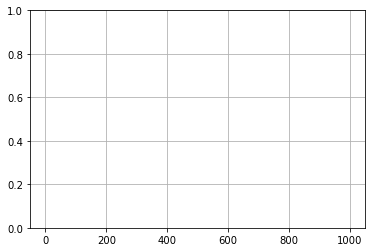

In [199]:
plt.plot(pd.DataFrame(history.history))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.show()

In [116]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs_ManyData_0805 --port=08051

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [333]:
model.save("D:/ME program/2017-PhD/01_research/02Study/34_ballon_like_cover/DeepLearing/SensorCallbi/MyModel/210805_70ms_Mean3ea_wo06_simple_model2.h5")

In [334]:
test_predictions = model.predict(X_test)

In [335]:
X_test

array([[-2.96831568e-02,  1.05923325e-01,  8.01126420e-01, ...,
        -2.54723475e+00,  1.21105303e+00,  1.38317077e+00],
       [-2.96831568e-02,  6.25211510e-01,  9.19713675e-01, ...,
         1.02631546e+00,  4.64798349e-01,  4.10988692e-01],
       [-5.04829508e+00,  7.27825343e-01,  8.01126420e-01, ...,
        -1.65950839e-01, -4.96044590e-01,  4.10988692e-01],
       ...,
       [-2.96831568e-02,  3.30949226e-03, -1.15450663e-02, ...,
         4.83785563e-01,  4.64798349e-01,  1.66115763e-01],
       [ 3.20534004e-01,  6.25211510e-01,  1.03554329e-01, ...,
         8.08653764e-01,  2.50210093e-01, -1.99366221e-01],
       [ 1.49025932e+00,  2.11646668e-01,  3.37240979e-01, ...,
         5.17108559e-02, -2.63231873e+00, -1.17520312e+00]])

In [336]:
test_predictions

array([[-0.3847345 ,  0.74343276],
       [-0.2182278 , -1.0697875 ],
       [ 1.0942713 , -0.04891244],
       ...,
       [-0.9045471 ,  0.12560666],
       [-0.6314339 , -0.7071489 ],
       [ 0.5262971 ,  0.8918469 ]], dtype=float32)

In [337]:
test_predictions_df=pd.DataFrame(test_predictions)

In [338]:
test_predictions_df.columns = ["test_cos","test_sin"]
x2=test_predictions_df["test_sin"]/test_predictions_df["test_cos"]
x1=test_predictions_df["test_sin"]/test_predictions_df["test_sin"]
test_predictions_df["test_theta"] = np.arctan2(x1, x2)
test_predictions_df

,test_cos,test_sin,test_theta
0,-0.384735,0.743433,2.664035
1,-0.218228,-1.069788,0.201231
2,1.094271,-0.048912,1.615465
3,0.896050,0.496682,1.064656
4,-0.861716,-0.617494,0.949025
...,...,...,...
2431,-0.900443,-0.721608,0.895207
2432,1.006521,0.002387,1.568425
2433,-0.904547,0.125607,1.708775
2434,-0.631434,-0.707149,0.728895


In [339]:
k= y_test.to_numpy()
k_df = pd.DataFrame(k)
k_df.columns = ["cos","sin"]
k_df

,cos,sin
0,-0.480836,0.876811
1,-0.322431,-0.946593
2,1.000000,0.000698
3,0.781194,0.624289
4,-0.759725,-0.650244
...,...,...
2431,-0.636213,-0.771514
2432,1.000000,0.000000
2433,-0.979575,0.201078
2434,-0.636751,-0.771069


In [340]:
TestPre = pd.concat( [k_df,test_predictions_df],axis=1)
TestPre.head(5)

,cos,sin,test_cos,test_sin,test_theta
0,-0.480836,0.876811,-0.384735,0.743433,2.664035
1,-0.322431,-0.946593,-0.218228,-1.069788,0.201231
2,1.000000,0.000698,1.094271,-0.048912,1.615465
3,0.781194,0.624289,0.896050,0.496682,1.064656
4,-0.759725,-0.650244,-0.861716,-0.617494,0.949025


<AxesSubplot:xlabel='sin', ylabel='test_sin'>

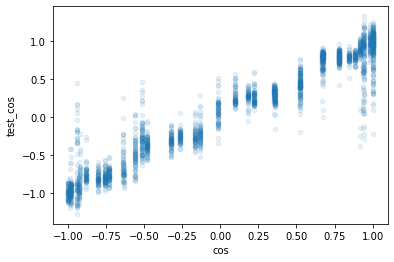

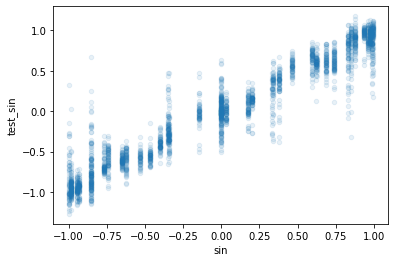

In [341]:
TestPre.plot(kind="scatter", x= "cos",y= "test_cos",alpha = 0.1)
TestPre.plot(kind="scatter", x= "sin",y= "test_sin",alpha = 0.1)

In [259]:
filename2 = 'D:/ME program/2017-PhD/01_research/02Study/34_ballon_like_cover/DeepLearing/SensorCallbi/Data/ManyData_R2Theta10Z4.csv'
SensorTestData = pd.read_csv(filename2)

In [260]:
SensorTestData.describe()

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,z
count,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000,230387.000000
mean,29.690902,30.940809,30.172124,30.508329,27.247522,31.761526,30.184041,31.032320,29.841442,31.885909,0.900053,175.011264,18.000217
std,1.425240,1.832445,2.284756,2.361627,2.947263,2.020764,1.926939,2.465173,1.487616,1.652285,0.574432,103.876853,11.488951
min,20.800000,18.600000,11.600000,10.400000,9.600000,18.200000,15.800000,15.000000,20.000000,21.600000,0.000000,0.000000,0.000000
25%,28.800000,30.200000,29.600000,29.800000,25.200000,30.800000,29.400000,29.800000,29.000000,31.000000,0.400000,90.000000,8.000000
50%,29.800000,31.200000,30.400000,30.800000,27.600000,32.000000,30.400000,31.200000,30.000000,32.000000,1.000000,180.000000,20.000000
75%,30.600000,32.000000,31.400000,31.800000,29.600000,33.000000,31.400000,32.600000,30.800000,33.000000,1.400000,270.000000,28.000000
max,34.800000,38.200000,35.600000,37.000000,35.600000,38.200000,35.800000,38.600000,36.400000,39.000000,1.800000,350.000000,36.000000


In [262]:
SensorTestData_extractZ = SensorTestData[SensorTestData['z']==36]
mask = SensorTestData_extractZ["r"].isin([0])
SensorTestData_extractZr = SensorTestData_extractZ[~mask]
SensorTestData_extractZr.describe()

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09,r,theta,z
count,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.000000,20736.00000,20736.000000,20736.0
mean,29.501948,31.812182,29.082812,30.544695,27.676611,30.607687,29.335503,30.086796,29.666734,31.965046,1.00000,175.000000,36.0
std,1.694815,2.070959,2.533643,3.008598,3.234034,2.270689,2.089830,2.703881,1.764412,1.973786,0.51641,103.885452,0.0
min,21.600000,19.400000,12.000000,10.400000,13.800000,18.400000,17.600000,15.800000,20.000000,21.800000,0.20000,0.000000,36.0
25%,28.600000,31.200000,29.000000,30.200000,25.800000,30.000000,28.800000,28.800000,29.000000,31.000000,0.60000,87.500000,36.0
50%,29.600000,32.000000,29.600000,31.200000,28.800000,31.000000,29.600000,30.400000,29.800000,32.200000,1.00000,175.000000,36.0
75%,30.600000,33.000000,30.200000,32.000000,30.000000,31.800000,30.600000,31.800000,30.800000,33.200000,1.40000,262.500000,36.0
max,34.200000,38.200000,33.800000,37.000000,34.000000,36.200000,34.400000,37.200000,34.400000,38.600000,1.80000,350.000000,36.0


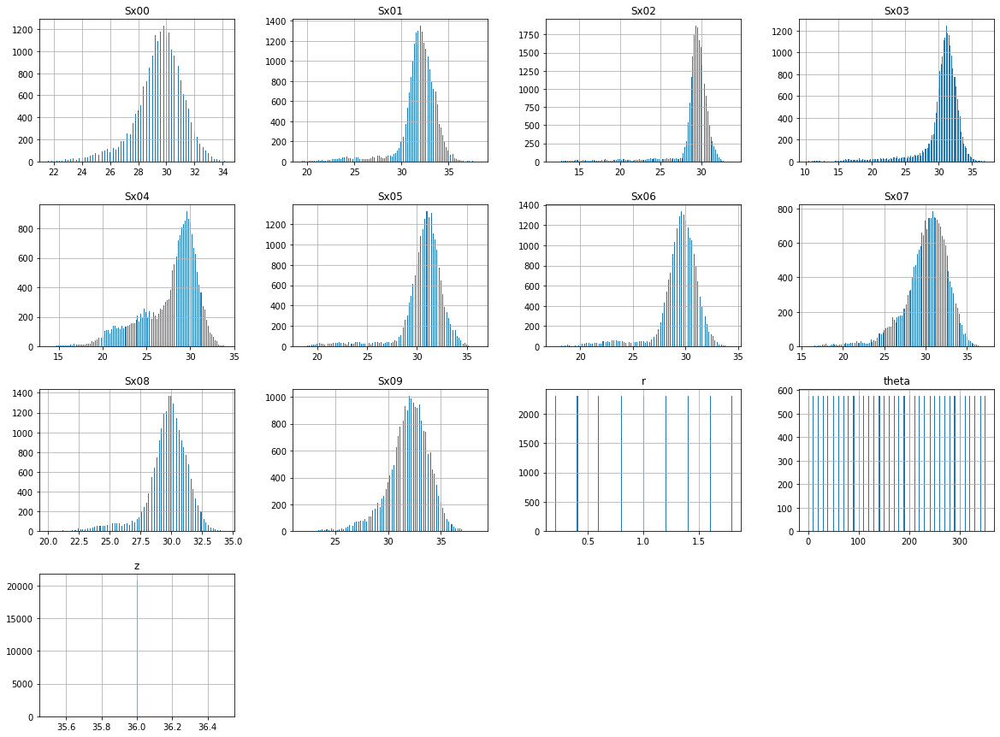

In [263]:
SensorTestData_extractZr.hist(bins=200, figsize=(20,15))
plt.show()

In [268]:
X_Test2 = SensorTestData_extractZr.iloc[:,:10]
y_Test2= SensorTestData_extractZr.iloc[:,11:12]

In [265]:
X_Test2

,Sx00,Sx01,Sx02,Sx03,Sx04,Sx05,Sx06,Sx07,Sx08,Sx09
207411,30.8,32.2,29.4,31.8,30.0,30.8,29.2,32.6,29.6,32.6
207412,30.4,32.0,29.6,32.2,31.2,31.2,28.6,33.2,29.6,32.4
207413,30.4,32.0,29.6,32.6,31.0,31.4,28.0,32.8,30.4,31.4
207414,29.6,31.4,29.6,32.2,30.4,32.2,28.0,32.8,30.8,31.6
207415,29.0,30.6,29.6,32.2,30.0,32.6,27.8,33.4,31.2,31.8
...,...,...,...,...,...,...,...,...,...,...
230382,29.2,32.8,30.0,32.2,26.2,32.6,19.0,32.2,31.4,30.4
230383,29.6,32.4,30.4,32.4,26.4,32.4,18.4,31.8,31.4,30.6
230384,29.2,32.0,30.0,32.2,26.8,32.6,18.4,31.8,31.0,31.2
230385,28.8,31.2,30.4,31.6,26.6,33.0,17.6,32.6,30.6,31.2


In [266]:
y_Test2

,theta
207411,0
207412,0
207413,0
207414,0
207415,0
...,...
230382,350
230383,350
230384,350
230385,350


In [269]:
X_Test2 = scaler.transform(X_Test2)

<AxesSubplot:xlabel='theta', ylabel='t_theta'>

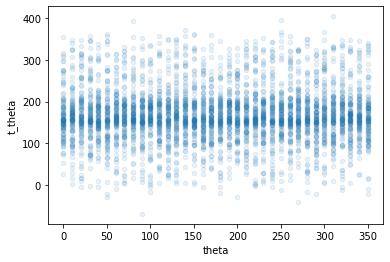

In [274]:
test_predictions2 = model.predict(X_Test2)
test_predictions2_df=pd.DataFrame(test_predictions2)
test_predictions2_df.columns = ["t_theta"]
k2= y_Test2.to_numpy()
k2_df = pd.DataFrame(k)
k2_df.columns = ["theta"]
TestPre2 = pd.concat( [k2_df,test_predictions2_df],axis=1)
TestPre2.head(5)
TestPre2.plot(kind="scatter", x= "theta",y= "t_theta",alpha = 0.1)